In [1]:
import pandas as pd
import seaborn as sb
import matplotlib.pyplot as plt
%matplotlib inline
import glob
import numpy as np
import warnings
warnings.filterwarnings('ignore')
from sklearn.preprocessing import MinMaxScaler, StandardScaler, Normalizer, LabelEncoder, OrdinalEncoder, LabelBinarizer
from sklearn.model_selection import train_test_split
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from sklearn.metrics import mean_absolute_error
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.svm import SVR
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.impute import KNNImputer, SimpleImputer
import nltk
from nltk.tokenize import word_tokenize
from nltk.stem.snowball import SnowballStemmer
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from wordcloud import WordCloud
import os

In [3]:
path = r"C:\Users\Administrator\Documents\diceytech\Dataset"

In [7]:
files = glob.glob(os.path.join(path,"*csv"))
files

['C:\\Users\\Administrator\\Documents\\diceytech\\Dataset\\Post Performance (Stanbic IBTC) January 1, 2013 - July 13, 2023_Facebook.csv',
 'C:\\Users\\Administrator\\Documents\\diceytech\\Dataset\\Post Performance (Stanbic IBTC) January 1, 2013 - July 13, 2023_Instagram.csv',
 'C:\\Users\\Administrator\\Documents\\diceytech\\Dataset\\Post Performance (Stanbic IBTC) January 1, 2013 - July 13, 2023_LinkedIn.csv',
 'C:\\Users\\Administrator\\Documents\\diceytech\\Dataset\\Post Performance (Stanbic IBTC) January 1, 2013 - July 13, 2023_Twitter.csv']

In [8]:
facebook = pd.read_csv(files[0])
facebook

,Date,Post ID,Network,Post Type,Content Type,Profile,Sent by,Link,Post,Linked Content,...,Video Removed from Playlists,Annotation Impressions,Annotation Clickable Impressions,Annotation Closable Impressions,Annotation Closes,Card Impressions,Card Teaser Impressions,Card Teaser Clicks,Poll Votes,Tags
0,12/17/2022 5:08 pm,253788558082460_5441020446025886,Facebook,Post,Video,Stanbic IBTC,Damilare Oyekanmi,https://www.facebook.com/253788558082460/posts...,"We celebrated recently with Novare, one of our...",https://www.facebook.com/StanbicIBTC/videos/53...,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CIB Posts
1,5/4/2019 10:01 am,253788558082460_2001824979945467,Facebook,Post,Photo,Stanbic IBTC,,https://www.facebook.com/253788558082460/posts...,N5k can get you started today. Call 01 280 126...,https://www.facebook.com/StanbicIBTC/photos/a....,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,6/2/2020 9:00 pm,253788558082460_2768996106561680,Facebook,Post,Photo,Stanbic IBTC,,https://www.facebook.com/StanbicIBTC/photos/a....,Still not sure whether to invest in the FGN Bo...,https://www.facebook.com/StanbicIBTC/photos/a....,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,5/9/2022 10:37 am,253788558082460_4808157902645480,Facebook,Post,Photo,Stanbic IBTC,Damilare Oyekanmi,https://www.facebook.com/StanbicIBTC/photos/a....,Let nothing stop you from achieving your goals...,https://www.facebook.com/StanbicIBTC/photos/a....,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,7/18/2021 10:00 am,253788558082460_3890983261029620,Facebook,Post,Photo,Stanbic IBTC,,https://www.facebook.com/StanbicIBTC/photos/a....,"If you were to pick one wish, what would it be...",https://www.facebook.com/StanbicIBTC/photos/a....,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9798,2/1/2013 1:24 pm,253788558082460_282819078512741,Facebook,Post,Photo,Stanbic IBTC,,https://www.facebook.com/media/set/?set=a.2828...,NaN,https://www.facebook.com/StanbicIBTC/photos/a....,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9799,1/17/2013 5:08 pm,253788558082460_271983219596327,Facebook,Post,Photo,Stanbic IBTC,,https://www.facebook.com/StanbicIBTC/photos/a....,NaN,https://www.facebook.com/StanbicIBTC/photos/a....,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9800,1/16/2013 4:58 pm,253788558082460_271477726313543,Facebook,Post,Photo,Stanbic IBTC,,https://www.facebook.com/StanbicIBTC/photos/a....,NaN,https://www.facebook.com/StanbicIBTC/photos/a....,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9801,1/16/2013 4:51 pm,253788558082460_271474996313816,Facebook,Post,Photo,Stanbic IBTC,,https://www.facebook.com/media/set/?set=a.2714...,NaN,https://www.facebook.com/StanbicIBTC/photos/a....,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [9]:
inst = pd.read_csv(files[1])
inst

,Date,Post ID,Network,Post Type,Content Type,Profile,Sent by,Link,Post,Linked Content,...,Video Removed from Playlists,Annotation Impressions,Annotation Clickable Impressions,Annotation Closable Impressions,Annotation Closes,Card Impressions,Card Teaser Impressions,Card Teaser Clicks,Poll Votes,Tags
0,1/30/2023 5:06 pm,18216468940204235,Instagram,Post,Carousel,stanbicibtc,,https://www.instagram.com/p/CoC6CKBIHbV/,The new Naira banknotes in circulation have se...,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,4/15/2022 9:04 am,17971531720518163,Instagram,Post,Photo,stanbicibtc,Blessing Ubah,https://www.instagram.com/p/CcXUQTEMRm7/,We hope the faith that this #GoodFriday restor...,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,5/28/2021 8:45 pm,18008486986321009,Instagram,Post,Video,stanbicibtc,,https://www.instagram.com/p/CPbcdjygiaK/,Reposted from @mzdosunmu My son's entry\n#ITCA...,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,1/4/2023 4:08 pm,17903404469640387,Instagram,Post,Carousel,stanbicibtc,,https://www.instagram.com/p/Cm_2oino-Me/,The new Naira banknotes in circulation have se...,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,12/7/2021 6:52 pm,17950858072558814,Instagram,Post,Photo,stanbicibtc,Blessing Ubah,https://www.instagram.com/p/CXMNAKFsjSs/,"If you were born in June, ‘cut soap for us oh’...",NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,12/24/2014 5:37 pm,17841808444024797,Instagram,Post,Photo,stanbicibtc,,https://www.instagram.com/p/w_xUG5yvRB/,"Withdraw cash up to 5 times, pay bills or tran...",NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9996,12/24/2014 10:28 am,17841674617024797,Instagram,Post,Photo,stanbicibtc,,https://www.instagram.com/p/w_AUutyvQD/,#CardDiaries week 13\n\nI love Christmas! In m...,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9997,12/23/2014 5:14 pm,17842896850024797,Instagram,Post,Photo,stanbicibtc,,https://www.instagram.com/p/w9J5vpyvY4/,Eat-in this holidays. \nInstead of going out t...,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9998,12/23/2014 10:38 am,17841674620024797,Instagram,Post,Photo,stanbicibtc,,https://www.instagram.com/p/w8cnwpSvY5/,"If you do not move forward, you will always be...",NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [5]:
linkd = pd.read_csv(files[2])
linkd 

,Date,Post ID,Network,Post Type,Content Type,Profile,Sent by,Link,Post,Linked Content,...,Video Removed from Playlists,Annotation Impressions,Annotation Clickable Impressions,Annotation Closable Impressions,Annotation Closes,Card Impressions,Card Teaser Impressions,Card Teaser Clicks,Poll Votes,Tags
0,7/13/2023 12:03 pm,7085212016608456704,LinkedIn,Post,Photo,Stanbic IBTC,Blessing Ubah,https://linkedin.com/feed/update/urn:li:share:...,Your money should not be a gamble. Before you ...,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CIB Posts
1,7/12/2023 8:00 pm,7084969706025009152,LinkedIn,Post,Text,Stanbic IBTC,Blessing Ubah,https://linkedin.com/feed/update/urn:li:share:...,"What skill (s) do you have, that no one ever t...",NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,7/12/2023 7:00 pm,7084954641788018688,LinkedIn,Post,Photo,Stanbic IBTC,Blessing Ubah,https://linkedin.com/feed/update/urn:li:ugcPos...,Sade was able to acquire a home loan and make ...,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Weekly Wealth Posts
3,7/11/2023 2:49 pm,7084529022105231360,LinkedIn,Post,Photo,Stanbic IBTC,Blessing Ubah,https://linkedin.com/feed/update/urn:li:share:...,Safeguard every aspect of your operations with...,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Weekly Wealth Posts
4,7/11/2023 9:17 am,7084445462967070721,LinkedIn,Post,Photo,Stanbic IBTC,Blessing Ubah,https://linkedin.com/feed/update/urn:li:share:...,"Together, we can make a difference and build a...",NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7755,5/9/2014 11:24 am,5870478259099037696,LinkedIn,Post,Photo,Stanbic IBTC,,https://linkedin.com/feed/update/urn:li:activi...,We understand that as a Nigerian living outsid...,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7756,5/8/2014 2:15 pm,5870158839160012800,LinkedIn,Post,Photo,Stanbic IBTC,,https://linkedin.com/feed/update/urn:li:activi...,When going for an interview these tips might b...,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7757,5/7/2014 1:28 pm,5869784625840164864,LinkedIn,Post,Link,Stanbic IBTC,,https://linkedin.com/feed/update/urn:li:activi...,Are professional advisers important for small ...,http://www.forbes.com/sites/sage/2014/04/21/do...,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7758,5/6/2014 1:40 pm,5869425201195819008,LinkedIn,Post,Link,Stanbic IBTC,,https://linkedin.com/feed/update/urn:li:activi...,Do you own a business? Here's something on how...,http://socialmediatoday.com/1876456/why-your-b...,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [6]:
twitter = pd.read_csv(files[3])
twitter

,Date,Post ID,Network,Post Type,Content Type,Profile,Sent by,Link,Post,Linked Content,...,Video Removed from Playlists,Annotation Impressions,Annotation Clickable Impressions,Annotation Closable Impressions,Annotation Closes,Card Impressions,Card Teaser Impressions,Card Teaser Clicks,Poll Votes,Tags
0,7/13/2023 10:57 am,1679429829567946759,Twitter,Tweet,Photo,'@StanbicIBTC,Sophia Amuka,https://twitter.com/StanbicIBTC/status/1679429...,Your money should not be a gamble. Before you ...,https://twitter.com/StanbicIBTC/status/1679429...,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CIB Posts
1,7/12/2023 8:03 pm,1679204777081864192,Twitter,Tweet,Text,'@StanbicIBTC,Blessing Ubah,https://twitter.com/StanbicIBTC/status/1679204...,"What skill (s) do you have, that no one ever t...",NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,7/12/2023 7:00 pm,1679189012798660608,Twitter,Tweet,Photo,'@StanbicIBTC,Blessing Ubah,https://twitter.com/StanbicIBTC/status/1679189...,Sade was able to acquire a home loan and make ...,"https://bit.ly/StanbicIBTCHomeLoans, https://t...",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Weekly Wealth Posts
3,7/12/2023 6:20 pm,1679179017084354560,Twitter,Tweet,Photo,'@StanbicIBTC,Blessing Ubah,https://twitter.com/StanbicIBTC/status/1679179...,Here are some mistakes you shouldn’t make duri...,https://twitter.com/StanbicIBTC/status/1679179...,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,7/11/2023 12:50 pm,1678733396992745472,Twitter,Tweet,Photo,'@StanbicIBTC,Sophia Amuka,https://twitter.com/StanbicIBTC/status/1678733...,Safeguard every aspect of your operations with...,https://twitter.com/StanbicIBTC/status/1678733...,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"Insurance Limited Posts, Weekly Wealth Posts"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8524,2/18/2013 7:39 pm,303574464447270914,Twitter,Tweet,Text,'@StanbicIBTC,,https://twitter.com/StanbicIBTC/status/3035744...,FCMB CEO at the Stanbic IBTC sponsored BIT hub...,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8525,2/18/2013 7:13 pm,303567968183390209,Twitter,Tweet,Text,'@StanbicIBTC,,https://twitter.com/StanbicIBTC/status/3035679...,Next event at the Stanbic IBTC sponsored BIT H...,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8526,2/18/2013 11:18 am,303448511721132033,Twitter,Tweet,Text,'@StanbicIBTC,,https://twitter.com/StanbicIBTC/status/3034485...,Now on at the Stanbic IBTC sponsored BIT Hub: ...,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8527,2/18/2013 9:01 am,303413997238099969,Twitter,Tweet,Photo,'@StanbicIBTC,,https://twitter.com/StanbicIBTC/status/3034139...,'@SMWLagos starts today. We're proud sponsors ...,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [7]:
df = []
for file in files:
    dfx = pd.read_csv(file)
    df.append(dfx)
    
df1 = pd.concat(df, axis= 0)

In [8]:
df1

,Date,Post ID,Network,Post Type,Content Type,Profile,Sent by,Link,Post,Linked Content,...,Video Removed from Playlists,Annotation Impressions,Annotation Clickable Impressions,Annotation Closable Impressions,Annotation Closes,Card Impressions,Card Teaser Impressions,Card Teaser Clicks,Poll Votes,Tags
0,12/17/2022 5:08 pm,253788558082460_5441020446025886,Facebook,Post,Video,Stanbic IBTC,Damilare Oyekanmi,https://www.facebook.com/253788558082460/posts...,"We celebrated recently with Novare, one of our...",https://www.facebook.com/StanbicIBTC/videos/53...,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CIB Posts
1,5/4/2019 10:01 am,253788558082460_2001824979945467,Facebook,Post,Photo,Stanbic IBTC,,https://www.facebook.com/253788558082460/posts...,N5k can get you started today. Call 01 280 126...,https://www.facebook.com/StanbicIBTC/photos/a....,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,6/2/2020 9:00 pm,253788558082460_2768996106561680,Facebook,Post,Photo,Stanbic IBTC,,https://www.facebook.com/StanbicIBTC/photos/a....,Still not sure whether to invest in the FGN Bo...,https://www.facebook.com/StanbicIBTC/photos/a....,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,5/9/2022 10:37 am,253788558082460_4808157902645480,Facebook,Post,Photo,Stanbic IBTC,Damilare Oyekanmi,https://www.facebook.com/StanbicIBTC/photos/a....,Let nothing stop you from achieving your goals...,https://www.facebook.com/StanbicIBTC/photos/a....,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,7/18/2021 10:00 am,253788558082460_3890983261029620,Facebook,Post,Photo,Stanbic IBTC,,https://www.facebook.com/StanbicIBTC/photos/a....,"If you were to pick one wish, what would it be...",https://www.facebook.com/StanbicIBTC/photos/a....,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8524,2/18/2013 7:39 pm,303574464447270914,Twitter,Tweet,Text,'@StanbicIBTC,,https://twitter.com/StanbicIBTC/status/3035744...,FCMB CEO at the Stanbic IBTC sponsored BIT hub...,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8525,2/18/2013 7:13 pm,303567968183390209,Twitter,Tweet,Text,'@StanbicIBTC,,https://twitter.com/StanbicIBTC/status/3035679...,Next event at the Stanbic IBTC sponsored BIT H...,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8526,2/18/2013 11:18 am,303448511721132033,Twitter,Tweet,Text,'@StanbicIBTC,,https://twitter.com/StanbicIBTC/status/3034485...,Now on at the Stanbic IBTC sponsored BIT Hub: ...,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8527,2/18/2013 9:01 am,303413997238099969,Twitter,Tweet,Photo,'@StanbicIBTC,,https://twitter.com/StanbicIBTC/status/3034139...,'@SMWLagos starts today. We're proud sponsors ...,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [9]:
df1.drop(columns = ['Link', 'Linked Content', 'Post ID', 'Post Type', 'Profile'], inplace= True)

In [10]:
df1.select_dtypes('object').info()

<class 'pandas.core.frame.DataFrame'>
Index: 36092 entries, 0 to 8528
Data columns (total 72 columns):
 #   Column                             Non-Null Count  Dtype 
---  ------                             --------------  ----- 
 0   Date                               36092 non-null  object
 1   Network                            36092 non-null  object
 2   Content Type                       36092 non-null  object
 3   Sent by                            36092 non-null  object
 4   Post                               35800 non-null  object
 5   Impressions                        31583 non-null  object
 6   Organic Impressions                31583 non-null  object
 7   Viral Impressions                  8893 non-null   object
 8   Non-viral Impressions              8893 non-null   object
 9   Fan Impressions                    8893 non-null   object
 10  Fan Organic Impressions            8893 non-null   object
 11  Non-fan Impressions                8893 non-null   object
 12  Non-fan Or

In [11]:
df1.select_dtypes('number').info()

<class 'pandas.core.frame.DataFrame'>
Index: 36092 entries, 0 to 8528
Data columns (total 70 columns):
 #   Column                                       Non-Null Count  Dtype  
---  ------                                       --------------  -----  
 0   Paid Impressions                             8893 non-null   float64
 1   Fan Paid Impressions                         8893 non-null   float64
 2   Non-fan Paid Impressions                     8893 non-null   float64
 3   Paid Reach                                   8893 non-null   float64
 4   Fan Paid Reach                               8893 non-null   float64
 5   Dislikes                                     0 non-null      float64
 6   Love Reactions                               8893 non-null   float64
 7   Haha Reactions                               8893 non-null   float64
 8   Wow Reactions                                8893 non-null   float64
 9   Sad Reactions                                8893 non-null   float64
 10  Angr

In [12]:
df1.select_dtypes('object')

,Date,Network,Content Type,Sent by,Post,Impressions,Organic Impressions,Viral Impressions,Non-viral Impressions,Fan Impressions,...,Video Length (Seconds),Video View Time (Seconds),Organic Video View Time (Seconds),Paid Video View Time (Seconds),Unique Video Views,Unique Organic Video Views,Unique 10-Second Video Views,Unique Full Video Views,Unique Organic 95% Video Views,Tags
0,12/17/2022 5:08 pm,Facebook,Video,Damilare Oyekanmi,"We celebrated recently with Novare, one of our...","207,378","207,378",5,"207,373","1,147",...,84.07,"14,824.6","14,824.6",0,975,975,263,62,19,CIB Posts
1,5/4/2019 10:01 am,Facebook,Photo,,N5k can get you started today. Call 01 280 126...,"125,784","125,784","23,926","101,858","103,287",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,6/2/2020 9:00 pm,Facebook,Photo,,Still not sure whether to invest in the FGN Bo...,"89,699","89,699","9,319","80,380","79,873",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,5/9/2022 10:37 am,Facebook,Photo,Damilare Oyekanmi,Let nothing stop you from achieving your goals...,"79,118","79,118",170,"78,948","3,352",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,7/18/2021 10:00 am,Facebook,Photo,,"If you were to pick one wish, what would it be...","76,759","76,759","20,443","56,316","55,174",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8524,2/18/2013 7:39 pm,Twitter,Text,,FCMB CEO at the Stanbic IBTC sponsored BIT hub...,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8525,2/18/2013 7:13 pm,Twitter,Text,,Next event at the Stanbic IBTC sponsored BIT H...,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8526,2/18/2013 11:18 am,Twitter,Text,,Now on at the Stanbic IBTC sponsored BIT Hub: ...,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8527,2/18/2013 9:01 am,Twitter,Photo,,'@SMWLagos starts today. We're proud sponsors ...,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [13]:
df1['Date'] = pd.to_datetime(df1['Date'])

In [14]:
columns = []
for i in df1.columns:
    columns.append(i)
columns

['Date',
 'Network',
 'Content Type',
 'Sent by',
 'Post',
 'Impressions',
 'Organic Impressions',
 'Viral Impressions',
 'Non-viral Impressions',
 'Paid Impressions',
 'Fan Impressions',
 'Fan Organic Impressions',
 'Fan Paid Impressions',
 'Non-fan Impressions',
 'Non-fan Organic Impressions',
 'Non-fan Paid Impressions',
 'Reach',
 'Organic Reach',
 'Viral Reach',
 'Non-viral Reach',
 'Paid Reach',
 'Fan Reach',
 'Fan Paid Reach',
 'Potential Reach',
 'Engagement Rate (per Impression)',
 'Engagement Rate (per Reach)',
 'Engagements',
 'Reactions',
 'Likes',
 'Dislikes',
 'Love Reactions',
 'Haha Reactions',
 'Wow Reactions',
 'Sad Reactions',
 'Angry Reactions',
 'Comments',
 'Shares',
 'Saves',
 'Click-Through Rate',
 'Post Link Clicks',
 'Other Post Clicks',
 'Post Clicks (All)',
 'Post Media Clicks',
 'Post Hashtag Clicks',
 'Post Detail Expand Clicks',
 'Profile Clicks',
 'Post Photo View Clicks',
 'Post Video Play Clicks',
 'Other Engagements',
 'Answers',
 'App Engagements',
 

In [15]:
df1['Sent by'].unique()

array(['Damilare Oyekanmi', ' ', 'Aramide Salami', 'Blessing Ubah',
       'Sophia Amuka', 'Kemi Amoo', 'Dunni Ogunsanya', 'Lilian Ibekwe',
       'Rebecca Oyebode', 'Kanayo Obiano', 'Philip Nwagwunor',
       'Patience Nnaji'], dtype=object)

In [16]:
for i in columns:
    print(i, df1[i].unique())

Date <DatetimeArray>
['2022-12-17 17:08:00', '2019-05-04 10:01:00', '2020-06-02 21:00:00',
 '2022-05-09 10:37:00', '2021-07-18 10:00:00', '2023-02-09 13:31:00',
 '2023-03-26 11:55:00', '2023-01-04 17:44:00', '2017-12-29 10:00:00',
 '2020-07-22 10:00:00',
 ...
 '2013-02-19 10:12:00', '2013-02-18 20:49:00', '2013-02-18 20:41:00',
 '2013-02-18 19:57:00', '2013-02-18 19:55:00', '2013-02-18 19:39:00',
 '2013-02-18 19:13:00', '2013-02-18 11:18:00', '2013-02-18 09:01:00',
 '2013-02-17 09:01:00']
Length: 27656, dtype: datetime64[ns]
Network ['Facebook' 'Instagram' 'LinkedIn' 'Twitter']
Content Type ['Video' 'Photo' 'Text' 'Link' 'Carousel' 'Poll' 'Document']
Sent by ['Damilare Oyekanmi' ' ' 'Aramide Salami' 'Blessing Ubah' 'Sophia Amuka'
 'Kemi Amoo' 'Dunni Ogunsanya' 'Lilian Ibekwe' 'Rebecca Oyebode'
 'Kanayo Obiano' 'Philip Nwagwunor' 'Patience Nnaji']
Post ['We celebrated recently with Novare, one of our top clients on the 6th anniversary of their Novare Lekki mall opening. \n#TrustedPartne

Post Hashtag Clicks [ nan   0.   1.   2.   3.   4.   5.   6.  11.   7.  16.  30. 661.  12.
  19.  48. 812.  10.  13.   9.  24.  29.   8.  14.  36.  20.  15.  26.
  17.  34.  25.  28.  22.  21.  35.  23.  73.  42.  18.  76.  31.  65.
 121.]
Post Detail Expand Clicks [nan '7' '12' '10' '5' '1' '16' '2' '4' '0' '3' '6' '15' '13' '8' '9' '19'
 '18' '11' '20' '17' '24' '14' '57' '39' '28' '25' '54' '48' '21' '402'
 '50' '40' '104' '22' '33' '58' '32' '51' '27' '88' '31' '44' '46' '43'
 '23' '35' '70' '29' '26' '68' '37' '52' '38' '34' '99' '98' '73' '97'
 '59' '75' '49' '221' '41' '208' '130' '110' '45' '135' '66' '56' '92'
 '62' '159' '85' '42' '3,780' '30' '61' '71' '94' '65' '53' '87' '55'
 '143' '108' '72' '69' '90' '84' '1,146' '36' '1,553' '79' '47' '76' '529'
 '77' '83' '251' '169' '82' '165' '235' '102' '175' '141' '162' '363'
 '500' '305' '95' '174' '63' '81' '60' '114' '112' '89' '80' '153' '166'
 '279' '275' '460' '171' '280' '74' '148' '281' '133' '91' '490' '93' '67'
 '111' '12

Average Video Time Watched (Seconds) [  3.47    nan  20.31  16.68   5.5   11.24   5.95   6.2   11.85   5.69
   7.38   3.73   2.91   2.88   7.49   5.88 166.11   8.81   2.99   2.85
   7.8   11.61   3.54   3.43   9.13   4.24   3.29   4.57   3.71   2.59
   7.61 125.4    5.29   5.39   7.28   2.6    4.04   4.93   5.37   4.18
   2.94   3.6    5.15   5.31   5.33  20.98   5.86   4.22   0.     3.56
  12.02   3.76   4.28   6.09   7.82   8.87   7.65   9.25   3.79   3.34
   7.92  89.63   2.66   2.63   3.1    8.39   8.27   2.79   5.13   4.47
   3.91   3.45   3.46   6.22   3.04   5.34 327.53  14.1    2.89   8.86
   2.87  12.28   3.12  10.65   3.3    3.68   4.43   7.11   6.94  49.61
   5.26   6.53   3.96   6.34   8.76   7.5    3.42   7.66   8.25   2.96
   6.65  24.03   2.39   3.77  20.08 132.91   9.24   8.4    3.98   2.38
   6.72   4.6    7.73   4.8    3.48  25.97   7.32  11.16  15.98   3.44
  39.92   7.16   3.32   8.7   37.1    5.96   6.78   4.35   6.73   3.38
   6.24   7.6   69.7    5.2    4.55   2.

In [17]:
df1['Impressions'] = df1['Impressions'].str.replace(',', '')
df1['Organic Impressions'] = df1['Organic Impressions'].str.replace(',', '')

In [18]:
def string_replacer(df1, col):
    df1[col] =  df1[col].apply(lambda x : str(x))
    df1[col] =  df1[col].str.replace(',', '')
    df1[col] = df1[col].astype('float')
    return df1[col] 

In [19]:
commaColumn = ['Impressions','Organic Impressions','Viral Impressions','Non-viral Impressions', 'Fan Impressions', 
               'Fan Organic Impressions',
 'Non-fan Impressions','Non-fan Organic Impressions', 'Reach', 'Organic Reach', 'Viral Reach', 'Non-viral Reach', 'Fan Reach',
 'Potential Reach', 'Engagements', 'Reactions', 'Likes', 'Comments', 'Post Link Clicks', 'Other Post Clicks', 
 'Post Clicks (All)', 'Post Media Clicks', 'Post Detail Expand Clicks', 'Post Photo View Clicks', 'Other Engagements', 
  'Unique Full Video Views', 'Unique 10-Second Video Views', 'Unique Organic Video Views',
 'Unique Video Views', 'Paid Video View Time (Seconds)', 'Video Length (Seconds)', 'Organic Video View Time (Seconds)',
 'Video View Time (Seconds)', 'Video Length (Seconds)', '95% Video Views', 'Autoplay Full Video Views', 'Sound off Video Views'
]

In [20]:
for i in commaColumn:
    string_replacer(df1, i)

In [21]:
df1.select_dtypes('object')

,Network,Content Type,Sent by,Post,Engagement Rate (per Impression),Engagement Rate (per Reach),Shares,Click-Through Rate,Post Video Play Clicks,bit.ly Link Clicks,...,Sound on Video Views,10-Second Video Views,Organic 10-Second Video Views,Autoplay 10-Second Video Views,Sound on 10-Second Video Views,Sound off 10-Second Video Views,Autoplay Partial Video Views,Organic 95% Video Views,Unique Organic 95% Video Views,Tags
0,Facebook,Video,Damilare Oyekanmi,"We celebrated recently with Novare, one of our...",0.49%,0.49%,2.0,0%,52.0,NaN,...,634,270,270,261,186,84,897,19,19,CIB Posts
1,Facebook,Photo,,N5k can get you started today. Call 01 280 126...,4.67%,6.39%,47.0,0%,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Facebook,Photo,,Still not sure whether to invest in the FGN Bo...,5.29%,5.62%,29.0,0%,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,Facebook,Photo,Damilare Oyekanmi,Let nothing stop you from achieving your goals...,0.56%,0.57%,2.0,0%,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Facebook,Photo,,"If you were to pick one wish, what would it be...",6.16%,6.39%,10.0,0%,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8524,Twitter,Text,,FCMB CEO at the Stanbic IBTC sponsored BIT hub...,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8525,Twitter,Text,,Next event at the Stanbic IBTC sponsored BIT H...,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8526,Twitter,Text,,Now on at the Stanbic IBTC sponsored BIT Hub: ...,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8527,Twitter,Photo,,'@SMWLagos starts today. We're proud sponsors ...,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [22]:
df1.select_dtypes('object').columns

Index(['Network', 'Content Type', 'Sent by', 'Post',
       'Engagement Rate (per Impression)', 'Engagement Rate (per Reach)',
       'Shares', 'Click-Through Rate', 'Post Video Play Clicks',
       'bit.ly Link Clicks', 'Engaged Users', 'Engaged Fans',
       'Users Talking About This', 'Unique Reactions', 'Unique Post Clicks',
       'Unique Post Photo View Clicks', 'Unique Other Post Clicks',
       'Video Views', 'Media Views', 'Organic Video Views',
       'Partial Video Views', 'Organic Partial Video Views',
       'Full Video Views', 'Organic Full Video Views', 'Autoplay Video Views',
       'Sound on Video Views', '10-Second Video Views',
       'Organic 10-Second Video Views', 'Autoplay 10-Second Video Views',
       'Sound on 10-Second Video Views', 'Sound off 10-Second Video Views',
       'Autoplay Partial Video Views', 'Organic 95% Video Views',
       'Unique Organic 95% Video Views', 'Tags'],
      dtype='object')

In [23]:
others =  ['Post Video Play Clicks', 'Shares', 
       'bit.ly Link Clicks', 'Engaged Users', 'Engaged Fans',
       'Users Talking About This', 'Unique Reactions', 'Unique Post Clicks',
       'Unique Post Photo View Clicks', 'Unique Other Post Clicks',
       'Video Views', 'Media Views', 'Organic Video Views',
       'Partial Video Views', 'Organic Partial Video Views',
       'Full Video Views', 'Organic Full Video Views', 'Autoplay Video Views',
       'Sound on Video Views', '10-Second Video Views',
       'Organic 10-Second Video Views', 'Autoplay 10-Second Video Views',
       'Sound on 10-Second Video Views', 'Sound off 10-Second Video Views',
       'Autoplay Partial Video Views', 'Organic 95% Video Views',
       'Unique Organic 95% Video Views']

In [24]:
for i in others:
    string_replacer(df1, i)

In [25]:
df1.select_dtypes('float')

,Impressions,Organic Impressions,Viral Impressions,Non-viral Impressions,Paid Impressions,Fan Impressions,Fan Organic Impressions,Fan Paid Impressions,Non-fan Impressions,Non-fan Organic Impressions,...,Subscribers Lost from Video,Video Removed from Playlists,Annotation Impressions,Annotation Clickable Impressions,Annotation Closable Impressions,Annotation Closes,Card Impressions,Card Teaser Impressions,Card Teaser Clicks,Poll Votes
0,207378.0,207378.0,5.0,207373.0,0.0,1147.0,1147.0,0.0,206231.0,206231.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,125784.0,125784.0,23926.0,101858.0,0.0,103287.0,103287.0,0.0,22497.0,22497.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,89699.0,89699.0,9319.0,80380.0,0.0,79873.0,79873.0,0.0,9826.0,9826.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,79118.0,79118.0,170.0,78948.0,0.0,3352.0,3352.0,0.0,75766.0,75766.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,76759.0,76759.0,20443.0,56316.0,0.0,55174.0,55174.0,0.0,21585.0,21585.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8524,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8525,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8526,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8527,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [26]:
df1.shape

(36092, 142)

In [27]:
df1.select_dtypes('object').columns

Index(['Network', 'Content Type', 'Sent by', 'Post',
       'Engagement Rate (per Impression)', 'Engagement Rate (per Reach)',
       'Click-Through Rate', 'Tags'],
      dtype='object')

In [28]:
df1['Engagement Rate (per Impression)'] = df1['Engagement Rate (per Impression)'].str.replace('%', ' ')
df1['Engagement Rate (per Reach)'] = df1['Engagement Rate (per Reach)'].str.replace('%', ' ')
df1['Click-Through Rate'] = df1['Click-Through Rate'].str.replace('%', ' ')

In [29]:
columns2 = ['Engagement Rate (per Impression)','Engagement Rate (per Reach)',  'Click-Through Rate']
for i in columns2:
    string_replacer(df1, i)

In [30]:
df1['bit.ly Link Clicks'].unique()

array([  nan,   10.,   14.,    7.,    5.,   73.,    8.,   76., 2129.,
       2224.,   72., 1130.,   97.,   19.,  118.,  380.,  767.,  212.,
         56.,  159.,  141.,   31.,  173.,  132.,  232.])

In [31]:
#df2 = df1.dropna()

In [32]:
df1[commaColumn].describe().T

,count,mean,std,min,25%,50%,75%,max
Impressions,30882.0,3345.702383,4726.251920,0.0,1085.000,2119.00,3809.750,207378.00
Organic Impressions,30882.0,3327.502234,4660.099900,0.0,1085.000,2118.00,3802.000,207378.00
Viral Impressions,8893.0,623.155066,1650.699781,0.0,5.000,88.00,544.000,35816.00
Non-viral Impressions,8893.0,5234.547959,6341.260127,0.0,1888.000,3784.00,6564.000,207373.00
Fan Impressions,8893.0,4919.463398,5747.002971,0.0,1678.000,3483.00,6207.000,103287.00
Fan Organic Impressions,8893.0,4919.463398,5747.002971,0.0,1678.000,3483.00,6207.000,103287.00
Non-fan Impressions,8893.0,938.261779,3067.161092,0.0,263.000,466.00,849.000,206231.00
Non-fan Organic Impressions,8893.0,875.059597,3002.945270,-1930.0,242.000,449.00,804.000,206231.00
Reach,17409.0,3397.021081,5041.931326,0.0,656.000,2161.00,4196.000,207378.00
Organic Reach,17409.0,3379.959044,5011.693645,0.0,654.000,2157.00,4173.000,207378.00


In [33]:
selected_names = [
    "Paid Impressions [ 0. nan]",
    "Fan Paid Impressions [ 0. nan]",
    "Non-fan Paid Impressions [ 0. nan]",
    "Paid Reach [ 0. nan]",
    "Fan Paid Reach [ 0. nan]",
    "Dislikes [nan]",
    "Saves [nan]",
    "Post Hashtag Clicks [nan]",
    "Profile Clicks [nan]",
    "App Engagements [nan]",
    "App Install Attempts [nan]",
    "App Opens [nan]",
    "Follows from Post [nan]",
    "Unfollows from Post [nan]",
    "Subscribers Gained from Video [nan]",
    "Annotation Clicks [nan]",
    "Card Clicks [nan]",
    "Full Video View Rate [nan]",
    "Follow Video Views [nan]",
    "For You Video Views [nan]",
    "Hashtag Video Views [nan]",
    "Business Account Video Views [nan]",
    "Sound Video Views [nan]",
    "Unspecified Video Views [nan]",
    "Video Ad Break Ad Impressions [nan]",
    "Video Ad Break Ad Earnings [nan]",
    "Video Ad Break Ad Cost per Impression (CPM) [nan]",
    "YouTube Premium Views [nan]",
    "Estimated Minutes Watched [nan]",
    "Estimated Premium Minutes Watched [nan]",
    "Story Taps Back [nan]",
    "Story Taps Forward [nan]",
    "Story Exits [nan]",
    "Story Replies [nan]",
    "Video Added to Playlists [nan]",
    "Subscribers Lost from Video [nan]",
    "Video Removed from Playlists [nan]",
    "Annotation Impressions [nan]",
    "Annotation Clickable Impressions [nan]",
    "Annotation Closable Impressions [nan]",
    "Annotation Closes [nan]", 
    "Click to Play Partial Video Views [nan]",
    "Card Impressions [nan]",
    "Card Teaser Impressions [nan]",
    "Card Teaser Clicks [nan]",
    "Poll Votes [nan]"
]

# Extracting names from the list
names_only1 = [name.split("[")[0].strip() for name in selected_names]

names_only1


['Paid Impressions',
 'Fan Paid Impressions',
 'Non-fan Paid Impressions',
 'Paid Reach',
 'Fan Paid Reach',
 'Dislikes',
 'Saves',
 'Post Hashtag Clicks',
 'Profile Clicks',
 'App Engagements',
 'App Install Attempts',
 'App Opens',
 'Follows from Post',
 'Unfollows from Post',
 'Subscribers Gained from Video',
 'Annotation Clicks',
 'Card Clicks',
 'Full Video View Rate',
 'Follow Video Views',
 'For You Video Views',
 'Hashtag Video Views',
 'Business Account Video Views',
 'Sound Video Views',
 'Unspecified Video Views',
 'Video Ad Break Ad Impressions',
 'Video Ad Break Ad Earnings',
 'Video Ad Break Ad Cost per Impression (CPM)',
 'YouTube Premium Views',
 'Estimated Minutes Watched',
 'Estimated Premium Minutes Watched',
 'Story Taps Back',
 'Story Taps Forward',
 'Story Exits',
 'Story Replies',
 'Video Added to Playlists',
 'Subscribers Lost from Video',
 'Video Removed from Playlists',
 'Annotation Impressions',
 'Annotation Clickable Impressions',
 'Annotation Closable Impre

In [34]:
for i in names_only1:
    mean = df1[i].mean()
    df1[i].fillna(mean, inplace = True)

for i in names_only1:
    df1[i].fillna(0, inplace = True)

In [35]:
df1[commaColumn].isna().sum()

Impressions                           5210
Organic Impressions                   5210
Viral Impressions                    27199
Non-viral Impressions                27199
Fan Impressions                      27199
Fan Organic Impressions              27199
Non-fan Impressions                  27199
Non-fan Organic Impressions          27199
Reach                                18683
Organic Reach                        18683
Viral Reach                          27199
Non-viral Reach                      27199
Fan Reach                            27199
Potential Reach                      27643
Engagements                           3025
Reactions                             3025
Likes                                 3025
Comments                              3025
Post Link Clicks                     24408
Other Post Clicks                    19357
Post Clicks (All)                    13025
Post Media Clicks                    29399
Post Detail Expand Clicks            28250
Post Photo 

In [36]:
df1[others].isna().sum()

Post Video Play Clicks             35168
Shares                             13025
bit.ly Link Clicks                 36029
Engaged Users                      27199
Engaged Fans                       27199
Users Talking About This           27199
Unique Reactions                   27199
Unique Post Clicks                 27199
Unique Post Photo View Clicks      28411
Unique Other Post Clicks           27199
Video Views                        32072
Media Views                        29394
Organic Video Views                32974
Partial Video Views                35170
Organic Partial Video Views        35170
Full Video Views                   35165
Organic Full Video Views           35165
Autoplay Video Views               35165
Sound on Video Views               35165
10-Second Video Views              35165
Organic 10-Second Video Views      35165
Autoplay 10-Second Video Views     35165
Sound on 10-Second Video Views     35165
Sound off 10-Second Video Views    35165
Autoplay Partial

In [37]:
columns3 = columns2 + others
columns3

['Engagement Rate (per Impression)',
 'Engagement Rate (per Reach)',
 'Click-Through Rate',
 'Post Video Play Clicks',
 'Shares',
 'bit.ly Link Clicks',
 'Engaged Users',
 'Engaged Fans',
 'Users Talking About This',
 'Unique Reactions',
 'Unique Post Clicks',
 'Unique Post Photo View Clicks',
 'Unique Other Post Clicks',
 'Video Views',
 'Media Views',
 'Organic Video Views',
 'Partial Video Views',
 'Organic Partial Video Views',
 'Full Video Views',
 'Organic Full Video Views',
 'Autoplay Video Views',
 'Sound on Video Views',
 '10-Second Video Views',
 'Organic 10-Second Video Views',
 'Autoplay 10-Second Video Views',
 'Sound on 10-Second Video Views',
 'Sound off 10-Second Video Views',
 'Autoplay Partial Video Views',
 'Organic 95% Video Views',
 'Unique Organic 95% Video Views']

In [38]:
df1.isna().sum().to_dict()

{'Date': 0,
 'Network': 0,
 'Content Type': 0,
 'Sent by': 0,
 'Post': 292,
 'Impressions': 5210,
 'Organic Impressions': 5210,
 'Viral Impressions': 27199,
 'Non-viral Impressions': 27199,
 'Paid Impressions': 0,
 'Fan Impressions': 27199,
 'Fan Organic Impressions': 27199,
 'Fan Paid Impressions': 0,
 'Non-fan Impressions': 27199,
 'Non-fan Organic Impressions': 27199,
 'Non-fan Paid Impressions': 0,
 'Reach': 18683,
 'Organic Reach': 18683,
 'Viral Reach': 27199,
 'Non-viral Reach': 27199,
 'Paid Reach': 0,
 'Fan Reach': 27199,
 'Fan Paid Reach': 0,
 'Potential Reach': 27643,
 'Engagement Rate (per Impression)': 5943,
 'Engagement Rate (per Reach)': 21098,
 'Engagements': 3025,
 'Reactions': 3025,
 'Likes': 3025,
 'Dislikes': 0,
 'Love Reactions': 27199,
 'Haha Reactions': 27199,
 'Wow Reactions': 27199,
 'Sad Reactions': 27199,
 'Angry Reactions': 27199,
 'Comments': 3025,
 'Shares': 13025,
 'Saves': 0,
 'Click-Through Rate': 17254,
 'Post Link Clicks': 24408,
 'Other Post Clicks':

In [39]:
for i in commaColumn:
    print(i, df1[i].unique())

Impressions [2.07378e+05 1.25784e+05 8.96990e+04 ... 1.43000e+02 1.81110e+04
 3.04450e+04]
Organic Impressions [2.07378e+05 1.25784e+05 8.96990e+04 ... 1.43000e+02 1.81110e+04
 3.04450e+04]
Viral Impressions [5.0000e+00 2.3926e+04 9.3190e+03 ... 7.1800e+02 4.3100e+02        nan]
Non-viral Impressions [2.07373e+05 1.01858e+05 8.03800e+04 ... 0.00000e+00 1.70000e+02
         nan]
Fan Impressions [  1147. 103287.  79873. ...    196.    158.     nan]
Fan Organic Impressions [  1147. 103287.  79873. ...    196.    158.     nan]
Non-fan Impressions [2.06231e+05 2.24970e+04 9.82600e+03 ... 4.00000e+00 1.50000e+01
         nan]
Non-fan Organic Impressions [2.06231e+05 2.24970e+04 9.82600e+03 ... 1.00000e+00 1.50000e+01
         nan]
Reach [2.07378e+05 9.20090e+04 8.43470e+04 ... 7.00000e+00 5.00000e+00
 1.00000e+00]
Organic Reach [2.07378e+05 9.20090e+04 8.43470e+04 ... 7.00000e+00 5.00000e+00
 1.00000e+00]
Viral Reach [4.0000e+00 1.7238e+04 8.9100e+03 ... 8.0400e+02 3.8700e+02        nan]
Non

In [40]:
len(commaColumn)

37

In [41]:
df3 = df1[commaColumn]
imputer = KNNImputer(n_neighbors = 5)

In [42]:
df4 = pd.DataFrame(imputer.fit_transform(df3), columns = df3.columns)

In [43]:
df4['Video Length (Seconds)']

,Video Length (Seconds),Video Length (Seconds)
0,84.070000,84.070000
1,24.076000,24.076000
2,60.390000,60.390000
3,62.104000,62.104000
4,66.124000,66.124000
...,...,...
36087,186.416095,186.416095
36088,186.416095,186.416095
36089,186.416095,186.416095
36090,186.416095,186.416095


In [44]:
#Checking for duplicate
df4.columns.duplicated().sum()

1

In [45]:
df4 = df4.loc[:, ~df4.columns.duplicated(keep='last')]

In [46]:
df4.columns.duplicated().sum()

0

In [47]:
df4['Video Length (Seconds)']

0         84.070000
1         24.076000
2         60.390000
3         62.104000
4         66.124000
            ...    
36087    186.416095
36088    186.416095
36089    186.416095
36090    186.416095
36091    186.416095
Name: Video Length (Seconds), Length: 36092, dtype: float64

In [48]:
df1.drop(columns = commaColumn,inplace = True)

In [49]:
for i in commaColumn:
    df1[i] = df4[i]

In [50]:
df1.shape

(36092, 142)

In [51]:
df1[commaColumn]

,Impressions,Organic Impressions,Viral Impressions,Non-viral Impressions,Fan Impressions,Fan Organic Impressions,Non-fan Impressions,Non-fan Organic Impressions,Reach,Organic Reach,...,Unique Organic Video Views,Unique Video Views,Paid Video View Time (Seconds),Video Length (Seconds),Organic Video View Time (Seconds),Video View Time (Seconds),Video Length (Seconds),95% Video Views,Autoplay Full Video Views,Sound off Video Views
0,207378.0,207378.0,5.0,207373.0,1147.0,1147.0,206231.0,206231.0,207378.0,207378.0,...,975.0,975.0,0.0,84.070,14824.600,14824.600,84.070,19.0,63.0,348.0
1,125784.0,125784.0,23926.0,101858.0,103287.0,103287.0,22497.0,22497.0,92009.0,92009.0,...,2369.4,2369.4,0.0,24.076,89656.594,89656.594,24.076,537.4,1165.4,691.4
2,89699.0,89699.0,9319.0,80380.0,79873.0,79873.0,9826.0,9826.0,84347.0,84347.0,...,3354.2,3354.2,0.0,60.390,117159.432,117159.432,60.390,684.6,1439.6,990.2
3,79118.0,79118.0,170.0,78948.0,3352.0,3352.0,75766.0,75766.0,78407.0,78407.0,...,2598.8,2598.8,0.0,62.104,94218.874,94218.874,62.104,552.4,1191.8,759.4
4,76759.0,76759.0,20443.0,56316.0,55174.0,55174.0,21585.0,21585.0,74035.0,74035.0,...,2855.4,2855.4,0.0,66.124,101674.090,101674.090,66.124,587.4,1253.2,854.4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8524,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,13.550,0.094,0.094,13.550,0.0,0.0,0.0
8525,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,13.550,0.094,0.094,13.550,0.0,0.0,0.0
8526,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,2.6,2.6,0.0,3.338,32.878,32.878,3.338,0.8,0.8,-1.6
8527,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,13.550,0.094,0.094,13.550,0.0,0.0,0.0


In [52]:
df1.groupby(df1['Network']).size()

Network
Facebook      9803
Instagram    10000
LinkedIn      7760
Twitter       8529
dtype: int64

In [53]:
df5 = df1[columns3]
imputer = KNNImputer(n_neighbors = 5)
df5 = pd.DataFrame(imputer.fit_transform(df5), columns = df5.columns)

In [54]:
df1.drop(columns = columns3)
for i in columns3:
    df1[i] = df5[i]

In [55]:
df1

,Date,Network,Content Type,Sent by,Post,Paid Impressions,Fan Paid Impressions,Non-fan Paid Impressions,Paid Reach,Fan Paid Reach,...,Unique 10-Second Video Views,Unique Organic Video Views,Unique Video Views,Paid Video View Time (Seconds),Video Length (Seconds),Organic Video View Time (Seconds),Video View Time (Seconds),95% Video Views,Autoplay Full Video Views,Sound off Video Views
0,2022-12-17 17:08:00,Facebook,Video,Damilare Oyekanmi,"We celebrated recently with Novare, one of our...",0.0,0.0,0.0,0.0,0.0,...,263.0,975.0,975.0,0.0,84.070,14824.600,14824.600,19.0,63.0,348.0
1,2019-05-04 10:01:00,Facebook,Photo,,N5k can get you started today. Call 01 280 126...,0.0,0.0,0.0,0.0,0.0,...,1578.6,2369.4,2369.4,0.0,24.076,89656.594,89656.594,537.4,1165.4,691.4
2,2020-06-02 21:00:00,Facebook,Photo,,Still not sure whether to invest in the FGN Bo...,0.0,0.0,0.0,0.0,0.0,...,2090.2,3354.2,3354.2,0.0,60.390,117159.432,117159.432,684.6,1439.6,990.2
3,2022-05-09 10:37:00,Facebook,Photo,Damilare Oyekanmi,Let nothing stop you from achieving your goals...,0.0,0.0,0.0,0.0,0.0,...,1677.6,2598.8,2598.8,0.0,62.104,94218.874,94218.874,552.4,1191.8,759.4
4,2021-07-18 10:00:00,Facebook,Photo,,"If you were to pick one wish, what would it be...",0.0,0.0,0.0,0.0,0.0,...,1818.4,2855.4,2855.4,0.0,66.124,101674.090,101674.090,587.4,1253.2,854.4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8524,2013-02-18 19:39:00,Twitter,Text,,FCMB CEO at the Stanbic IBTC sponsored BIT hub...,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,13.550,0.094,0.094,0.0,0.0,0.0
8525,2013-02-18 19:13:00,Twitter,Text,,Next event at the Stanbic IBTC sponsored BIT H...,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,13.550,0.094,0.094,0.0,0.0,0.0
8526,2013-02-18 11:18:00,Twitter,Text,,Now on at the Stanbic IBTC sponsored BIT Hub: ...,0.0,0.0,0.0,0.0,0.0,...,0.8,2.6,2.6,0.0,3.338,32.878,32.878,0.8,0.8,-1.6
8527,2013-02-18 09:01:00,Twitter,Photo,,'@SMWLagos starts today. We're proud sponsors ...,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,13.550,0.094,0.094,0.0,0.0,0.0


In [56]:
df1.shape

(36092, 142)

In [57]:
num_missing = df1.select_dtypes('number').isna().sum().to_dict()
num_missing

{'Paid Impressions': 0,
 'Fan Paid Impressions': 0,
 'Non-fan Paid Impressions': 0,
 'Paid Reach': 0,
 'Fan Paid Reach': 0,
 'Engagement Rate (per Impression)': 0,
 'Engagement Rate (per Reach)': 0,
 'Dislikes': 0,
 'Love Reactions': 27199,
 'Haha Reactions': 27199,
 'Wow Reactions': 27199,
 'Sad Reactions': 27199,
 'Angry Reactions': 27199,
 'Shares': 0,
 'Saves': 0,
 'Click-Through Rate': 0,
 'Post Hashtag Clicks': 0,
 'Profile Clicks': 0,
 'Post Video Play Clicks': 0,
 'Answers': 27199,
 'App Engagements': 0,
 'App Install Attempts': 0,
 'App Opens': 0,
 'Follows from Post': 0,
 'Unfollows from Post': 0,
 'Negative Feedback': 27199,
 'bit.ly Link Clicks': 0,
 'Engaged Users': 0,
 'Engaged Fans': 0,
 'Users Talking About This': 0,
 'Unique Reactions': 0,
 'Unique Comments': 27199,
 'Unique Shares': 27199,
 'Unique Answers': 27199,
 'Unique Post Clicks': 0,
 'Unique Post Link Clicks': 34353,
 'Unique Post Photo View Clicks': 0,
 'Unique Post Video Play Clicks': 35168,
 'Unique Other P

In [58]:
cols = [key for key, value in num_missing.items() if value > 0]
cols

['Love Reactions',
 'Haha Reactions',
 'Wow Reactions',
 'Sad Reactions',
 'Angry Reactions',
 'Answers',
 'Negative Feedback',
 'Unique Comments',
 'Unique Shares',
 'Unique Answers',
 'Unique Post Link Clicks',
 'Unique Post Video Play Clicks',
 'Unique Negative Feedback',
 'Paid Video Views',
 'Paid Partial Video Views',
 'Paid Full Video Views',
 'Click to Play Video Views',
 'Paid 10-Second Video Views',
 'Click to Play 10-Second Video Views',
 'Click to Play Full Video Views',
 'Paid 95% Video Views',
 'Average Video Time Watched (Seconds)',
 'Unique Paid Video Views',
 'Unique Paid 95% Video Views']

In [59]:
#use KNN inputer to fill up the missing values
df9 = df1[cols]
imputer = KNNImputer(n_neighbors = 5)
df9 = pd.DataFrame(imputer.fit_transform(df9), columns = cols)
df9

,Love Reactions,Haha Reactions,Wow Reactions,Sad Reactions,Angry Reactions,Answers,Negative Feedback,Unique Comments,Unique Shares,Unique Answers,...,Paid Partial Video Views,Paid Full Video Views,Click to Play Video Views,Paid 10-Second Video Views,Click to Play 10-Second Video Views,Click to Play Full Video Views,Paid 95% Video Views,Average Video Time Watched (Seconds),Unique Paid Video Views,Unique Paid 95% Video Views
0,3.000000,0.000000,0.000000,0.000000,0.000000,0.00000,13.000000,53.000000,2.000000,0.00000,...,0.000000,0.000000,22.000000,0.000000,9.000000,2.000000,0.00000,3.470000,0.000000,0.00000
1,10.000000,1.000000,4.000000,0.000000,0.000000,0.00000,10.000000,413.000000,47.000000,0.00000,...,0.000000,0.000000,497.600000,0.000000,396.600000,309.000000,0.00000,165.944000,0.000000,0.00000
2,6.000000,0.000000,0.000000,0.000000,1.000000,0.00000,5.000000,423.000000,28.000000,0.00000,...,0.000000,0.000000,497.600000,0.000000,396.600000,309.000000,0.00000,165.944000,0.000000,0.00000
3,1.000000,0.000000,0.000000,0.000000,0.000000,0.00000,1.000000,9.000000,2.000000,0.00000,...,0.000000,0.000000,26.800000,0.000000,22.600000,22.000000,0.00000,4.860000,0.000000,0.00000
4,26.000000,2.000000,2.000000,0.000000,0.000000,0.00000,3.000000,797.000000,9.000000,0.00000,...,0.000000,0.000000,611.600000,0.000000,508.600000,419.200000,0.00000,205.146000,0.000000,0.00000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
36087,2.305746,0.158102,0.129203,0.033959,0.151467,0.11942,0.327561,11.325424,5.344091,0.11391,...,0.042299,0.042299,26.796117,0.060738,20.124056,14.990281,0.02603,7.761443,0.084599,0.02603
36088,2.305746,0.158102,0.129203,0.033959,0.151467,0.11942,0.327561,11.325424,5.344091,0.11391,...,0.042299,0.042299,26.796117,0.060738,20.124056,14.990281,0.02603,7.761443,0.084599,0.02603
36089,2.305746,0.158102,0.129203,0.033959,0.151467,0.11942,0.327561,11.325424,5.344091,0.11391,...,0.042299,0.042299,26.796117,0.060738,20.124056,14.990281,0.02603,7.761443,0.084599,0.02603
36090,2.305746,0.158102,0.129203,0.033959,0.151467,0.11942,0.327561,11.325424,5.344091,0.11391,...,0.042299,0.042299,26.796117,0.060738,20.124056,14.990281,0.02603,7.761443,0.084599,0.02603


In [60]:
df1.drop(columns = cols)
for i in cols:
    df1[i] = df9[i]

In [61]:
df1.select_dtypes('number').isna().sum().to_dict()

{'Paid Impressions': 0,
 'Fan Paid Impressions': 0,
 'Non-fan Paid Impressions': 0,
 'Paid Reach': 0,
 'Fan Paid Reach': 0,
 'Engagement Rate (per Impression)': 0,
 'Engagement Rate (per Reach)': 0,
 'Dislikes': 0,
 'Love Reactions': 0,
 'Haha Reactions': 0,
 'Wow Reactions': 0,
 'Sad Reactions': 0,
 'Angry Reactions': 0,
 'Shares': 0,
 'Saves': 0,
 'Click-Through Rate': 0,
 'Post Hashtag Clicks': 0,
 'Profile Clicks': 0,
 'Post Video Play Clicks': 0,
 'Answers': 0,
 'App Engagements': 0,
 'App Install Attempts': 0,
 'App Opens': 0,
 'Follows from Post': 0,
 'Unfollows from Post': 0,
 'Negative Feedback': 0,
 'bit.ly Link Clicks': 0,
 'Engaged Users': 0,
 'Engaged Fans': 0,
 'Users Talking About This': 0,
 'Unique Reactions': 0,
 'Unique Comments': 0,
 'Unique Shares': 0,
 'Unique Answers': 0,
 'Unique Post Clicks': 0,
 'Unique Post Link Clicks': 0,
 'Unique Post Photo View Clicks': 0,
 'Unique Post Video Play Clicks': 0,
 'Unique Other Post Clicks': 0,
 'Unique Negative Feedback': 0,


In [62]:
for i in df1.select_dtypes('float').columns:
    print(i,df1[i].unique())

Paid Impressions [0.]
Fan Paid Impressions [0.]
Non-fan Paid Impressions [0.]
Paid Reach [0.]
Fan Paid Reach [0.]
Engagement Rate (per Impression) [ 0.49  4.67  5.29 ... 10.    7.4  12.76]
Engagement Rate (per Reach) [ 0.49  6.39  5.62 ...  8.15 13.1   6.45]
Dislikes [0.]
Love Reactions [  3.          10.           6.           1.          26.
   7.           5.          15.          13.          31.
   4.          23.          32.           9.          46.
   0.          12.           8.           2.          29.
  43.          19.          22.          17.          54.
  18.          11.         118.          27.         226.
  21.          14.         471.         394.         328.
 236.         197.         373.         242.          20.
 262.         233.          16.         241.         187.
 257.          25.         231.         243.         260.
 222.         296.         223.         165.         164.
 188.         136.         141.         100.         217.
  51.         11

Autoplay Full Video Views [6.30000000e+01 1.16540000e+03 1.43960000e+03 1.19180000e+03
 1.25320000e+03 1.23680000e+03 1.22880000e+03 1.19340000e+03
 1.38060000e+03 8.91000000e+02 2.99900000e+03 9.51000000e+02
 2.82800000e+03 8.78400000e+02 1.32580000e+03 7.77200000e+02
 3.68200000e+02 2.80600000e+02 7.98000000e+01 1.84800000e+02
 4.54800000e+02 2.17000000e+02 2.20000000e+01 9.16800000e+02
 2.04400000e+02 9.54000000e+02 3.00600000e+02 4.50800000e+02
 4.50200000e+02 1.00000000e+02 2.66200000e+02 3.20000000e+02
 5.07200000e+02 3.17000000e+02 1.79000000e+02 2.09000000e+02
 3.90800000e+02 1.53000000e+02 2.49200000e+02 8.41800000e+02
 3.04600000e+02 3.56000000e+02 5.18000000e+02 1.47800000e+02
 2.44600000e+02 3.67200000e+02 8.50000000e+01 2.18000000e+02
 2.84800000e+02 3.62000000e+02 2.38200000e+02 3.85000000e+02
 2.71400000e+02 1.00000000e+01 2.65000000e+02 2.95600000e+02
 1.48400000e+02 1.73200000e+02 4.07400000e+02 4.28000000e+02
 1.80000000e+01 1.19800000e+02 2.41800000e+02 2.64400000e+0

In [63]:
for i in df1.select_dtypes('object').columns:
    print(i,df1[i].unique())

Network ['Facebook' 'Instagram' 'LinkedIn' 'Twitter']
Content Type ['Video' 'Photo' 'Text' 'Link' 'Carousel' 'Poll' 'Document']
Sent by ['Damilare Oyekanmi' ' ' 'Aramide Salami' 'Blessing Ubah' 'Sophia Amuka'
 'Kemi Amoo' 'Dunni Ogunsanya' 'Lilian Ibekwe' 'Rebecca Oyebode'
 'Kanayo Obiano' 'Philip Nwagwunor' 'Patience Nnaji']
Post ['We celebrated recently with Novare, one of our top clients on the 6th anniversary of their Novare Lekki mall opening. \n#TrustedPartner\n#ITCANBE'
 'N5k can get you started today. Call 01 280 1266 or email assetmanagement@stanbicibtc.com.'
 'Still not sure whether to invest in the FGN Bonds? \nHere are 5 reasons why you should. Call us on 01 422 0004 or email stockbroking@stanbicibtc.com and let us get you started.'
 ...
 'Now on at the Stanbic IBTC sponsored BIT Hub: "Pushing the Envelope" hosted by Google @SMWLagos #smwlagos #smwEnvelopes'
 "'@SMWLagos starts today. We're proud sponsors of the BIT Hub at Porsche Centre, VI. Here's today's events #SMWLagos

In [64]:
dfx = df1.copy()

In [65]:
dfx.select_dtypes('object').columns

Index(['Network', 'Content Type', 'Sent by', 'Post', 'Tags'], dtype='object')

In [66]:
dfx['Network'].fillna('Unknown', inplace = True)
dfx['Content Type'].fillna('Unknown', inplace = True)
dfx['Sent by'].fillna('Unknown', inplace = True)
dfx['Post'].fillna('Unknown', inplace = True)
dfx['Tags'].fillna('Unknown', inplace = True)

In [67]:
dfx.isna().sum().to_dict()

{'Date': 0,
 'Network': 0,
 'Content Type': 0,
 'Sent by': 0,
 'Post': 0,
 'Paid Impressions': 0,
 'Fan Paid Impressions': 0,
 'Non-fan Paid Impressions': 0,
 'Paid Reach': 0,
 'Fan Paid Reach': 0,
 'Engagement Rate (per Impression)': 0,
 'Engagement Rate (per Reach)': 0,
 'Dislikes': 0,
 'Love Reactions': 0,
 'Haha Reactions': 0,
 'Wow Reactions': 0,
 'Sad Reactions': 0,
 'Angry Reactions': 0,
 'Shares': 0,
 'Saves': 0,
 'Click-Through Rate': 0,
 'Post Hashtag Clicks': 0,
 'Profile Clicks': 0,
 'Post Video Play Clicks': 0,
 'Answers': 0,
 'App Engagements': 0,
 'App Install Attempts': 0,
 'App Opens': 0,
 'Follows from Post': 0,
 'Unfollows from Post': 0,
 'Negative Feedback': 0,
 'bit.ly Link Clicks': 0,
 'Engaged Users': 0,
 'Engaged Fans': 0,
 'Users Talking About This': 0,
 'Unique Reactions': 0,
 'Unique Comments': 0,
 'Unique Shares': 0,
 'Unique Answers': 0,
 'Unique Post Clicks': 0,
 'Unique Post Link Clicks': 0,
 'Unique Post Photo View Clicks': 0,
 'Unique Post Video Play Cl

In [68]:
dfx.duplicated().sum()

52

In [69]:
dfx.drop_duplicates(inplace = True)

# Exploratory Data Analysis

In [70]:
dfx.columns

Index(['Date', 'Network', 'Content Type', 'Sent by', 'Post',
       'Paid Impressions', 'Fan Paid Impressions', 'Non-fan Paid Impressions',
       'Paid Reach', 'Fan Paid Reach',
       ...
       'Unique 10-Second Video Views', 'Unique Organic Video Views',
       'Unique Video Views', 'Paid Video View Time (Seconds)',
       'Video Length (Seconds)', 'Organic Video View Time (Seconds)',
       'Video View Time (Seconds)', '95% Video Views',
       'Autoplay Full Video Views', 'Sound off Video Views'],
      dtype='object', length=142)

In [71]:
num = dfx.select_dtypes('number')

<Figure size 1600x2000 with 0 Axes>

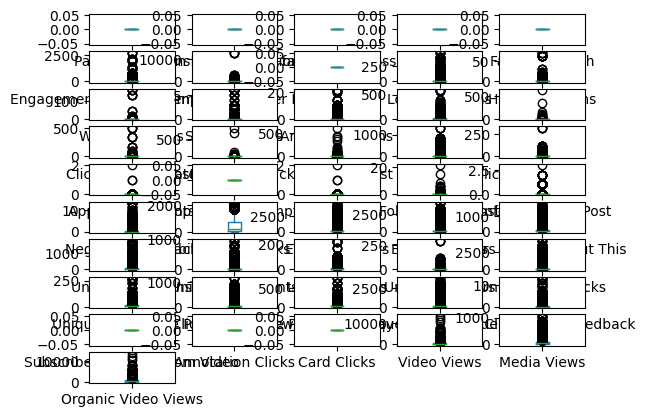

In [72]:
from matplotlib.pyplot import figure
figure(figsize=(20, 25), dpi = 80)
num.iloc[:, :46].plot(kind='box', subplots=True, layout=(10,5), sharex=False, sharey=False)
plt.tight_layout()
plt.rcParams["figure.figsize"] = (10,25)
plt.show();

<Figure size 1600x2000 with 0 Axes>

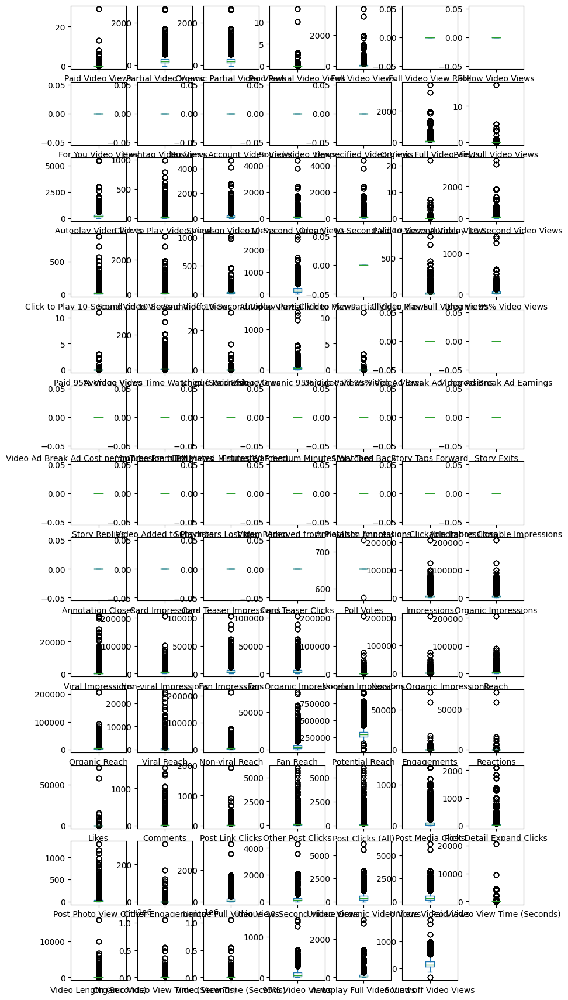

In [73]:
from matplotlib.pyplot import figure
figure(figsize=(20, 25), dpi = 80)
num.iloc[:, 46:].plot(kind='box', subplots=True, layout=(15,7), sharex=False, sharey=False)
plt.xticks(rotation = 90)
plt.tight_layout()
#plt.rcParams["figure.figsize"] = (10,25)
plt.show();

In [74]:
dfx.columns

Index(['Date', 'Network', 'Content Type', 'Sent by', 'Post',
       'Paid Impressions', 'Fan Paid Impressions', 'Non-fan Paid Impressions',
       'Paid Reach', 'Fan Paid Reach',
       ...
       'Unique 10-Second Video Views', 'Unique Organic Video Views',
       'Unique Video Views', 'Paid Video View Time (Seconds)',
       'Video Length (Seconds)', 'Organic Video View Time (Seconds)',
       'Video View Time (Seconds)', '95% Video Views',
       'Autoplay Full Video Views', 'Sound off Video Views'],
      dtype='object', length=142)

In [75]:
[i for i in dfx.columns]

['Date',
 'Network',
 'Content Type',
 'Sent by',
 'Post',
 'Paid Impressions',
 'Fan Paid Impressions',
 'Non-fan Paid Impressions',
 'Paid Reach',
 'Fan Paid Reach',
 'Engagement Rate (per Impression)',
 'Engagement Rate (per Reach)',
 'Dislikes',
 'Love Reactions',
 'Haha Reactions',
 'Wow Reactions',
 'Sad Reactions',
 'Angry Reactions',
 'Shares',
 'Saves',
 'Click-Through Rate',
 'Post Hashtag Clicks',
 'Profile Clicks',
 'Post Video Play Clicks',
 'Answers',
 'App Engagements',
 'App Install Attempts',
 'App Opens',
 'Follows from Post',
 'Unfollows from Post',
 'Negative Feedback',
 'bit.ly Link Clicks',
 'Engaged Users',
 'Engaged Fans',
 'Users Talking About This',
 'Unique Reactions',
 'Unique Comments',
 'Unique Shares',
 'Unique Answers',
 'Unique Post Clicks',
 'Unique Post Link Clicks',
 'Unique Post Photo View Clicks',
 'Unique Post Video Play Clicks',
 'Unique Other Post Clicks',
 'Unique Negative Feedback',
 'Subscribers Gained from Video',
 'Annotation Clicks',
 'Car

### Engagement Analysis

In [76]:
engagement_columns = {'Love Reactions', 'Haha Reactions', 'Wow Reactions', 'Sad Reactions', 'Angry Reactions', 'Answers', 'Unique Comments', 
                     'Unique Shares', 'Unique Answers', 'Unique Post Link Clicks', 'Unique Post Video Play Clicks', 'Unique Negative Feedback', 
                     'Paid Video Views', 'Paid Full Video Views', 'Click to Play Video Views', 'Paid 10-Second Video Views', 'Click to Play 10-Second Video Views', 
                     'Click to Play Full Video Views', 'Paid 95% Video Views', 'Unique Paid Video Views', 'Unique Paid 95% Video Views', 
                     'Unique Organic Video Views', 'Unique Video Views', 'Unique Full Video Views', 'Unique 10-Second Video Views', 'Engagements', 'Reactions', 'Likes', 
                      'Comments', 'Post Link Clicks', 'Other Post Clicks', 'Post Clicks (All)', 'Post Media Clicks', 'Post Detail Expand Clicks', 
                      'Post Photo View Clicks', 'Other Engagements', 'Unique Full Video Views', 'Unique 10-Second Video Views', 'Unique Organic Video Views', 'Unique Video Views', 'Paid Video View Time (Seconds)', 'Video Length (Seconds)', 'Organic Video View Time (Seconds)', 
                      'Video View Time (Seconds)', '95% Video Views', 'Autoplay Full Video Views', 'Sound off Video Views'}

engagement_columns = list(engagement_columns)
engagement_columns = sorted(engagement_columns)
engagement_columns

['95% Video Views',
 'Angry Reactions',
 'Answers',
 'Autoplay Full Video Views',
 'Click to Play 10-Second Video Views',
 'Click to Play Full Video Views',
 'Click to Play Video Views',
 'Comments',
 'Engagements',
 'Haha Reactions',
 'Likes',
 'Love Reactions',
 'Organic Video View Time (Seconds)',
 'Other Engagements',
 'Other Post Clicks',
 'Paid 10-Second Video Views',
 'Paid 95% Video Views',
 'Paid Full Video Views',
 'Paid Video View Time (Seconds)',
 'Paid Video Views',
 'Post Clicks (All)',
 'Post Detail Expand Clicks',
 'Post Link Clicks',
 'Post Media Clicks',
 'Post Photo View Clicks',
 'Reactions',
 'Sad Reactions',
 'Sound off Video Views',
 'Unique 10-Second Video Views',
 'Unique Answers',
 'Unique Comments',
 'Unique Full Video Views',
 'Unique Negative Feedback',
 'Unique Organic Video Views',
 'Unique Paid 95% Video Views',
 'Unique Paid Video Views',
 'Unique Post Link Clicks',
 'Unique Post Video Play Clicks',
 'Unique Shares',
 'Unique Video Views',
 'Video Lengt

In [77]:
dfx['totalEngagement'] = dfx[engagement_columns].sum(axis=1)


In [78]:
dfx['Content Type'] = dfx['Content Type'].astype('category')

In [79]:
dfx['Content Type']

0       Video
1       Photo
2       Photo
3       Photo
4       Photo
        ...  
8524     Text
8525     Text
8526     Text
8527    Photo
8528    Photo
Name: Content Type, Length: 36040, dtype: category
Categories (7, object): ['Carousel', 'Document', 'Link', 'Photo', 'Poll', 'Text', 'Video']

In [80]:
avg_engagement = dfx['totalEngagement'].groupby(dfx['Content Type']).mean()
avg_engagement


Content Type
Carousel     25153.626609
Document     76511.486000
Link         16716.380746
Photo        28147.853235
Poll        163979.670000
Text         22394.281756
Video        36519.441550
Name: totalEngagement, dtype: float64

## Content Engagement

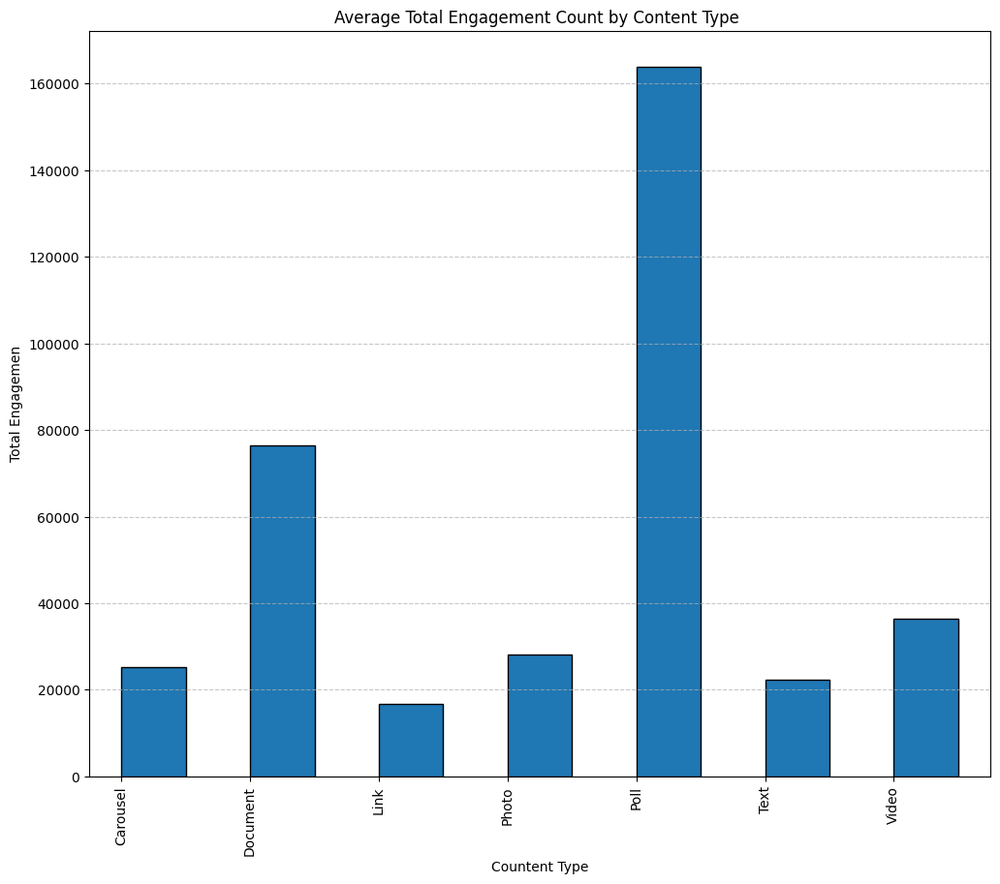

In [81]:
plt.figure(figsize= [12,10])
avg_engagement.plot(kind = 'bar', align='edge', edgecolor='black')
plt.title('Average Total Engagement Count by Content Type ')
plt.xlabel('Countent Type')
plt.ylabel('Total Engagemen')
plt.grid(axis='y', linestyle='--', alpha=0.7)

1. **Poll content** is the most engaging type of content, with an engagement count twice as high as the next most engaging type of content, *Document*.



2. **Document content** is the second most engaging type of content, with an engagement count twice as high as the third most engaging type of content, *Video content*.



3. **Video content** is the third most engaging type of content, with an engagement count about 1.1 times as high as the fourth most engaging type of content, *Photo content*.



4. **Photo content** is the fourth most engaging type of content, with an engagement count about 1.2 times as high as the fifth most engaging type of content, *Carousel content*.



5. **Carousel content** is the fifth most engaging type of content, with an engagement count about 1.1 times as high as the sixth most engaging type of content, *Text content*.


6. **Text content** is the sixth most engaging type of content, with an engagement count about 1.2 times as high as the least engaging type of content, *Link content*.


7. **Link content** is the least engaging type of content, with an engagement count about 1.2 times as low as the fifth most engaging type of content, *Text content*.


> Polls stand out as the most engaging content, fostering participation and interactive engagement. Documents, ranking second, attract engagement with in-depth information and valuable resources. The appeal of visual and auditory elements makes videos a popular and engaging format, securing the third position. Carousels, with their diverse content, entice user interaction, placing fifth. However, purely text-based content, ranking sixth, may be less engaging due to its limited visual appeal. Notably, links, the least engaging, can reduce on-platform engagement as they lead users away. 

**Summary**

- These trends highlight that content types with interactivity and visual appeal tend to garner more engagement.

In [82]:
engageByEach = dfx[engagement_columns].groupby(dfx['Content Type']).mean()
engageByEach.T

Content Type,Carousel,Document,Link,Photo,Poll,Text,Video
95% Video Views,84.454447,238.400,48.745727,97.190141,461.500,73.075111,114.516532
Angry Reactions,0.160377,0.000,0.106988,0.156864,0.500,0.125594,0.184310
Answers,0.055256,0.000,0.070511,0.088851,0.000,0.787197,0.145183
Autoplay Full Video Views,103.165768,368.200,61.041656,122.871564,903.900,98.062441,158.215419
Click to Play 10-Second Video Views,20.981402,259.600,15.917627,22.309130,52.600,22.226126,28.179558
Click to Play Full Video Views,15.333962,204.600,11.670416,16.366993,27.700,16.412187,20.954697
Click to Play Video Views,27.661725,324.000,21.602284,29.425603,77.500,29.671793,36.823216
Comments,17.307278,28.000,14.535573,19.443300,95.000,22.043393,22.939961
Engagements,285.854447,997.000,153.262170,222.437872,962.000,200.530249,264.101885
Haha Reactions,0.226415,0.000,0.105070,0.152063,0.000,0.201961,0.216284


In [83]:
len(engagement_columns)

43

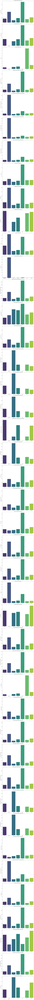

In [84]:
average_engagement = dfx[engagement_columns].groupby(dfx['Content Type']).mean()

# subplots for each engagement metric
num_metrics = len(engagement_columns)
fig, axes = plt.subplots(num_metrics, 1, figsize=(12, 8 * num_metrics), sharex=False)

for i, metric in enumerate(engagement_columns):
    sb.barplot(x=average_engagement.index, y=average_engagement[metric], ax=axes[i], palette='viridis')
    axes[i].set_ylabel(metric)
    axes[i].set_xlabel('')
    axes[i].set_title(f'{metric} by Content Type')

plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


In [85]:
networkEngagement = dfx['totalEngagement'].groupby(dfx['Network']).mean()
networkEngagement

Network
Facebook     27139.993274
Instagram    27808.413876
LinkedIn     30900.529711
Twitter      28641.545579
Name: totalEngagement, dtype: float64

## Network Engagement

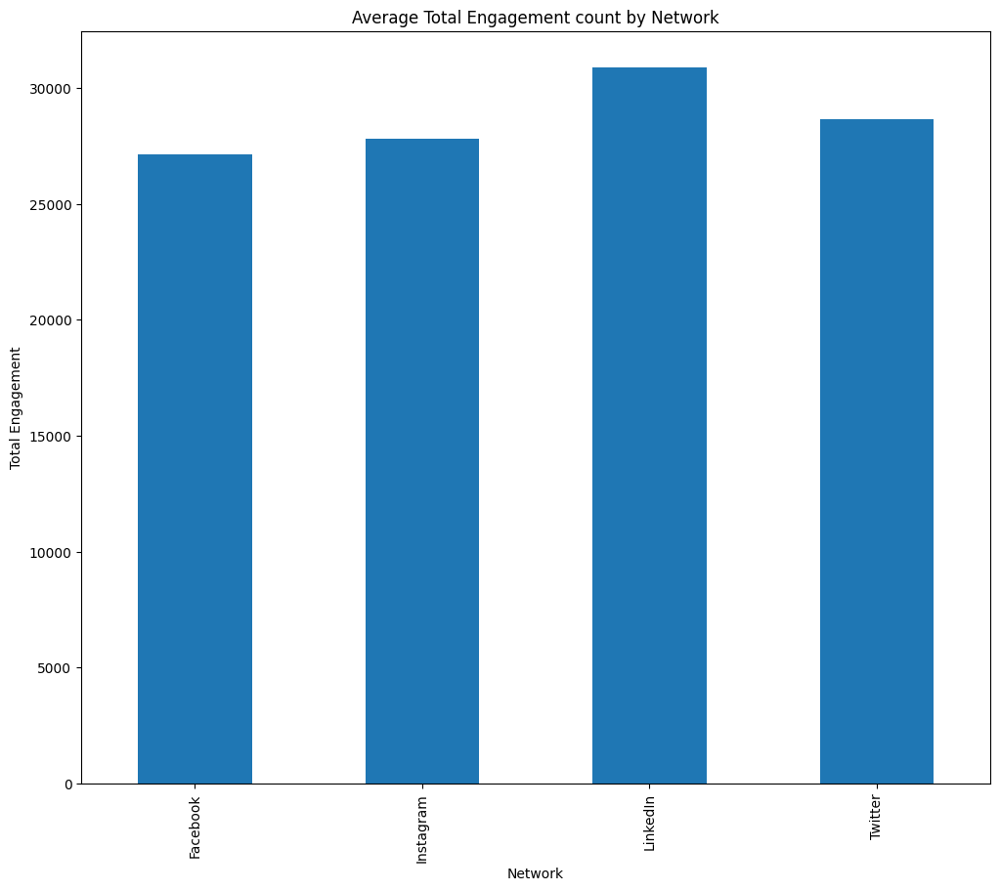

In [86]:
plt.figure(figsize= [12,10])
networkEngagement.plot(kind = 'bar')
plt.title('Average Total Engagement count by Network')
plt.xlabel('Network')
plt.ylabel('Total Engagement');

- **LinkedIn**: Highest network engagement, approximately 1.07 times as high as the second network, Twitter.
- **Twitter**: Second-highest network engagement, about 1.02 times as high as the third network, Instagram.
- **Instagram**: Third-highest network engagement, approximately 1.02 times as high as the fourth network, Facebook.
- **Facebook**: Least network engagement, roughly 1.02 times as low as the third network, Instagram.

> LinkedIn outperforms other platforms, such as Twitter, Instagram, and Facebook, in terms of engagement. This could be due to its professional-focused audience, content relevance, active user engagement, and effective content recommendation algorithms. Users on LinkedIn, seeking professional connections and industry-specific content, may find the platform's polls and documents particularly engaging. The platform's dynamic and interactive environment, along with personalized content delivery, contributes to higher engagement rates. Conversely, while Twitter, Instagram, and Facebook have significant user bases, their content nature and user behavior might differ, affecting overall engagement. It's essential to recognize that these observations are generalizations, and specific engagement patterns may vary based on content strategy, audience demographics, and platform dynamics.

In [87]:
dfx['dayWeek'] = dfx['Date'].dt.day_name()
dfx['Month_Year'] = dfx['Date'].dt.strftime('%Y-%m')

In [88]:
dfx.groupby('dayWeek')['totalEngagement'].mean()

dayWeek
Friday       28392.099379
Monday       28177.904324
Saturday     30358.215328
Sunday       34801.789375
Thursday     28946.848397
Tuesday      28023.039319
Wednesday    24968.721740
Name: totalEngagement, dtype: float64

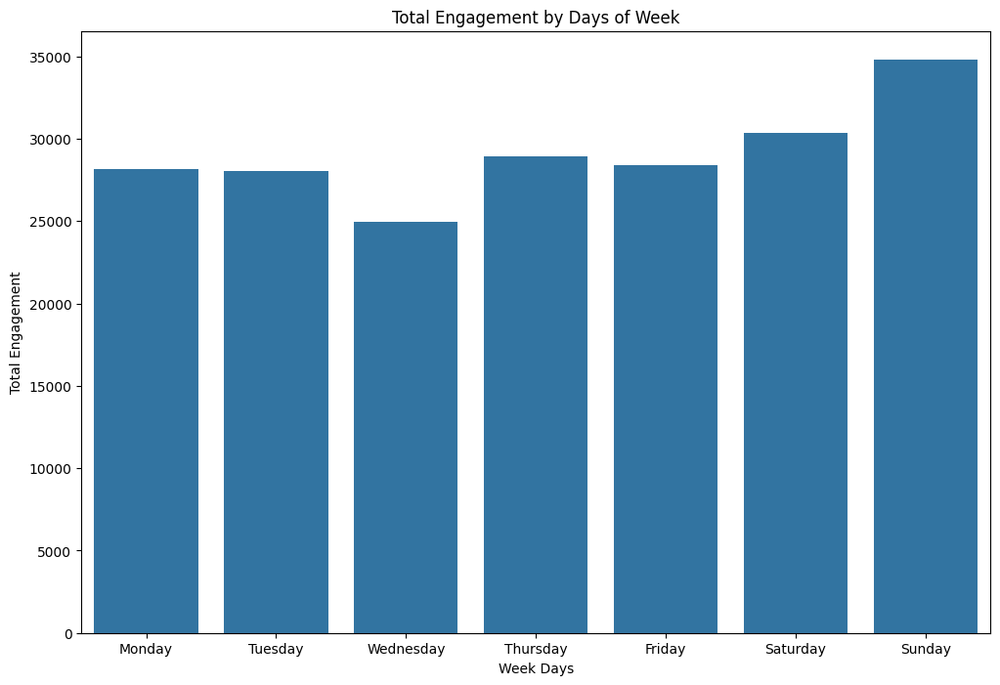

In [89]:
plt.figure(figsize=[12,8])
order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
colorBase = sb.color_palette()[0]
sb.barplot(data= dfx, x = 'dayWeek', y = 'totalEngagement', color= colorBase, order= order, errorbar=None )
plt.title('Total Engagement by Days of Week')
plt.ylabel('Total Engagement')
plt.xlabel('Week Days');

- **Sunday:** Has the highest total engagement among the days of the week, about 1.1 times as high as the second-highest engagement day, Saturday.
- **Saturday:** Is the second-highest total engagement day, about 1.04 times as high as the third-highest engagement day, Thursday.
- **Thursday:** Is the third-highest total engagement day, about 1.03 times as high as the fourth-highest engagement day, Friday.
- **Friday:** Is the fourth-highest total engagement day, about 1 time as high as the fifth-highest engagement day, Monday.
- **Monday:** Is the fifth-highest total engagement day, about 1 time as high as the sixth-highest engagement day, Tuesday.
- **Tuesday:** Is the sixth-highest total engagement day, about 1.1 times as high as the seventh-highest engagement day, Wednesday.
- **Wednesday:** Has the least total engagement among the days of the week, about 1.1 times as low as the sixth-highest engagement day, Tuesday.

> The variations in total engagement across the days of the week could be influenced by several factors. Sundays might witness higher engagement due to increased leisure time, as people are often more relaxed and active on weekends. Additionally, Sunday evenings may be a popular time for social media use as individuals prepare for the upcoming week. Saturdays being the second-highest engagement day could be attributed to a similar weekend effect. Thursdays, as the third-highest engagement day, might experience increased activity as people engage with content before the weekend. Fridays, while still active, could see a slight dip in engagement as individuals may be occupied with end-of-week responsibilities. Mondays, being the start of the workweek, might experience higher engagement as people catch up on updates after the weekend. Tuesdays, the sixth-highest engagement day, could see increased activity, possibly due to ongoing work discussions and content catch-up. Wednesdays, having the least engagement, might be influenced by the midweek slump when people are focused on work and have less time for social media. These insights suggest a complex interplay of factors, including leisure time, work schedules, and content preferences, contributing to the observed patterns in network engagement across the days of the week.


In [90]:
dfx['Hours'] = dfx['Date'].dt.hour

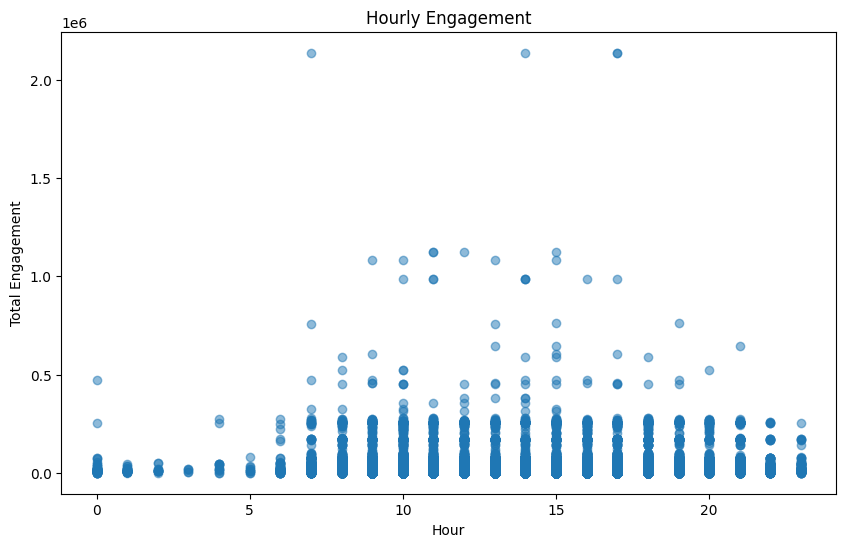

In [91]:
plt.figure(figsize=(10, 6))
plt.scatter(dfx['Hours'], dfx['totalEngagement'], alpha=0.5)
plt.title('Hourly Engagement')
plt.xlabel('Hour')
plt.ylabel('Total Engagement')
plt.show()

- People tend to engage more on social media at 7 AM, 2 PM, and 5 PM, with these hours sharing the same high engagement rate.


> People tend to engage more on social media at 7 AM, 2 PM, and 5 PM, likely due to common daily routines. The morning hours align with the start of the day, 2 PM corresponds to a common break period, and 5 PM marks the end of the workday. These hours share a consistently high engagement rate, possibly reflecting established user habits or accommodating a global audience across different time zones.

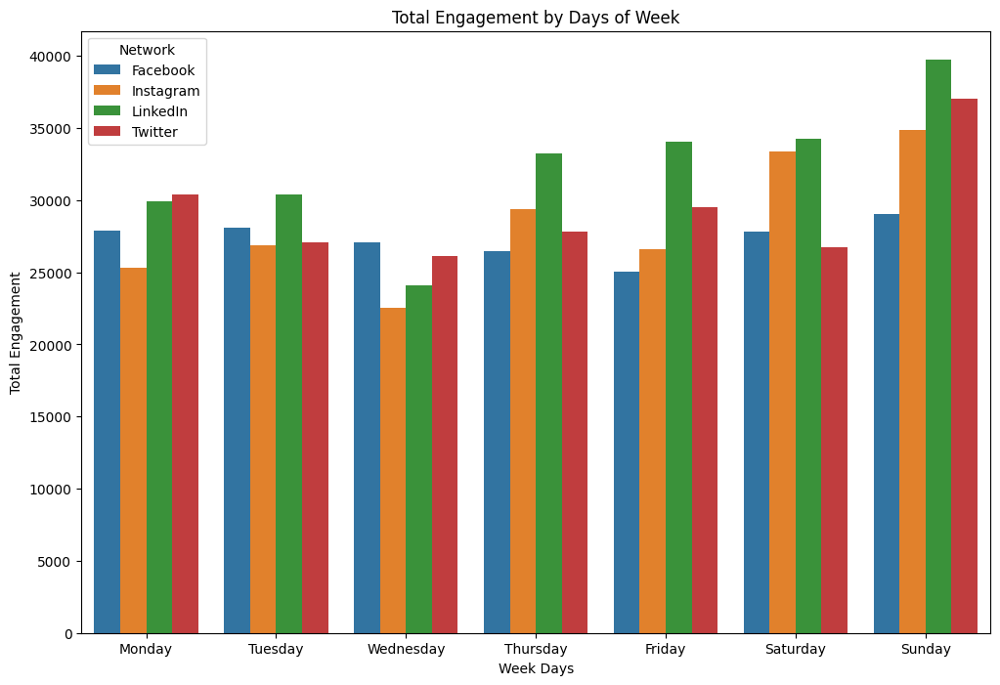

In [92]:
plt.figure(figsize=[12,8])
order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
#colorBase = sb.color_palette()[0]
sb.barplot(data= dfx, x = 'dayWeek', y = 'totalEngagement', order= order, errorbar=None, hue= 'Network' )
plt.title('Total Engagement by Days of Week')
plt.ylabel('Total Engagement')
plt.xlabel('Week Days');

- On Monday, more people engaged on Twitter, followed by LinkedIn, Facebook, and Instagram.
- On Tuesday, more people engaged on LinkedIn, followed by Facebook, with Instagram and Twitter almost the same.
- On Wednesday, more people engaged on Facebook, followed by Twitter, LinkedIn, and Instagram.
- On Thursday, more people engaged on LinkedIn, followed by Instagram, Twitter, and Facebook.
- On Friday, more people engaged on LinkedIn, followed by Twitter, Instagram, and Facebook.
- On Saturday, more people engaged on LinkedIn, followed by Instagram, Facebook, and Twitter.
- On Sunday, more people engaged on LinkedIn, followed by Twitter, Instagram, and Facebook.

> Throughout the week, different social media platforms experience varying engagement patterns. On Mondays, Twitter tends to witness heightened engagement as users catch up on news post-weekend, followed by LinkedIn, where professionals engage with work-related content. Facebook and Instagram then come into play as users transition to more casual, social content. On Tuesdays, LinkedIn sees increased engagement due to its professional networking focus, while Facebook and Instagram attract users seeking a mix of personal and professional content. Twitter's engagement remains steady but slightly lower, influenced by the professional emphasis on LinkedIn. Midweek, Wednesday sees heightened engagement on Facebook as users seek a break, with increased activity on Twitter as well. LinkedIn maintains its professional focus, while Instagram attracts moderate engagement with its visual content. Thursdays witness sustained high engagement on LinkedIn, particularly for professional networking, and increased activity on Instagram as users look forward to the weekend. Twitter and Facebook follow with mixed engagement. As the workweek concludes on Fridays, professional engagement on LinkedIn decreases, leading to a spike in Twitter engagement as users share thoughts on the week. Instagram and Facebook continue to see engagement as users unwind and share casual content. On Saturdays, LinkedIn's engagement drops further as the weekend kicks in. Instagram, with its visual appeal, experiences higher engagement, while Facebook and Twitter observe mixed engagement as users balance personal and social interactions. These patterns offer insights into the dynamics of platform usage throughout the week, reflecting the varying preferences and behaviors of social media users.

<Figure size 2500x2000 with 0 Axes>

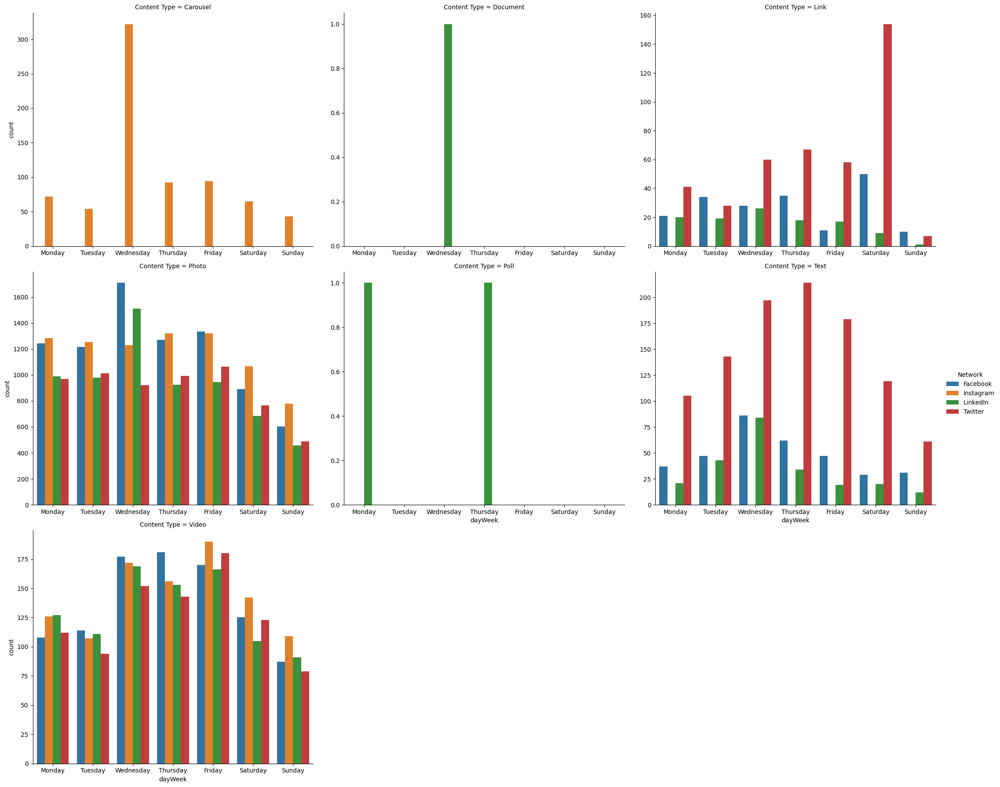

In [93]:
plt.figure(figsize=[25, 20])
sb.catplot(x='dayWeek', hue='Network', col='Content Type', kind='count', data=dfx, col_wrap=3, height=6,
           aspect=1.2, sharey=False, sharex= False, order= order)
plt.show()


**Content Type Analysis:**

*Carousel:*
Carousel content is exclusively engaged on Instagram, with the highest engagement observed on Wednesday, three times as high as the second-highest day, Friday. Thursday, the third-highest engagement day, is nearly as high as Friday. Monday and Saturday share similar engagement levels, ranking fourth and fifth, respectively. Tuesday is the sixth-highest engagement day, approximately one times as high as the least engaged day, Sunday.

*Document:*
Document content only receives engagement on LinkedIn, specifically on Wednesdays.

*Link:*
Link content sees the highest engagement on Twitter on Mondays, twice as high as the second most engaged network, Facebook. Instagram has zero engagement throughout the week on link content. On Tuesdays, Facebook leads in engagement on link content, approximately 1.1 times as high as Twitter. On Wednesdays, Twitter dominates with engagement, twice as high as Facebook, while Facebook and LinkedIn are almost equal. Thursdays see Twitter leading again, twice as high as Facebook, which is twice as high as LinkedIn. Fridays witness Twitter with the highest engagement, three times as high as LinkedIn. Saturdays and Sundays maintain low engagement, with Facebook leading on Sundays.

*Photo:*
Monday sees the highest engagement based on photo content, slightly higher than Facebook, with LinkedIn and Twitter following. Tuesdays show Instagram leading, slightly higher than Facebook, while being 1.2 times higher than Twitter and LinkedIn. Wednesdays see Facebook leading, approximately 1.2 times higher than LinkedIn, which is 1.25 times higher than Instagram and 1.3 times higher than Twitter. Thursdays have Instagram leading, equal to the second, Facebook, which is 1.3 times higher than the third, Twitter. Fridays have Facebook leading slightly higher than Instagram, with both being 1.3 times higher than Twitter, the third. Saturdays and Sundays follow the same trend.

*Poll:*
Poll content engages exclusively on LinkedIn, appearing on Monday and Thursday.

*Text:*
Twitter dominates text content engagement on Mondays, three times as high as Facebook, which is 1.5 times higher than LinkedIn. Tuesdays see Twitter leading, three times as high as Facebook, which is 1 times as high as LinkedIn. Wednesdays witness Twitter leading again, 2.5 times as high as Facebook, with Facebook slightly higher than LinkedIn. Thursdays have Twitter with the highest engagement, 3.5 times as high as Facebook, which is 2 times as high as LinkedIn. Fridays see Twitter leading, four times as high as Facebook, which is 2 times as high as LinkedIn. Saturdays and Sundays continue the trend, with Twitter leading.

*Video:*
Mondays show LinkedIn leading in video content engagement, closely followed by Instagram. Tuesdays see Facebook in the lead, a little higher than LinkedIn, while LinkedIn is slightly higher than Instagram, with Instagram being 1.5 times higher than Twitter. Wednesdays have Facebook leading, slightly higher than Instagram, with Instagram being slightly higher than LinkedIn, and LinkedIn being 1.3 times higher than Twitter. Thursdays witness Facebook leading, 1.3 times higher than Instagram, which is 1 times higher than LinkedIn, with LinkedIn being 1.2 times higher than Twitter. Fridays have Instagram in the lead, 1.2 times higher than Twitter, which is 1.2 times higher than Facebook, and Facebook being 1 times higher than LinkedIn. Saturdays follow the same trend as Fridays, and Sundays follow the same trend as Thursdays.

In [94]:
df0 = dfx.copy()
df0 = df0.set_index('Date')

In [95]:
def plot_metrics_by_month_and_day(df, column_name):
    # Resample by month
    resample_metric_month = df[column_name].resample('m').mean()

    # Plot 1
    plt.figure(figsize=[15, 6])
    resample_metric_month.plot(linestyle='-', markersize=8)
    plt.xlabel('Month', fontsize=14)
    plt.ylabel(column_name, fontsize=14)
    plt.title(f'{column_name} Per Month', fontsize=14)
    plt.show()

    # Plot 2
    plt.figure(figsize=[10,6])
    sb.barplot(data= dfx, x = 'dayWeek', y = column_name, color= colorBase, order= order, errorbar=None)
    plt.title(f'{column_name} by Days')
    plt.xlabel('Days')
    plt.ylabel(column_name)
    plt.grid(axis='y', linestyle='--', alpha=0.7);

    # Plot 3
    plt.figure(figsize=[10, 6])
    sb.barplot(data=df, x='dayWeek', y=column_name, hue='Network', palette='tab10', order=order, errorbar=None)
    plt.title(f'{column_name} by Days with Network Hue')
    plt.xlabel('Days')
    plt.ylabel(column_name)
    plt.show()

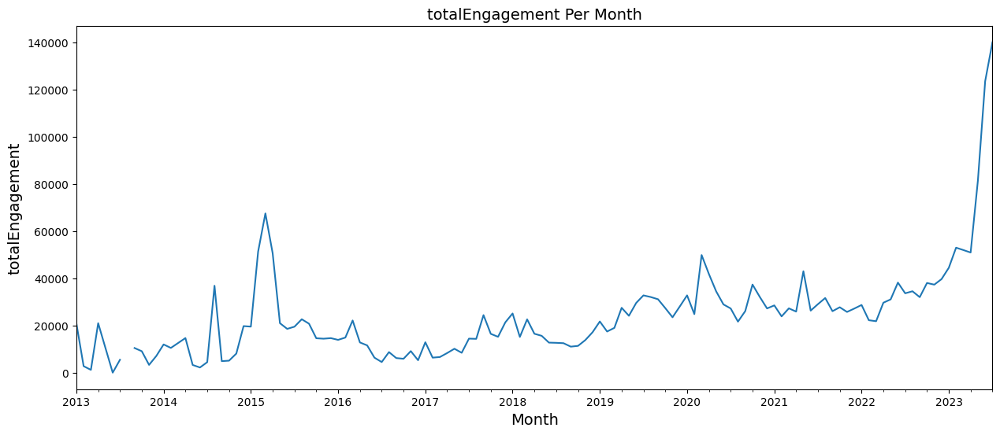

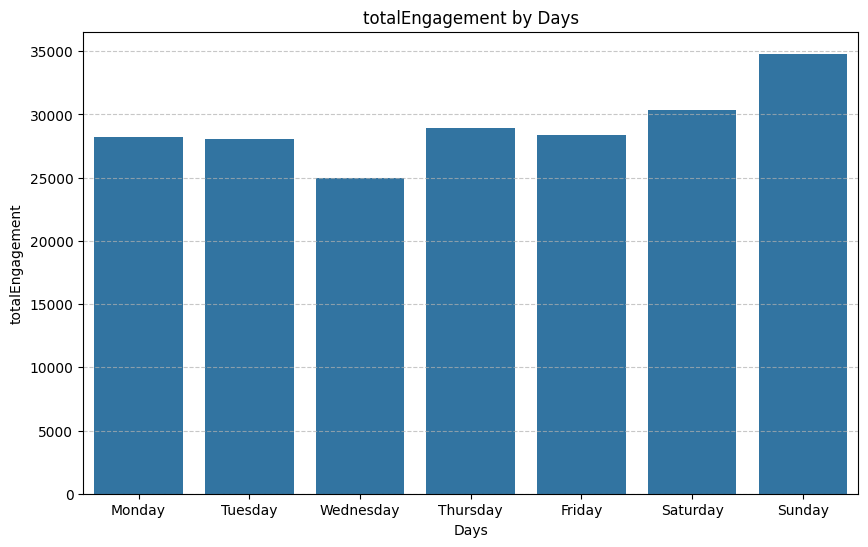

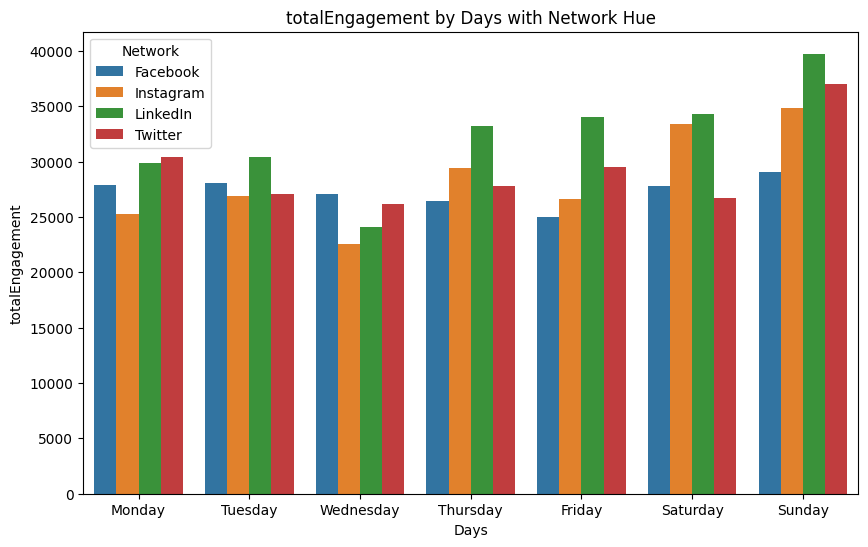

In [96]:
plot_metrics_by_month_and_day(df0, 'totalEngagement' )

**Engagement Analysis**

There is a persistent pattern of rising and falling total engagement throughout the year, with the highest peak occurring in the second quarter of 2023, reaching approximately 140,000 total engagements. The second peak is in the first quarter of 2015, totaling about 70,000 engagements, which is 2 times lower than the highest peak. The third peak is in the first quarter of 2020, with about 50,000 total engagements, approximately 1.4 times lower than the third-highest peak.

In terms of weekly engagement, Sunday leads with the highest total engagement count, reaching 34,000. Saturday follows as the second most engaged day with about 30,000 counts, while Thursday secures the third position with around 29,000 counts. Friday claims the fourth position with about 28,000 counts, and Monday and Tuesday share the same total engagement of approximately 27,500 counts. Wednesday has the least engagement with a count of 25,000.

On a daily basis, Twitter dominates engagement on Monday with the highest count of 30,000, followed by LinkedIn with around 29,000 total engagements. Facebook ranks third with 27,000 engagements, and Instagram has the lowest count at 25,000. Tuesday sees LinkedIn leading with 30,000 total engagements, while Facebook follows with around 28,000 counts, and Instagram and Twitter share the same count of about 27,000.

Wednesday sees Facebook taking the lead with around 27,000 total engagements, followed by Twitter with about 26,000. LinkedIn secures the third position with 24,000 total engagements, and Instagram trails with the least count of 22,500. Thursday witnesses LinkedIn again leading with around 32,000 total engagements, followed by Instagram with 28,000 counts. Twitter, in the third position, has 27,000 total engagements, and Facebook trails with 26,000.

On Friday, LinkedIn maintains its lead with about 33,000 total engagements, followed by Twitter with 28,000 counts. Instagram, in the third position, has 26,000 total engagements. Saturday sees LinkedIn leading again with around 33,000 counts, followed closely by Instagram with 32,000. Facebook secures the third position with 26,500, and Twitter trails with 25,000.

Sunday witnesses LinkedIn with the highest total engagement count of about 39,000, followed by Twitter with approximately 37,000 counts. Instagram secures the third position with a total engagement count of 34,000, while Facebook lags behind with 29,000 total engagements.

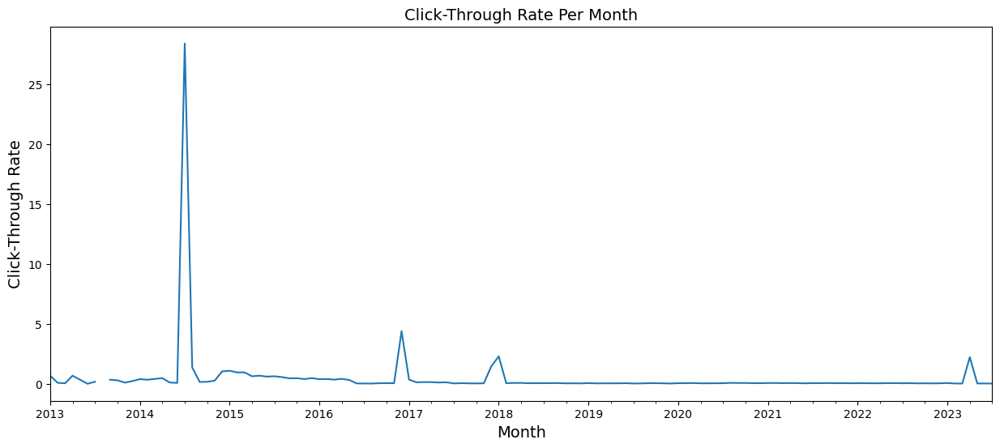

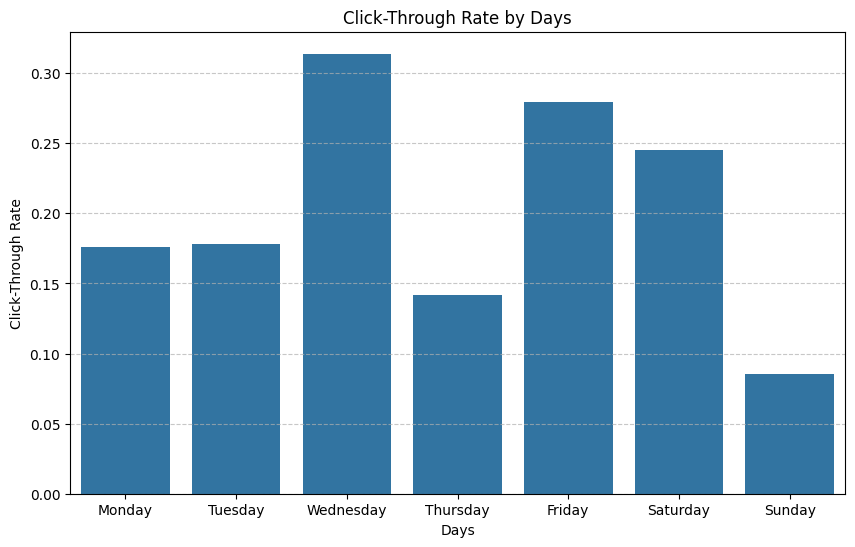

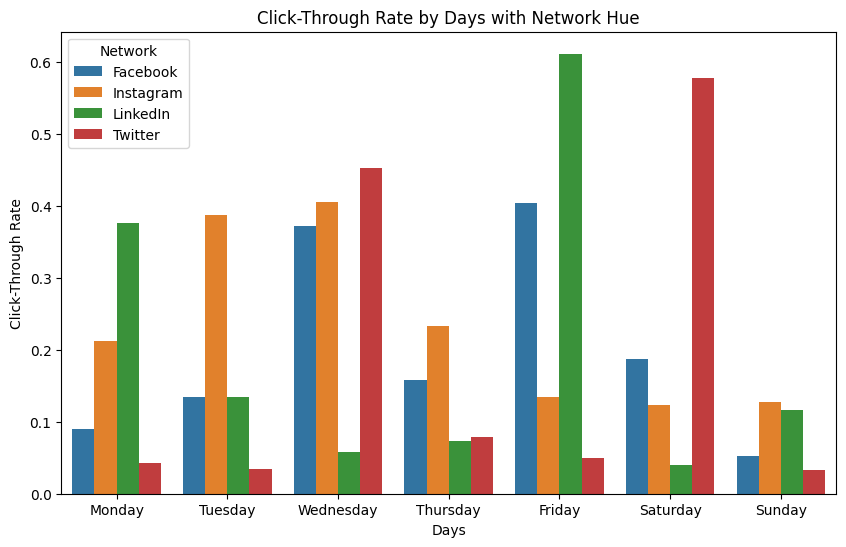

In [217]:
plot_metrics_by_month_and_day(df0, 'Click-Through Rate' )

From 2013 to the first quarter of 2014, there is a fluctuation in the click-through rate (CTR) with an overall change of around 1%. The highest peak occurs in the second quarter of 2014, exceeding 25%, which can be considered exceptionally high. The second-highest peak is observed in the last quarter of 2016, reaching about 4%. From the first quarter of 2018 to the first quarter of 2023, there is a consistent CTR of approximately 1%.

Breaking down the CTR by days of the week, Wednesday sees the highest CTR, surpassing 0.30%. Friday follows with the second-highest CTR around 0.27%, and Saturday holds the third position with a CTR of approximately 0.24%. Tuesday and Monday share the same CTR at around 0.175%. Thursday has the sixth-highest CTR at about 0.14%, and Sunday has the lowest CTR at approximately 0.07%.

Analyzing CTR on specific platforms, on Monday, LinkedIn boasts the highest CTR at about 0.37%, followed by Instagram with the second-highest CTR of about 0.21%. Facebook comes in third with a CTR of approximately 0.08%, and Twitter has the lowest CTR at around 0.05%.

On Tuesday, Instagram takes the lead with the highest CTR of about 0.38%. Facebook and LinkedIn share the same CTR of about 0.13%, while Twitter maintains the lowest CTR at 0.05%.

Moving to Wednesday, Twitter claims the highest CTR at about 0.45%, followed closely by Instagram with a CTR of 0.4%. Facebook secures the third-highest CTR at approximately 0.38%, and LinkedIn has the lowest CTR at about 0.05%.

Thursday sees Instagram with the highest CTR at about 0.22%, followed by Facebook at 0.15%. Twitter ranks third with a CTR of about 0.08%, and LinkedIn has the least with 0.07% CTR.

On Friday, LinkedIn dominates with the highest CTR at about 0.6%, followed by Facebook at 0.38%. Instagram takes the third position with a CTR of 0.14%, while Twitter has the lowest, below 0.05%.

Saturday sees Twitter with the highest CTR at about 0.57%, followed by Facebook at 0.18%. Instagram holds the third position with a CTR of 0.13%, and LinkedIn has the lowest CTR, below 0.05%.

Finally, on Sunday, Instagram leads with the highest CTR at about 0.12%, followed by LinkedIn at 0.11%. Facebook secures the third-highest CTR at about 0.05%, while Twitter has the lowest, below 0.05%.

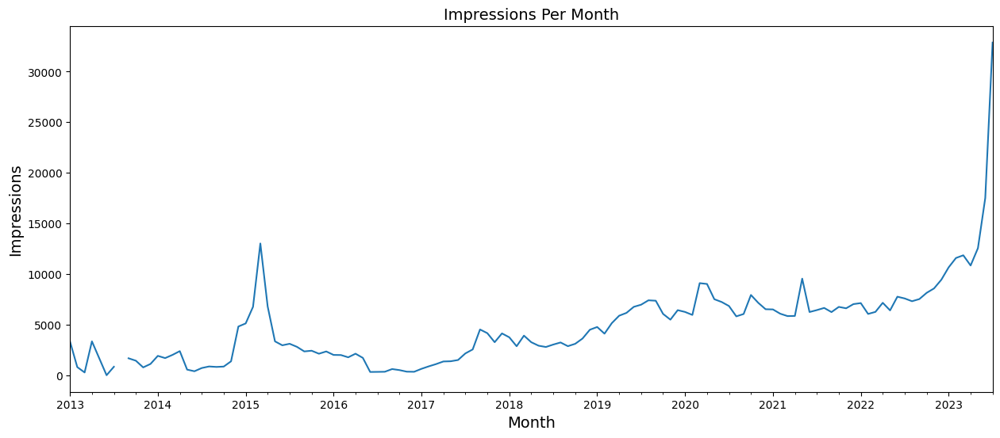

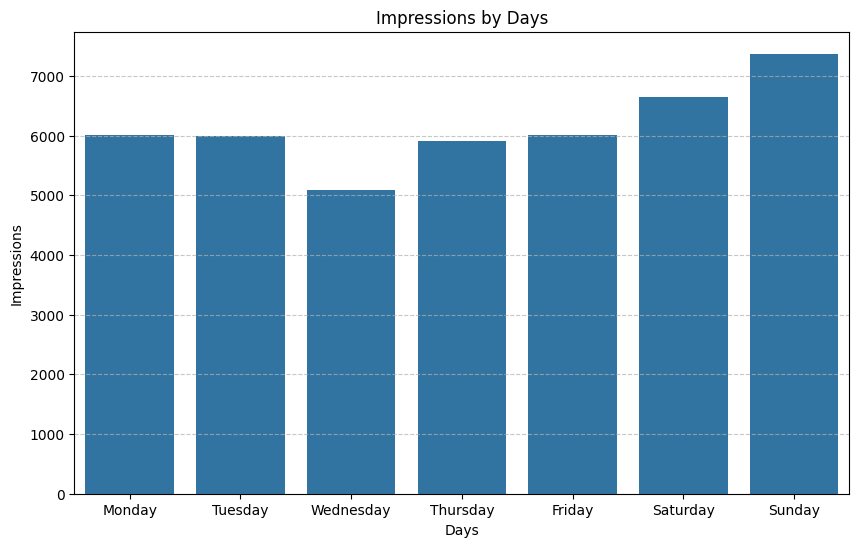

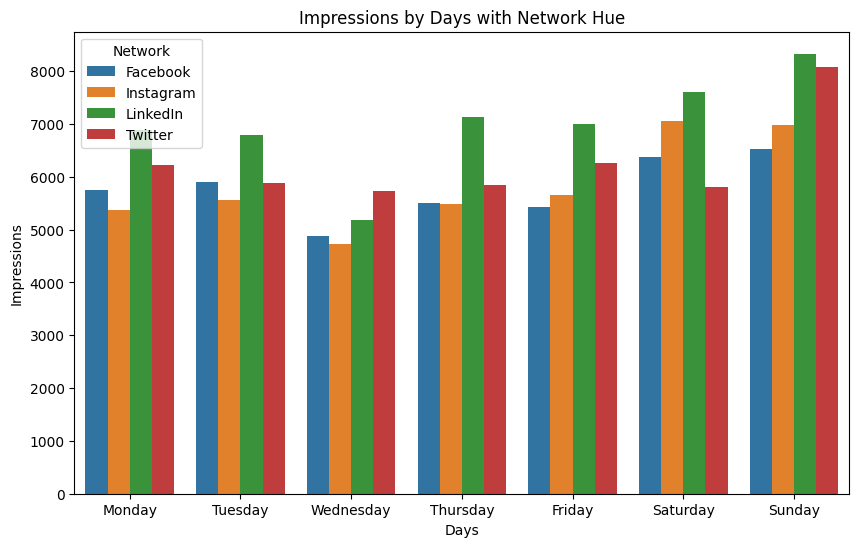

In [98]:
plot_metrics_by_month_and_day(df0, 'Impressions' )

From 2013 to the third quarter of 2014, there is a fluctuation in impressions, staying below 5000. Following this, there is a steady increase, reaching a peak of about 14,000 impressions. The peak then gradually falls below 5000 in the first quarter of 2015, experiencing subsequent rises and falls until the highest peak in the second quarter of 2023. The second-highest peak occurs in the first quarter of 2015, reaching about 14,000, while the lowest peak happens in the first quarter of 2013.

Breaking down impressions by days of the week, Sunday has the highest impression, exceeding 7000, followed by Saturday with about 6,800. Friday, Monday, and Tuesday each have impressions of 6000. Thursday holds the fourth position with 5900 impressions, and Wednesday has the least, about 5100.

Examining platform-specific impressions on Mondays, LinkedIn takes the lead with the highest impression of about 6800, followed by Twitter with about 6200. Facebook comes third with approximately 5800 impressions, and Instagram has the least, about 5250.

On Tuesdays, LinkedIn claims the highest impression of about 6,800, while Facebook and Twitter share the same impression of 5,800. Instagram has the least impressions.

Wednesday sees Twitter with the highest impression of about 5600, followed by LinkedIn with about 5200 impressions. Facebook comes third with 4,800 impressions, and Instagram has the least, about 4,700.

Thursday witnesses LinkedIn with the highest impression of about 6,800, followed by Twitter with 5,900 impressions. Facebook and Twitter almost share the same impression, around 5,500.

On Fridays, LinkedIn leads with the highest impression of about 6,700, followed by Twitter with about 6000 impressions. Instagram takes the third position with impressions of about 5600, and Facebook has the least, about 5,500 impressions.

On Saturdays, LinkedIn has the highest impression of about 7,300, followed by Instagram with about 6900. Facebook comes third with impressions of about 6300, and Twitter comes last with impressions of about 5600.

Finally, on Sundays, LinkedIn has the highest impression of about 8000, followed by Twitter with about 7,800 impressions. Instagram comes third with about 6,500 impressions, and Facebook comes last with about 6200 impressions.

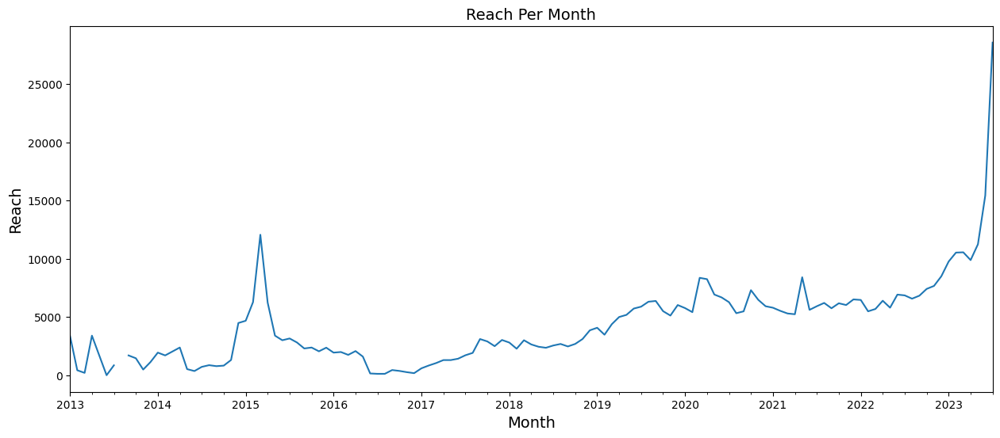

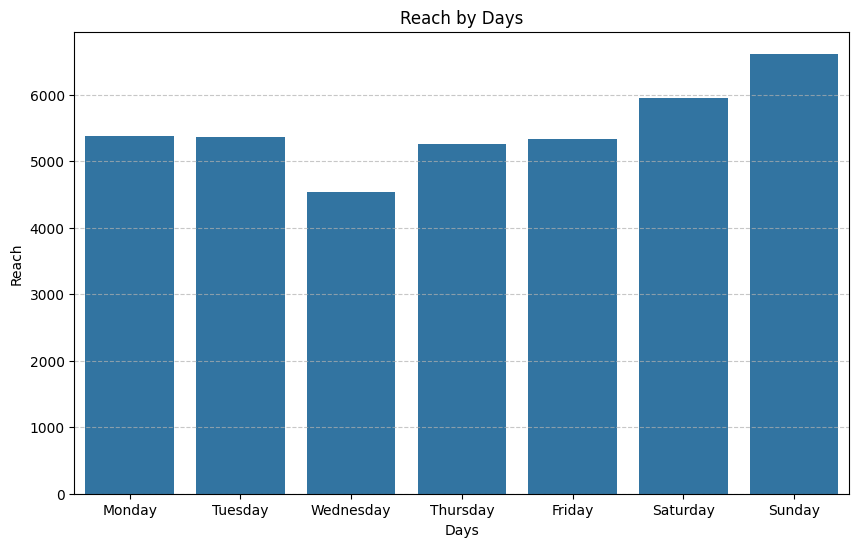

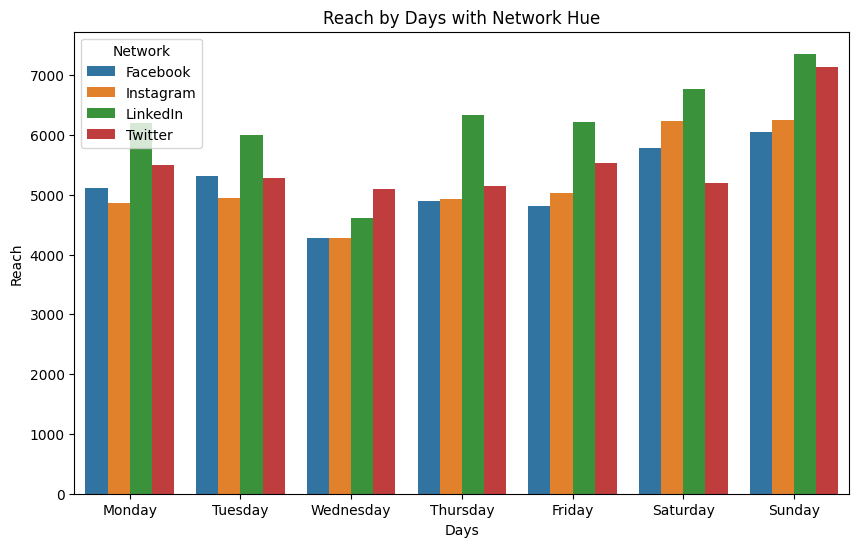

In [99]:
plot_metrics_by_month_and_day(df0, 'Reach' )

Reach follows the same pattern as impression

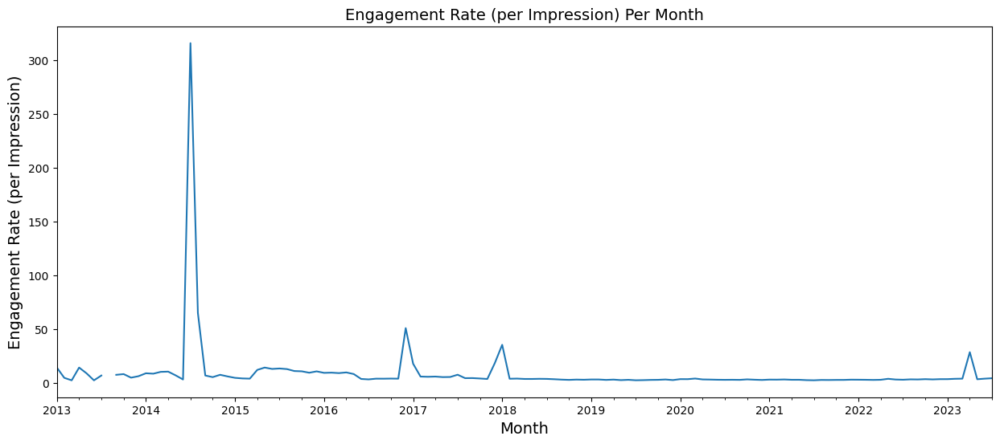

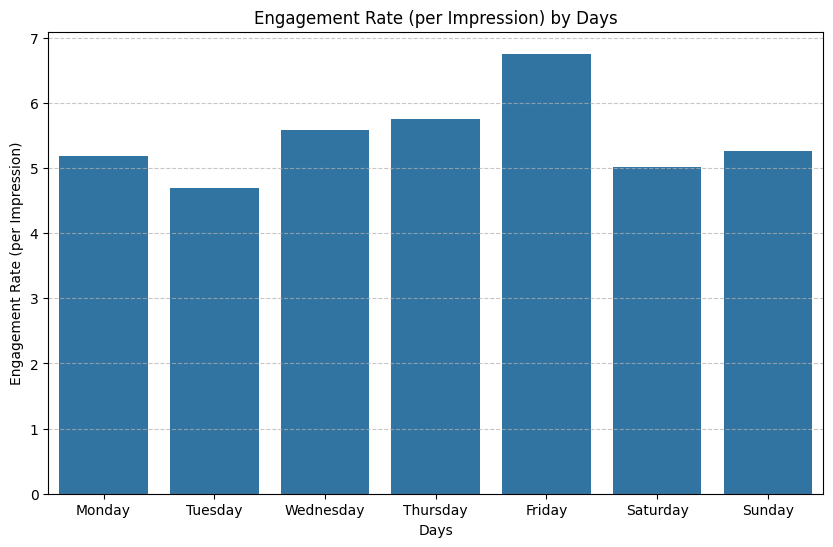

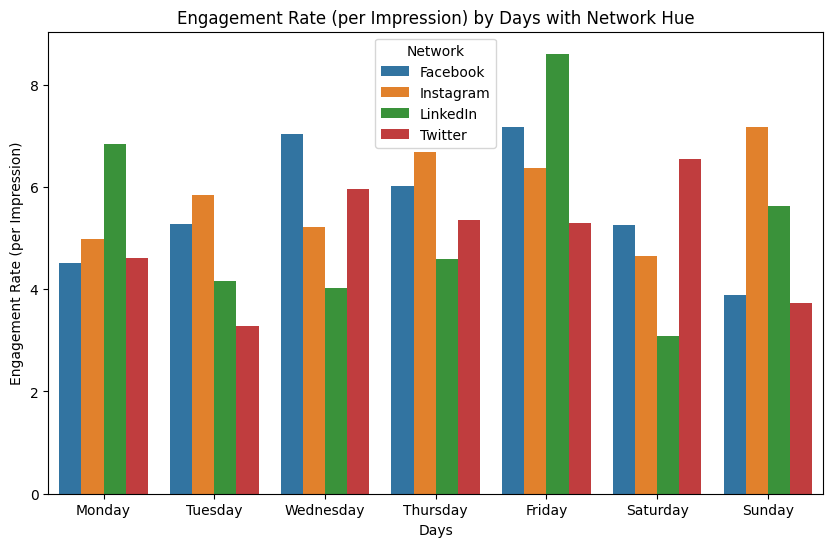

In [100]:
plot_metrics_by_month_and_day(df0, 'Engagement Rate (per Impression)')

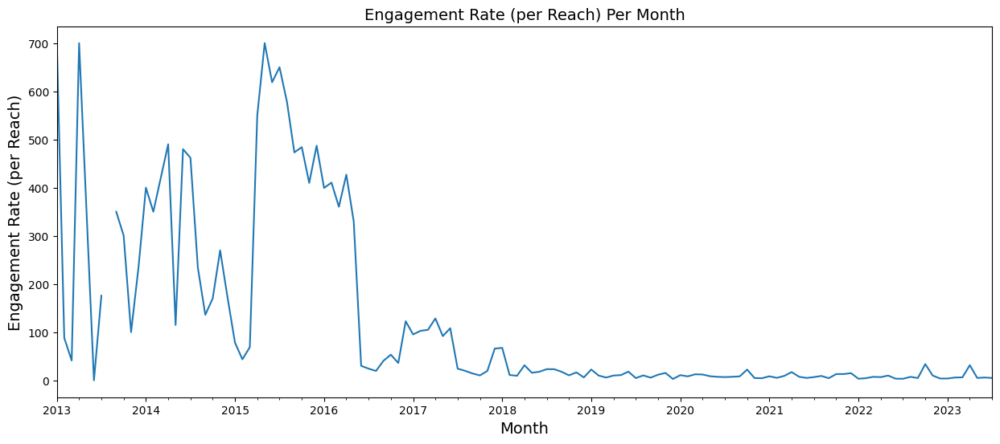

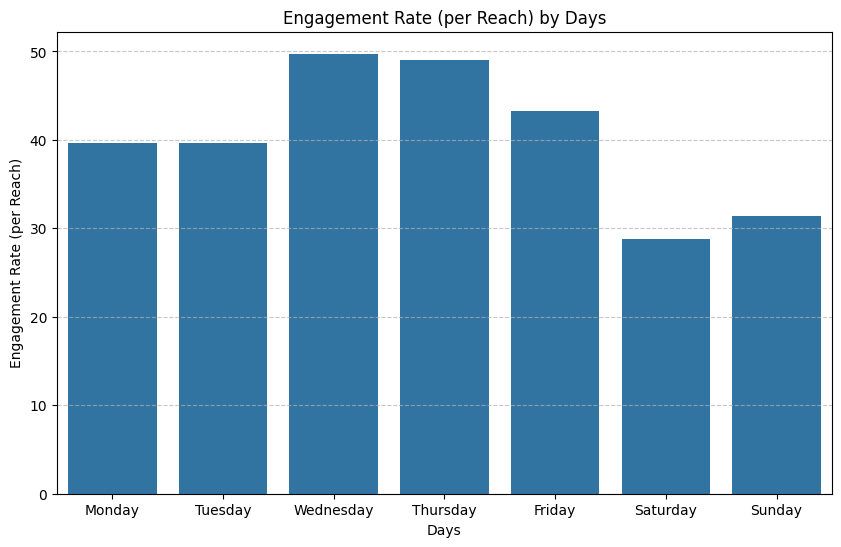

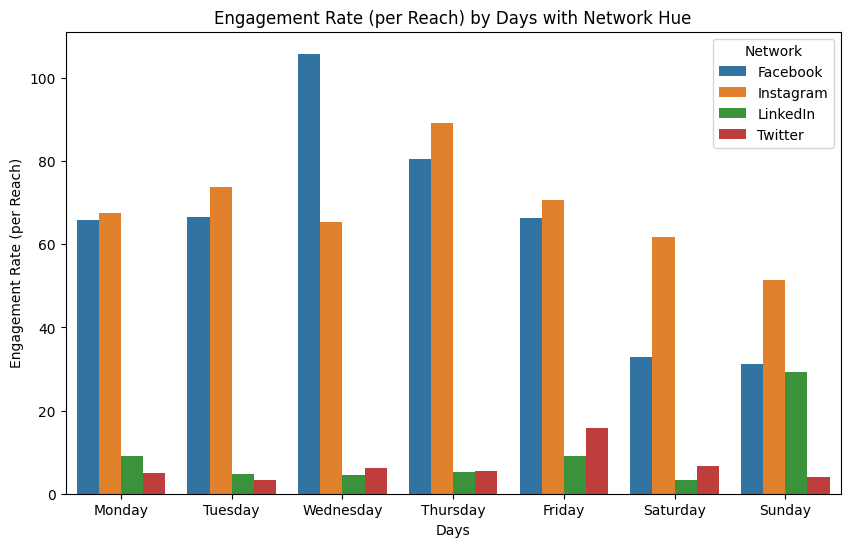

In [101]:
plot_metrics_by_month_and_day(df0, 'Engagement Rate (per Reach)')

In [102]:
dfx['Sent by'].unique()

array(['Damilare Oyekanmi', ' ', 'Aramide Salami', 'Blessing Ubah',
       'Sophia Amuka', 'Kemi Amoo', 'Dunni Ogunsanya', 'Lilian Ibekwe',
       'Rebecca Oyebode', 'Kanayo Obiano', 'Philip Nwagwunor',
       'Patience Nnaji'], dtype=object)

In [103]:
dfx['Sent by'].replace(' ', 'unknown', inplace= True)

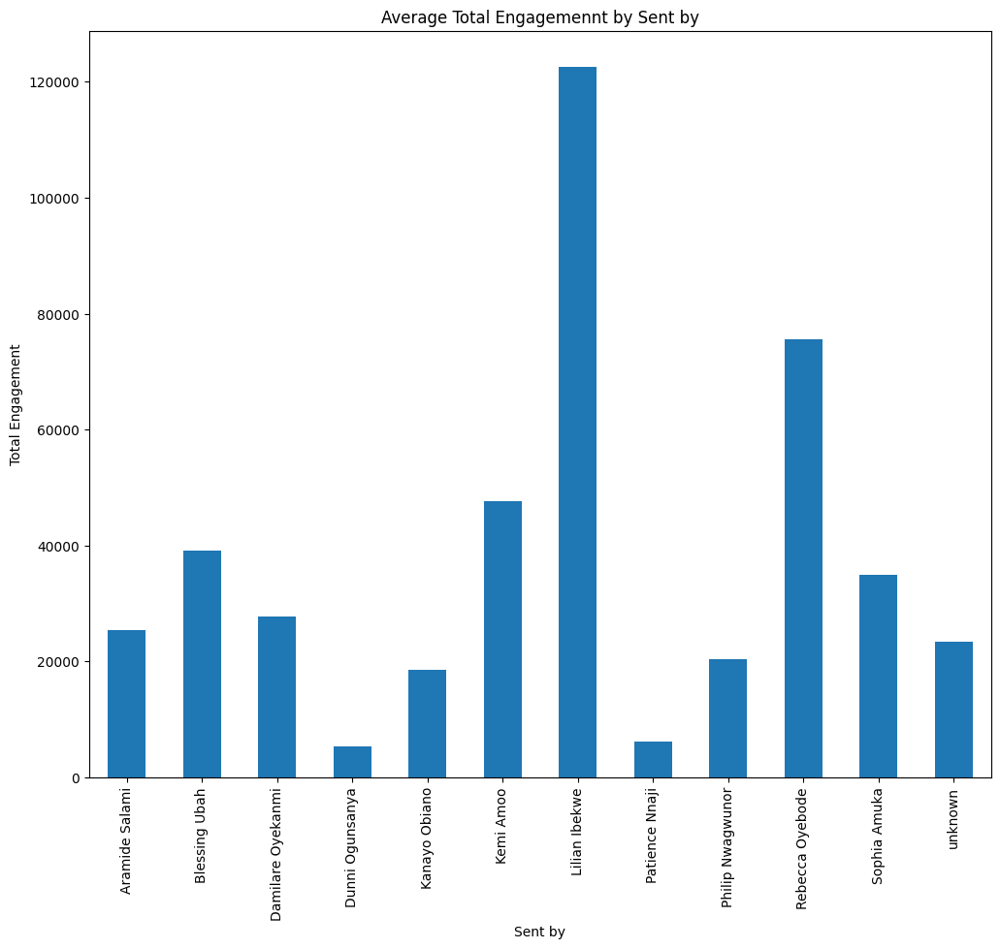

In [104]:
plt.figure(figsize=[12,10])
dfx['totalEngagement'].groupby(dfx['Sent by']).mean().plot(kind = 'bar')
plt.title('Average Total Engagemennt by Sent by')
plt.ylabel('Total Engagement')
plt.xlabel('Sent by');

Lilian Ibekwe leads in engagement, amassing about 120,000 total engagements. Following closely, Rebecca Oyebode secures the second-highest total engagement with about 70,000. Kemi Amoo holds the third position with a total engagement of about 45,000, and Blessing Ubah follows as the fourth, accumulating about 38,500 total engagements. Sophia Amuka claims the fifth spot with about 35,000 engagements, while the subsequent rankings are as follows: Damilare Oyekanmi, Aramide Salami, Philip Nwagwunor, Kanayo Obiano, Patience Nnaji, and Dunni Ogunsanya.

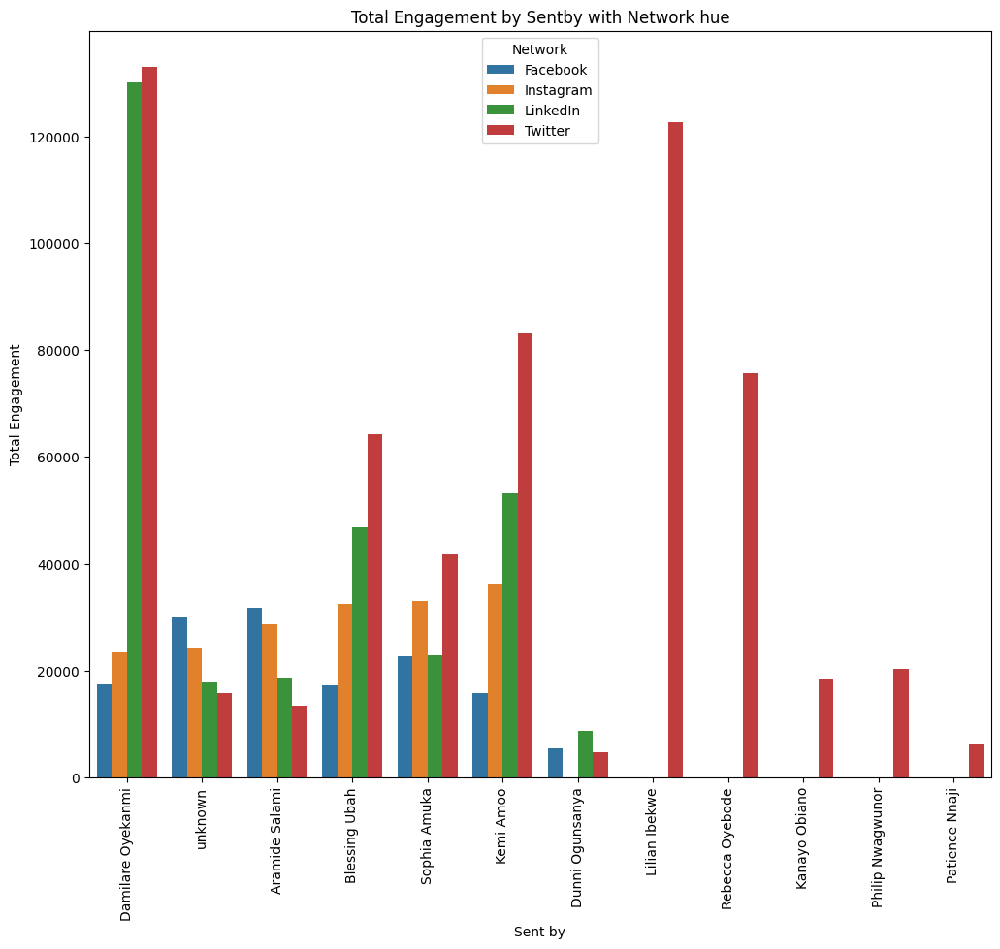

In [105]:
plt.figure(figsize=[12,10])
#coloBase = sb.color_palette()[0]
sb.barplot(data= dfx, x = 'Sent by', y= 'totalEngagement', errorbar= None, hue= 'Network')
plt.xticks(rotation = 90);
plt.title('Total Engagement by Sentby with Network hue')
plt.xlabel('Sent by')
plt.ylabel('Total Engagement');

Damilare Oyekanmi dominates Twitter with the highest engagement, exceeding 120,000 total engagements, closely followed by LinkedIn, also surpassing 120,000. However, his engagement on Instagram and Facebook is comparatively lower, with 22,000 and below 20,000, respectively.

Aramide Salami takes the lead in Facebook engagement with about 30,000, followed by Instagram with approximately 28,000. LinkedIn and Twitter follow with both below 20,000 engagements.

Blessing Ubah commands Twitter with the highest total engagement, around 63,000, followed by LinkedIn with about 48,000 engagements. Instagram secures the third position with about 30,000 total engagements, while Facebook trails with below 20,000 total engagements. Sophia Amuka tops Twitter with the highest total engagement, about 42,000, followed by Instagram with approximately 33,000. She maintains the same engagement level on Facebook and LinkedIn, both totaling about 22,000.

Kemi Amoo claims the highest total engagement on Twitter, reaching about 80,000. LinkedIn follows with about 50,000 total engagements, while Instagram secures the third position with about 38,000. Facebook lags behind with below 20,000 total engagements.

Dunni Ogunsanya records total engagements below 20,000 across LinkedIn, Facebook, and Twitter, ranking first, second, and third, respectively.

Lilian Ibekwe exclusively engages on Twitter, accumulating a total engagement of about 120,000.

Rebecca Oyebode's engagements are solely on Twitter, totaling about 78,000.

Kanayo Obiano's engagements are confined to Twitter, with a modest figure just below 20,000.

Philip Nwagwunor's engagements are concentrated on Twitter, totaling about 20,000.

Patience Nnaji's engagements are confined to Twitter, totaling below 20,000.

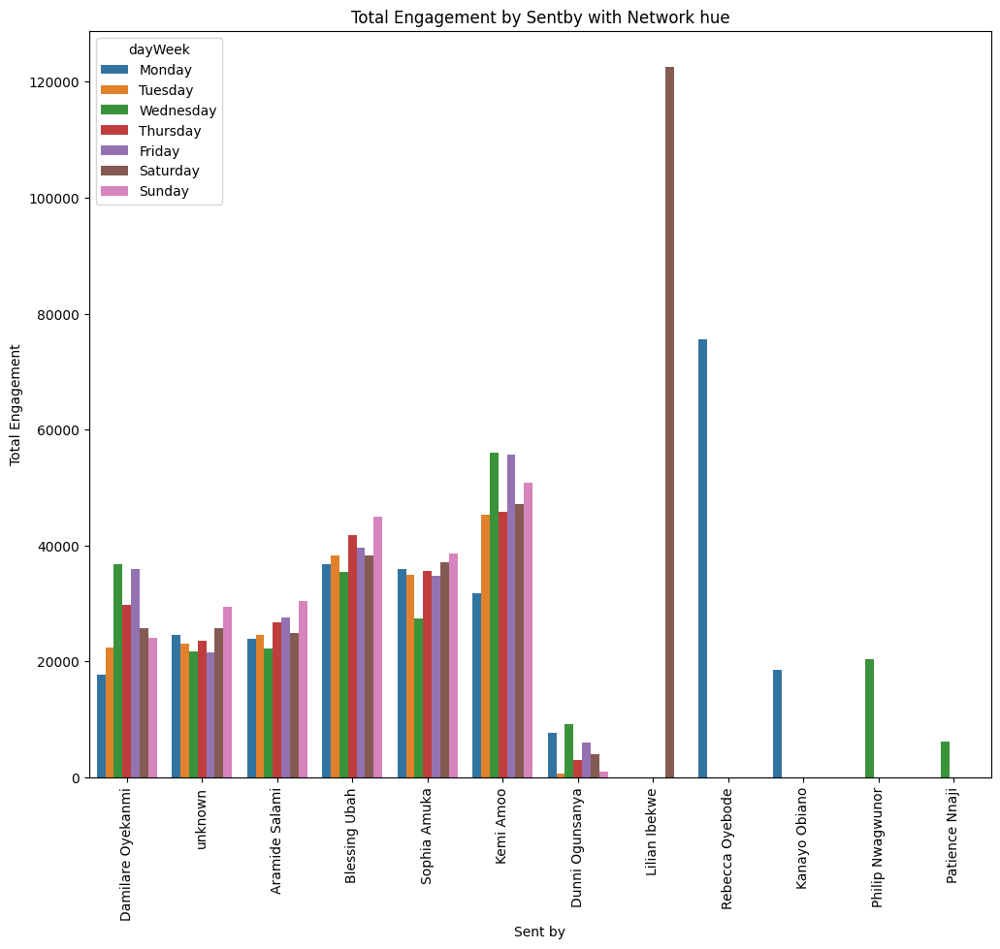

In [106]:
plt.figure(figsize=[12,10])
#coloBase = sb.color_palette()[0]
order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
sb.barplot(data= dfx, x = 'Sent by', y= 'totalEngagement', errorbar= None, hue= 'dayWeek',hue_order= order, palette= 'tab10')
plt.xticks(rotation = 90);
plt.title('Total Engagement by Sentby with Network hue')
plt.xlabel('Sent by')
plt.ylabel('Total Engagement');

In [107]:
dfx['Post']

0       We celebrated recently with Novare, one of our...
1       N5k can get you started today. Call 01 280 126...
2       Still not sure whether to invest in the FGN Bo...
3       Let nothing stop you from achieving your goals...
4       If you were to pick one wish, what would it be...
                              ...                        
8524    FCMB CEO at the Stanbic IBTC sponsored BIT hub...
8525    Next event at the Stanbic IBTC sponsored BIT H...
8526    Now on at the Stanbic IBTC sponsored BIT Hub: ...
8527    '@SMWLagos starts today. We're proud sponsors ...
8528    We are proud to be sponsors of the BIT hub at ...
Name: Post, Length: 36040, dtype: object

In [108]:
nltk.download('punkt')

[nltk_data] Error loading punkt: <urlopen error [Errno 11001]
[nltk_data]     getaddrinfo failed>


False

In [109]:
Post = dfx['Post'].dropna()

In [110]:
Post[0]

0    We celebrated recently with Novare, one of our...
0    The new Naira banknotes in circulation have se...
0    Your money should not be a gamble. Before you ...
0    Your money should not be a gamble. Before you ...
Name: Post, dtype: object

In [111]:
Post
    

0       We celebrated recently with Novare, one of our...
1       N5k can get you started today. Call 01 280 126...
2       Still not sure whether to invest in the FGN Bo...
3       Let nothing stop you from achieving your goals...
4       If you were to pick one wish, what would it be...
                              ...                        
8524    FCMB CEO at the Stanbic IBTC sponsored BIT hub...
8525    Next event at the Stanbic IBTC sponsored BIT H...
8526    Now on at the Stanbic IBTC sponsored BIT Hub: ...
8527    '@SMWLagos starts today. We're proud sponsors ...
8528    We are proud to be sponsors of the BIT hub at ...
Name: Post, Length: 36040, dtype: object

In [112]:
nltk.download('stopwords')

[nltk_data] Error loading stopwords: <urlopen error [Errno 11001]
[nltk_data]     getaddrinfo failed>


False

In [113]:
english_stopwords = stopwords.words('english')

In [114]:
english_stopwords = ", ".join(english_stopwords)
english_stopwords

"i, me, my, myself, we, our, ours, ourselves, you, you're, you've, you'll, you'd, your, yours, yourself, yourselves, he, him, his, himself, she, she's, her, hers, herself, it, it's, its, itself, they, them, their, theirs, themselves, what, which, who, whom, this, that, that'll, these, those, am, is, are, was, were, be, been, being, have, has, had, having, do, does, did, doing, a, an, the, and, but, if, or, because, as, until, while, of, at, by, for, with, about, against, between, into, through, during, before, after, above, below, to, from, up, down, in, out, on, off, over, under, again, further, then, once, here, there, when, where, why, how, all, any, both, each, few, more, most, other, some, such, no, nor, not, only, own, same, so, than, too, very, s, t, can, will, just, don, don't, should, should've, now, d, ll, m, o, re, ve, y, ain, aren, aren't, couldn, couldn't, didn, didn't, doesn, doesn't, hadn, hadn't, hasn, hasn't, haven, haven't, isn, isn't, ma, mightn, mightn't, mustn, mus

In [115]:
symbols = ['@', '#', '%', '^', '$', '*', '^', '&', ',', '.',  ':', '//t.co/lwNxLg911o', ';', '+', '-', '(',
 ')', '!', '?','’', 'H_','_e','_','l_','_e','–', '‘','”','–',]
symbols = ", ".join(symbols)

In [116]:
english_stopwords = english_stopwords + symbols
english_stopwords

"i, me, my, myself, we, our, ours, ourselves, you, you're, you've, you'll, you'd, your, yours, yourself, yourselves, he, him, his, himself, she, she's, her, hers, herself, it, it's, its, itself, they, them, their, theirs, themselves, what, which, who, whom, this, that, that'll, these, those, am, is, are, was, were, be, been, being, have, has, had, having, do, does, did, doing, a, an, the, and, but, if, or, because, as, until, while, of, at, by, for, with, about, against, between, into, through, during, before, after, above, below, to, from, up, down, in, out, on, off, over, under, again, further, then, once, here, there, when, where, why, how, all, any, both, each, few, more, most, other, some, such, no, nor, not, only, own, same, so, than, too, very, s, t, can, will, just, don, don't, should, should've, now, d, ll, m, o, re, ve, y, ain, aren, aren't, couldn, couldn't, didn, didn't, doesn, doesn't, hadn, hadn't, hasn, hasn't, haven, haven't, isn, isn't, ma, mightn, mightn't, mustn, mus

In [117]:
nltk.download('wordnet')

[nltk_data] Error loading wordnet: <urlopen error [Errno 11001]
[nltk_data]     getaddrinfo failed>


False

In [118]:
"""def token_stopword(word):
    tokens = word_tokenize(word)
    lemmatizer = WordNetLemmatizer()
    lemmatized_tokens = [lemmatizer.lemmatize(word) for word in tokens if word.lower() not in english_stopwords]
    return lemmatized_tokens"""


'def token_stopword(word):\n    tokens = word_tokenize(word)\n    lemmatizer = WordNetLemmatizer()\n    lemmatized_tokens = [lemmatizer.lemmatize(word) for word in tokens if word.lower() not in english_stopwords]\n    return lemmatized_tokens'

In [119]:
def token_stopword(word):
    lemmatized_result = []
    for item in word:
        if isinstance(item, str):
            tokens = word_tokenize(item)
            lemmatizer = WordNetLemmatizer()
            lemmatized_tokens = [lemmatizer.lemmatize(word) for word in tokens if word.lower() not in english_stopwords]
            lemmatized_result.extend(lemmatized_tokens)
        else:
            pass
    return lemmatized_result

In [120]:
Post[1].values

array(['N5k can get you started today. Call 01 280 1266 or email assetmanagement@stanbicibtc.com.',
       'We hope the faith that this #GoodFriday restores abides with you and your loved ones. \n#TGIF\n#ITCANBE',
       'What skill (s) do you have, that no one ever taught you? \nShare in the comments!\n#ITCANBE\n',
       'What skill (s) do you have, that no one ever taught you? \nShare in the comments!\n#ITCANBE'],
      dtype=object)

In [121]:
token_stopword(Post[3].values)

['Let',
 'nothing',
 'stop',
 'achieving',
 'goal',
 'new',
 'week',
 'GoForIt',
 '💪🏾',
 'MondayMotivation\u200b',
 'ITCANBE\u200b',
 'new',
 'Naira',
 'banknote',
 'circulation',
 'several',
 'security',
 'feature',
 'ease',
 'recognition',
 'easily',
 'seen',
 'touched',
 'Please',
 'deposit',
 'old',
 'N200',
 'N500',
 'N1000',
 'naira',
 'note',
 'Stanbic',
 'IBTC',
 'branch',
 'near',
 'Image',
 'Source',
 'centralbankng',
 'ITCANBE',
 'Safeguard',
 'every',
 'aspect',
 'operation',
 'comprehensive',
 'insurance',
 'cover',
 'Email',
 'insurancesolution',
 'stanbicibtc.com',
 'today',
 'secure',
 'organisation',
 'future',
 'ITCANBE',
 'mistake',
 'make',
 'season',
 'ITCANBE',
 'http',
 '//t.co/qxv91LCE03']

In [122]:
Post_list = [word for word in Post]

In [123]:
tokenPost = token_stopword(Post_list)

In [124]:
tokenPost

['celebrated',
 'recently',
 'Novare',
 'one',
 'top',
 'client',
 '6th',
 'anniversary',
 'Novare',
 'Lekki',
 'mall',
 'opening',
 'TrustedPartner',
 'ITCANBE',
 'N5k',
 'get',
 'started',
 'today',
 'Call',
 '01',
 '280',
 '1266',
 'email',
 'assetmanagement',
 'stanbicibtc.com',
 'Still',
 'sure',
 'whether',
 'invest',
 'FGN',
 'Bonds',
 '5',
 'reason',
 'Call',
 '01',
 '422',
 '0004',
 'email',
 'stockbroking',
 'stanbicibtc.com',
 'let',
 'get',
 'started',
 'Let',
 'nothing',
 'stop',
 'achieving',
 'goal',
 'new',
 'week',
 'GoForIt',
 '💪🏾',
 'MondayMotivation\u200b',
 'ITCANBE\u200b',
 'pick',
 'one',
 'wish',
 'ITCANBE',
 'Tomorrow',
 'last',
 'day',
 'get',
 'caught',
 'rush',
 'hour',
 'Deposit',
 'old',
 'Naira',
 'note',
 'nearby',
 'Stanbic',
 'IBTC',
 'branch',
 'ITCANBE',
 'prayer',
 'dream',
 'home',
 'answered',
 'Go',
 'home',
 'loan',
 'today.\u200b',
 'Visit',
 'http',
 '//bit.ly/StanbicIBTCHomeLoans',
 'get',
 'started.\u200b',
 'ITCANBE',
 'new',
 'Naira',
 'ba

In [125]:
tokenPostStr = ' '.join(tokenPost)
tokenPostStr

"celebrated recently Novare one top client 6th anniversary Novare Lekki mall opening TrustedPartner ITCANBE N5k get started today Call 01 280 1266 email assetmanagement stanbicibtc.com Still sure whether invest FGN Bonds 5 reason Call 01 422 0004 email stockbroking stanbicibtc.com let get started Let nothing stop achieving goal new week GoForIt 💪🏾 MondayMotivation\u200b ITCANBE\u200b pick one wish ITCANBE Tomorrow last day get caught rush hour Deposit old Naira note nearby Stanbic IBTC branch ITCANBE prayer dream home answered Go home loan today.\u200b Visit http //bit.ly/StanbicIBTCHomeLoans get started.\u200b ITCANBE new Naira banknote circulation several security feature ease recognition easily seen touched Please deposit old N200 N500 N1000 naira note Stanbic IBTC branch near ITCANBE Image Source Central Bank Nigeria Find missing letter H_ Hint movie boy forgotten home Experience financial confidence freedom Open BluEdge account today Call 0700 909 909 909 email CustomerCareNigeria

## Post  Word Cloud 

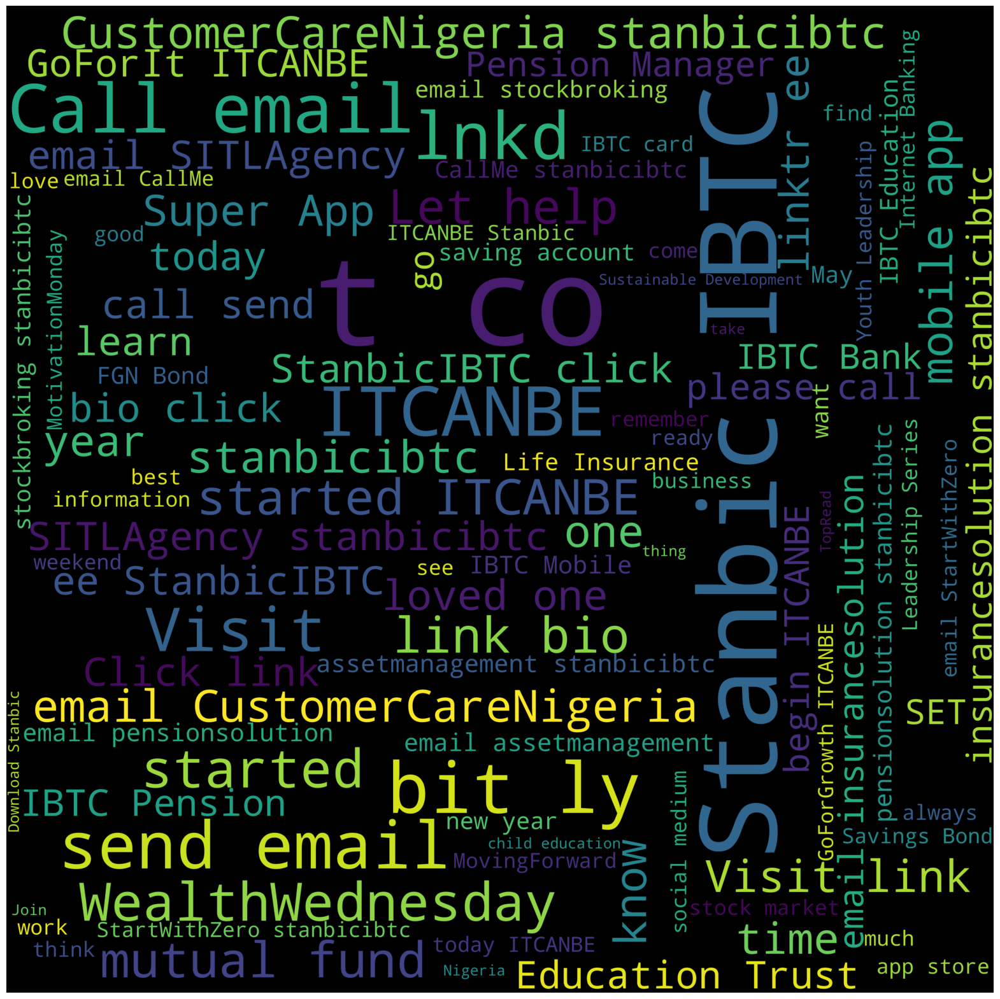

In [128]:
wordcloud = WordCloud(
    max_font_size=100,
    max_words=100,
    background_color="black",
    scale=10,
    width=800,
    height=800
).generate(tokenPostStr)
#Figure properties
plt.figure(figsize=(20,25))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.show()

In [129]:
def token_str(df):
    Post = df['Post']
    Post_list = [word for word in Post]
    tokenizer = token_stopword(Post_list) 
    strDf =  ' '.join(tokenizer)
    
    wordcloud = WordCloud(
    max_font_size=100,
    max_words=100,
    background_color="black",
    scale=10,
    width=800,
    height=800
    ).generate(strDf)
    #Figure properties
    plt.figure(figsize=(20,25))
    plt.imshow(wordcloud, interpolation="bilinear")
    plt.axis("off")
    plt.show()
    

## Linkdin Post Word Cloud

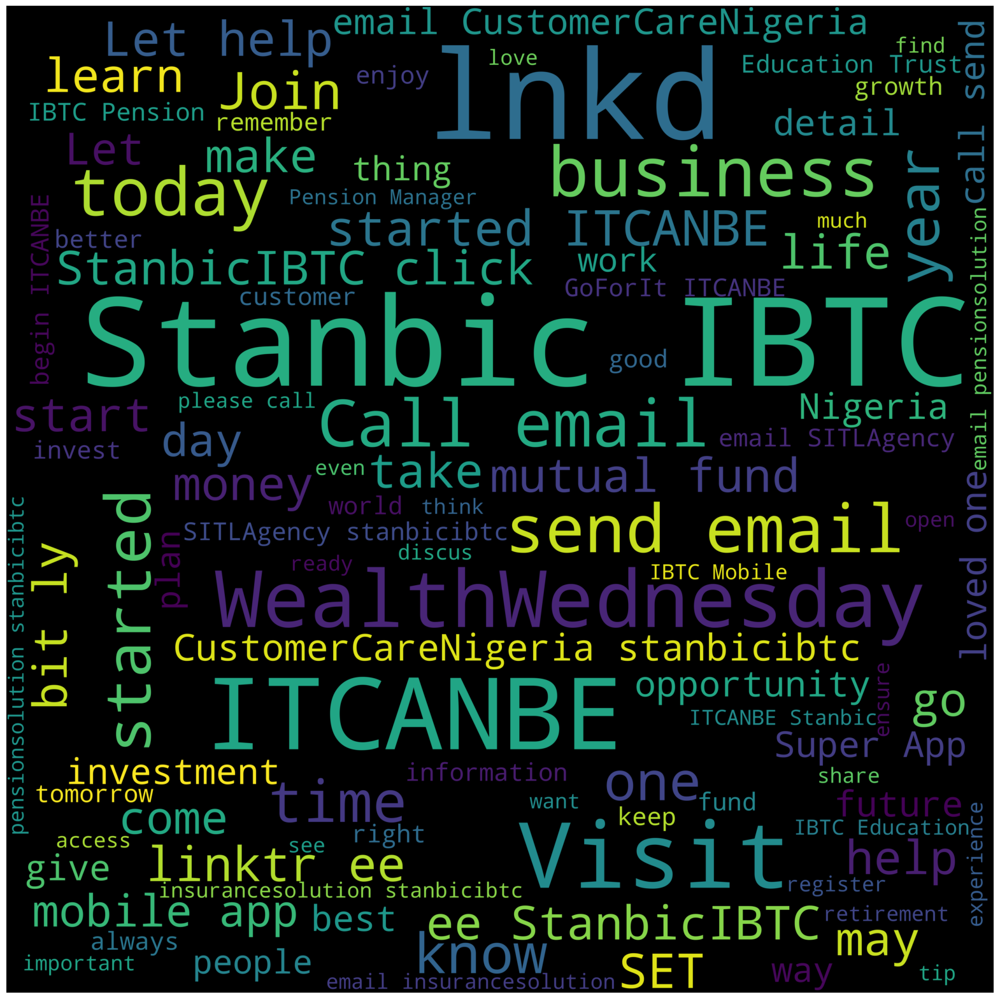

In [130]:
token_str(linkd)

## Twitter Post Word Cloud 

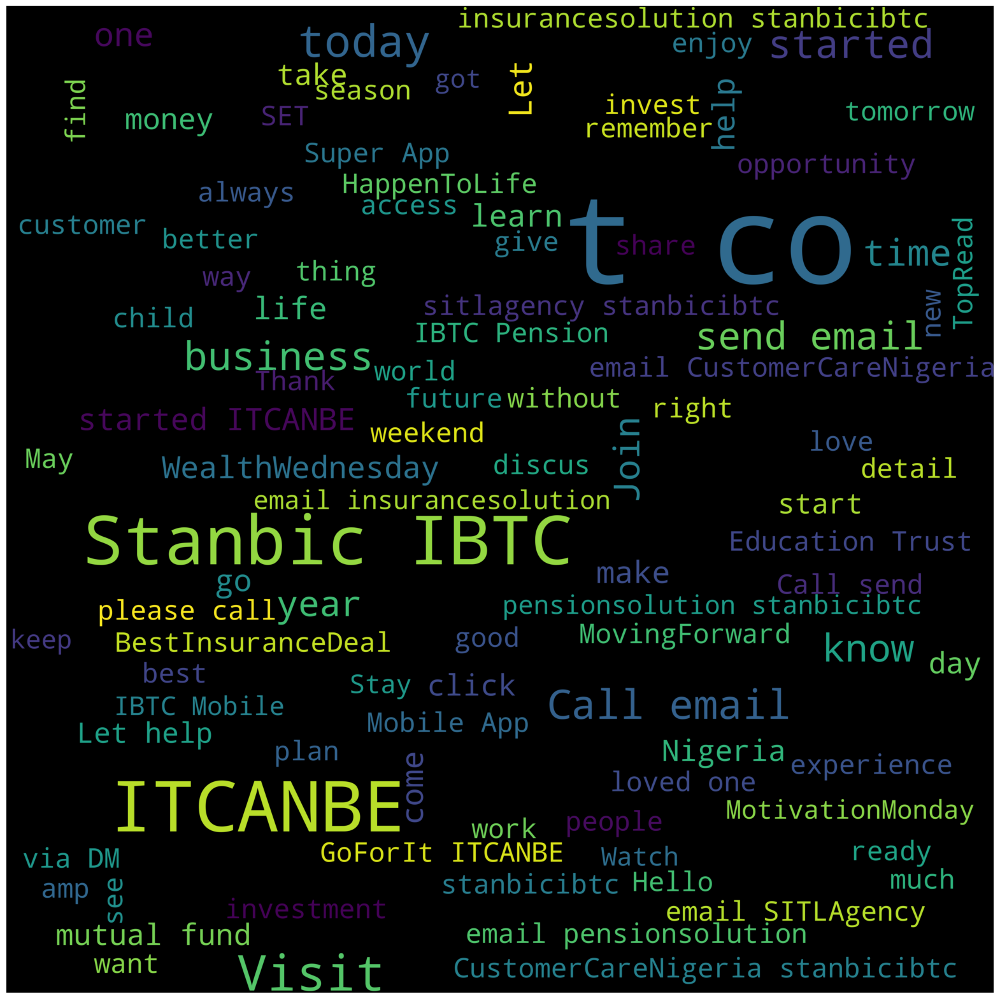

In [131]:
token_str(twitter)

## Facebook Post  Word Cloud 

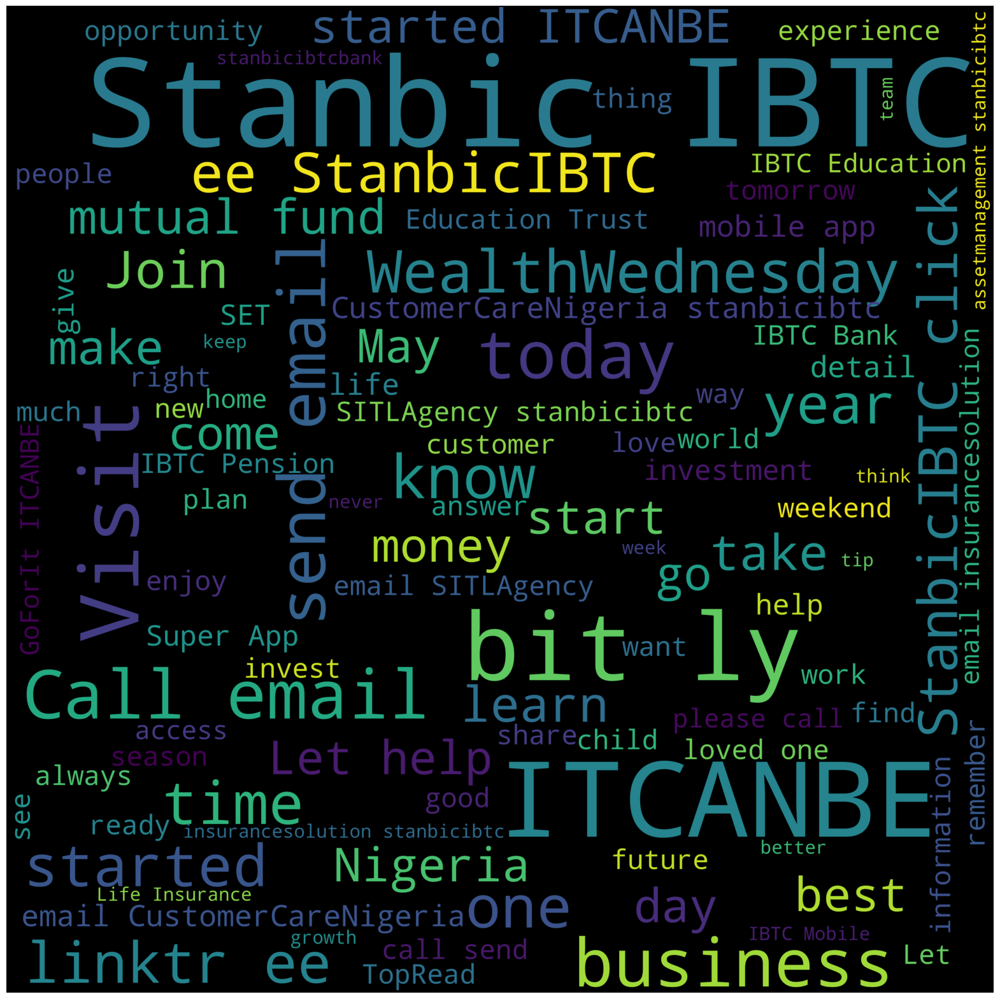

In [132]:
token_str(facebook)

## Instagram Post Word Cloud 

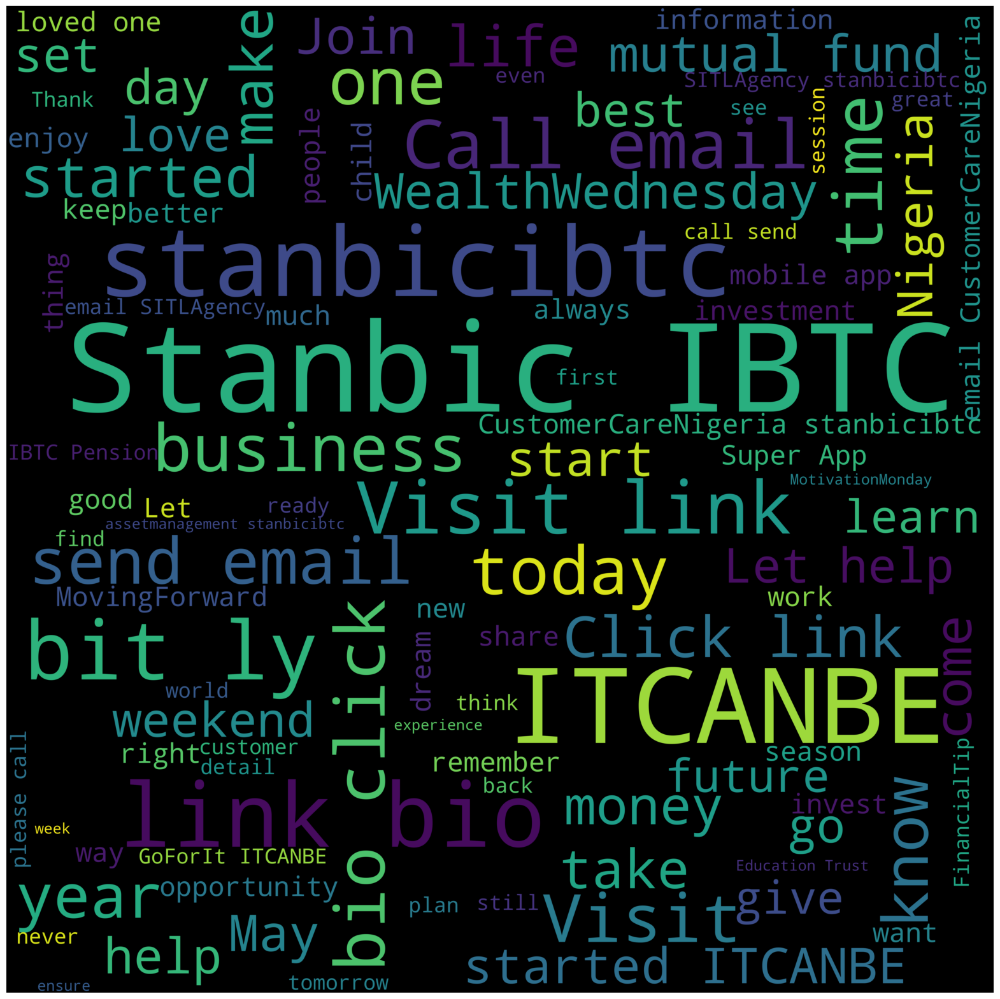

In [133]:
token_str(inst)

In [134]:
def token_str(df):
    Post = df['Tags']
    Post_list = [word for word in Post]
    tokenizer = token_stopword(Post_list) 
    strDf =  ' '.join(tokenizer)
    
    wordcloud = WordCloud(
    max_font_size=100,
    max_words=100,
    background_color="black",
    scale=10,
    width=800,
    height=800
    ).generate(strDf)
    #Figure properties
    plt.figure(figsize=(20,25))
    plt.imshow(wordcloud, interpolation="bilinear")
    plt.axis("off")
    plt.show()
    

## Tag Word Cloud 

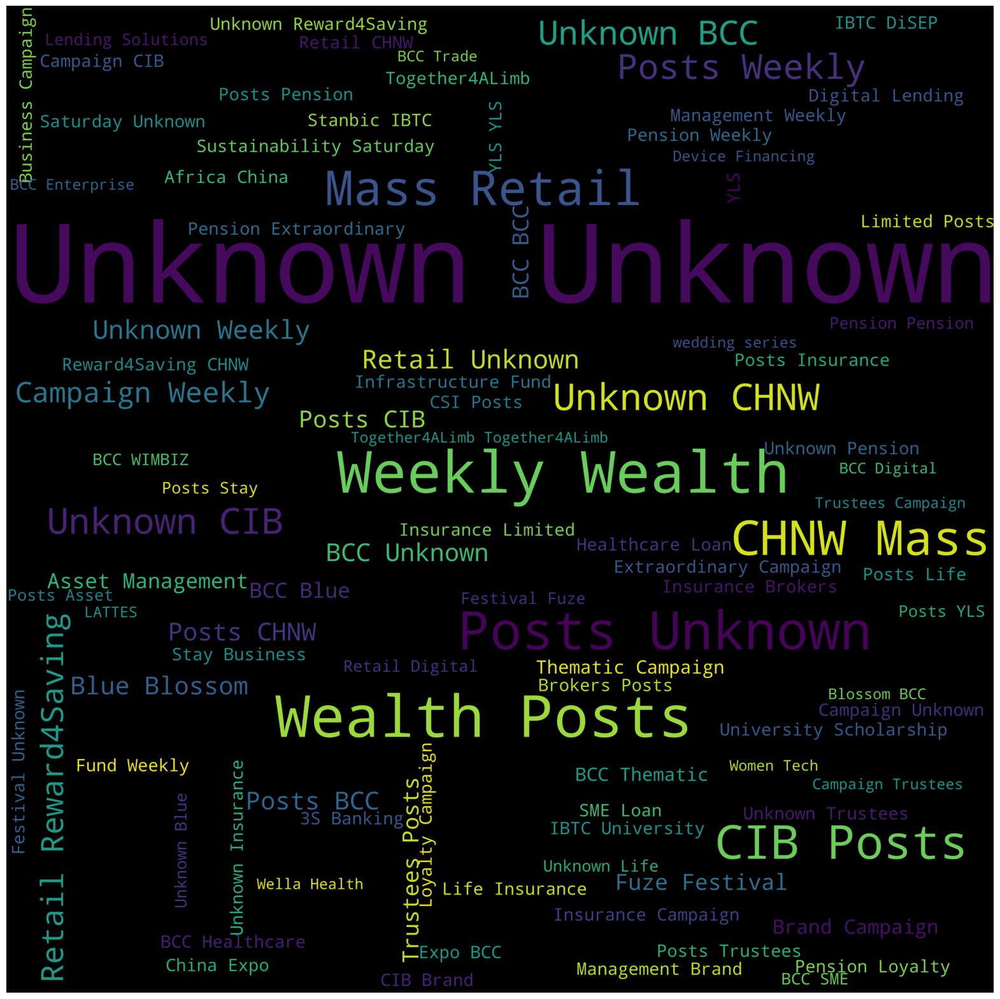

In [135]:
token_str(dfx)

# Data Preprocessing for Machine Learning 
## Predicting Impressions

In [248]:
dfn = dfx.drop(columns = engagement_columns)

In [249]:
dfn.shape

(36040, 103)

In [250]:
dfn.isna().sum().to_dict()

{'Date': 0,
 'Network': 0,
 'Content Type': 0,
 'Sent by': 0,
 'Post': 0,
 'Paid Impressions': 0,
 'Fan Paid Impressions': 0,
 'Non-fan Paid Impressions': 0,
 'Paid Reach': 0,
 'Fan Paid Reach': 0,
 'Engagement Rate (per Impression)': 0,
 'Engagement Rate (per Reach)': 0,
 'Dislikes': 0,
 'Shares': 0,
 'Saves': 0,
 'Click-Through Rate': 0,
 'Post Hashtag Clicks': 0,
 'Profile Clicks': 0,
 'Post Video Play Clicks': 0,
 'App Engagements': 0,
 'App Install Attempts': 0,
 'App Opens': 0,
 'Follows from Post': 0,
 'Unfollows from Post': 0,
 'Negative Feedback': 0,
 'bit.ly Link Clicks': 0,
 'Engaged Users': 0,
 'Engaged Fans': 0,
 'Users Talking About This': 0,
 'Unique Reactions': 0,
 'Unique Post Clicks': 0,
 'Unique Post Photo View Clicks': 0,
 'Unique Other Post Clicks': 0,
 'Subscribers Gained from Video': 0,
 'Annotation Clicks': 0,
 'Card Clicks': 0,
 'Video Views': 0,
 'Media Views': 0,
 'Organic Video Views': 0,
 'Partial Video Views': 0,
 'Organic Partial Video Views': 0,
 'Paid P

In [251]:
col = []
for i in dfn.columns:
    if i != 'totalEngagement':
        col.append(i)

In [252]:
for i in dfn[names_only1].columns:
    print(i,dfn[i].unique())

Paid Impressions [0.]
Fan Paid Impressions [0.]
Non-fan Paid Impressions [0.]
Paid Reach [0.]
Fan Paid Reach [0.]
Dislikes [0.]
Saves [  2.04943636 625.          21.          11.         337.
  20.           9.          15.          13.          23.
  19.           8.          10.           2.          18.
  24.           6.           1.           4.          16.
  33.           3.          87.          25.           7.
   5.          12.          14.           0.          78.
  31.          17.          42.          35.          45.
  26.          29.          22.          41.         150.
 103.          27.          28.        ]
Post Hashtag Clicks [  1.53400034   0.           1.           2.           3.
   4.           5.           6.          11.           7.
  16.          30.         661.          12.          19.
  48.         812.          10.          13.           9.
  24.          29.           8.          14.          36.
  20.          15.          26.          17.       

In [253]:
dfn.drop(columns=['Subscribers Gained from Video',
                  'Annotation Clicks',
                  'Card Clicks',
                  'Full Video View Rate',
                  'Follow Video Views',
                  'For You Video Views',
                  'Hashtag Video Views',
                  'Business Account Video Views',
                  'Sound Video Views',
                  'Unspecified Video Views',
                  'Video Ad Break Ad Impressions',
                  'Video Ad Break Ad Earnings',
                  'Video Ad Break Ad Cost per Impression (CPM)',
                  'YouTube Premium Views',
                  'Estimated Minutes Watched',
                  'Estimated Premium Minutes Watched',
                  'Story Taps Back',
                  'Story Taps Forward',
                  'Story Exits',
                  'Story Replies',
                  'Video Added to Playlists',
                  'Subscribers Lost from Video',
                  'Video Removed from Playlists',
                  'Annotation Impressions',
                  'Annotation Clickable Impressions',
                  'Annotation Closable Impressions',
                  'Annotation Closes',
                  'Click to Play Partial Video Views',
                  'Card Impressions',
                  'Card Teaser Impressions',
                  'Card Teaser Clicks',
                  'App Install Attempts',
                  'Paid Impressions',
                  'Fan Paid Impressions',
                  'Non-fan Paid Impressions',
                  'Paid Reach',
                  'Fan Paid Reach',
                  'Dislikes'], inplace=True)


In [254]:
dfn

,Date,Network,Content Type,Sent by,Post,Engagement Rate (per Impression),Engagement Rate (per Reach),Shares,Saves,Click-Through Rate,...,Reach,Organic Reach,Viral Reach,Non-viral Reach,Fan Reach,Potential Reach,totalEngagement,dayWeek,Month_Year,Hours
0,2022-12-17 17:08:00,Facebook,Video,Damilare Oyekanmi,"We celebrated recently with Novare, one of our...",0.490,0.49,2.0,2.049436,0.0,...,207378.0,207378.0,4.0,213627.0,1112.0,919622.4,38995.470,Saturday,2022-12,17
1,2019-05-04 10:01:00,Facebook,Photo,unknown,N5k can get you started today. Call 01 280 126...,4.670,6.39,47.0,2.049436,0.0,...,92009.0,92009.0,17238.0,76074.0,76764.0,919622.4,212154.264,Saturday,2019-05,10
2,2020-06-02 21:00:00,Facebook,Photo,unknown,Still not sure whether to invest in the FGN Bo...,5.290,5.62,29.0,2.049436,0.0,...,84347.0,84347.0,8910.0,75068.0,74322.0,919622.4,266716.654,Tuesday,2020-06,21
3,2022-05-09 10:37:00,Facebook,Photo,Damilare Oyekanmi,Let nothing stop you from achieving your goals...,0.560,0.57,2.0,2.049436,0.0,...,78407.0,78407.0,166.0,78237.0,3245.0,919622.4,203469.252,Monday,2022-05,10
4,2021-07-18 10:00:00,Facebook,Photo,unknown,"If you were to pick one wish, what would it be...",6.160,6.39,10.0,2.049436,0.0,...,74035.0,74035.0,20531.0,55026.0,53782.0,919622.4,233979.304,Sunday,2021-07,10
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8524,2013-02-18 19:39:00,Twitter,Text,unknown,FCMB CEO at the Stanbic IBTC sponsored BIT hub...,2.438,0.00,2.0,2.049436,0.0,...,0.0,0.0,0.0,0.0,0.0,218691.4,126.538,Monday,2013-02,19
8525,2013-02-18 19:13:00,Twitter,Text,unknown,Next event at the Stanbic IBTC sponsored BIT H...,4.164,0.00,6.0,2.049436,0.0,...,0.0,0.0,0.0,0.0,0.0,236549.4,113.338,Monday,2013-02,19
8526,2013-02-18 11:18:00,Twitter,Text,unknown,Now on at the Stanbic IBTC sponsored BIT Hub: ...,4.164,0.00,6.0,2.049436,0.0,...,0.0,0.0,0.0,0.0,0.0,221828.2,137.294,Monday,2013-02,11
8527,2013-02-18 09:01:00,Twitter,Photo,unknown,'@SMWLagos starts today. We're proud sponsors ...,2.438,0.00,2.0,2.049436,0.0,...,0.0,0.0,0.0,0.0,0.0,281266.8,178.538,Monday,2013-02,9


In [255]:
dfn.describe().T

,count,mean,min,25%,50%,75%,max,std
Date,36040,2020-02-04 21:29:31.696448512,2013-01-15 16:25:00,2018-04-27 11:16:00,2020-05-22 10:00:00,2022-02-02 19:39:15,2023-07-13 12:03:00,NaN
Engagement Rate (per Impression),36040.0,5.516564,0.0,1.86,2.67,4.06,2757.0,49.985829
Engagement Rate (per Reach),36040.0,41.664508,0.0,1.84,2.8,4.44,13126.79,212.276241
Shares,36040.0,7.950168,0.0,0.0,2.0,9.0,588.0,17.277426
Saves,36040.0,2.049436,0.0,2.049436,2.049436,2.049436,625.0,4.105237
Click-Through Rate,36040.0,0.21487,0.0,0.0,0.0,0.0,500.0,6.703831
Post Hashtag Clicks,36040.0,1.534,0.0,1.534,1.534,1.534,812.0,5.688759
Profile Clicks,36040.0,5.116934,0.0,5.116934,5.116934,5.116934,609.0,6.392574
Post Video Play Clicks,36040.0,34.269755,0.0,5.2,13.2,28.327922,1306.0,84.259702
App Engagements,36040.0,0.00051,0.0,0.00051,0.00051,0.00051,2.0,0.012901


In [256]:
dfn.shape

(36040, 65)

<Figure size 1600x2000 with 0 Axes>

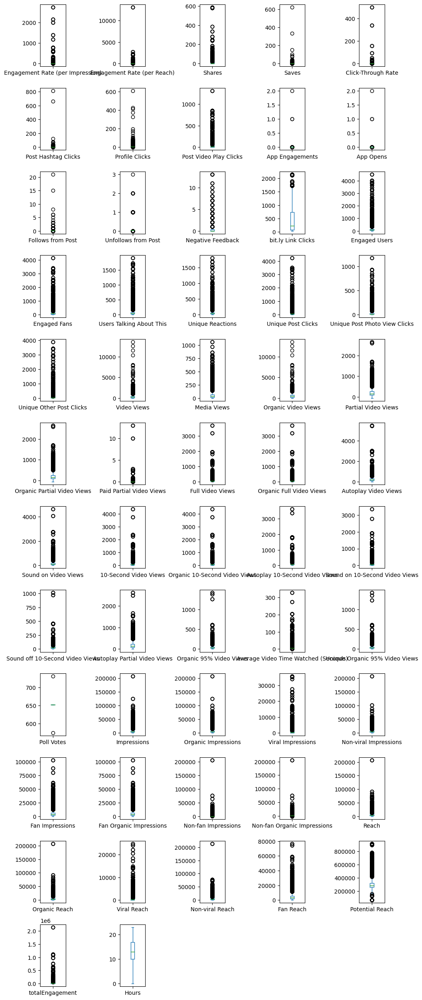

In [257]:
from matplotlib.pyplot import figure

figure(figsize=(20, 25), dpi = 80)
dfn.plot(kind='box', subplots=True, layout=(12,5), sharex=False, sharey=False)
plt.tight_layout()
plt.rcParams["figure.figsize"] = (10,25)
plt.show();

In [258]:
outliers = []
def detect_outliers_iqr(data):
    data = sorted(data)
    q1 = np.percentile(data, 25)
    q3 = np.percentile(data, 75)
    # print(q1, q3)
    IQR = q3-q1
    lwr_bound = q1-(1.5*IQR)
    upr_bound = q3+(1.5*IQR)
    # print(lwr_bound, upr_bound)
    for i in data: 
        if (i<lwr_bound or i>upr_bound):
            outliers.append(i)
    return outliers

In [259]:
dfn.shape

(36040, 65)

In [260]:
sample_outliers = detect_outliers_iqr(dfn['Organic Impressions'])
dfn.drop(dfn[dfn['Organic Impressions'].isin(sample_outliers)].index, inplace=True)

In [261]:
dfn.shape

(33445, 65)

<Figure size 1600x2000 with 0 Axes>

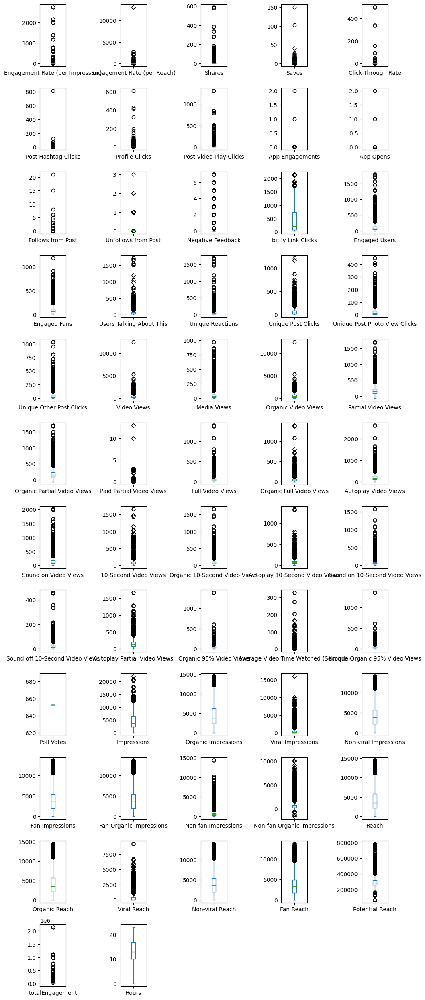

In [262]:
from matplotlib.pyplot import figure

figure(figsize=(20, 25), dpi = 80)
dfn.plot(kind='box', subplots=True, layout=(12,5), sharex=False, sharey=False)
plt.tight_layout()
plt.rcParams["figure.figsize"] = (10,25)
plt.show();

In [263]:
sample_outliers = detect_outliers_iqr(dfn['Post Video Play Clicks'])
dfn.drop(dfn[dfn['Post Video Play Clicks'].isin(sample_outliers)].index, inplace=True)

In [264]:
dfn.shape

(31486, 65)

<Figure size 1600x2000 with 0 Axes>

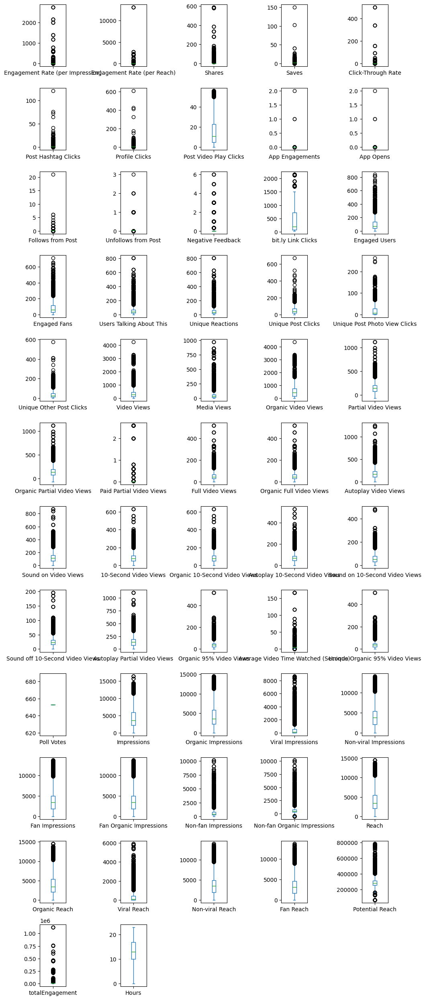

In [265]:
from matplotlib.pyplot import figure

figure(figsize=(20, 25), dpi = 80)
dfn.plot(kind='box', subplots=True, layout=(12,5), sharex=False, sharey=False)
plt.tight_layout()
plt.rcParams["figure.figsize"] = (10,25)
plt.show();

In [266]:
sample_outliers = detect_outliers_iqr(dfn['Viral Impressions'])
dfn.drop(dfn[dfn['Viral Impressions'].isin(sample_outliers)].index, inplace=True)

In [267]:
dfn.shape

(25573, 65)

<Figure size 1600x2000 with 0 Axes>

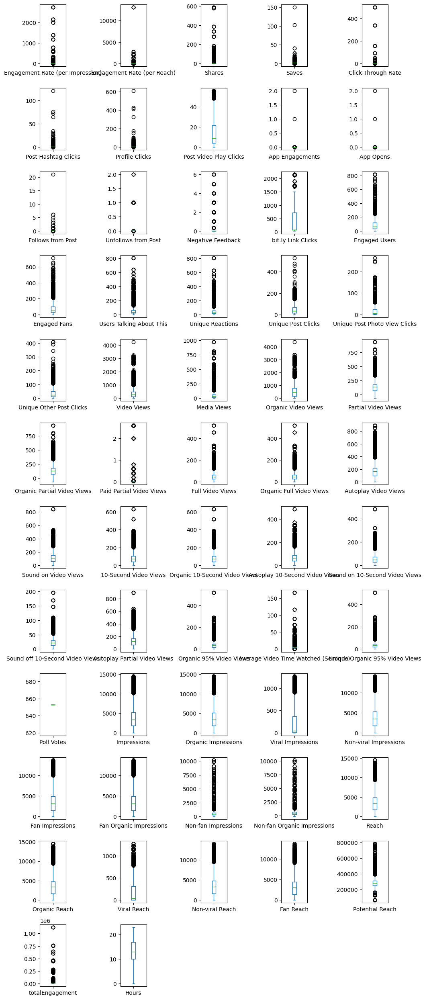

In [268]:
from matplotlib.pyplot import figure

figure(figsize=(20, 25), dpi = 80)
dfn.plot(kind='box', subplots=True, layout=(12,5), sharex=False, sharey=False)
plt.tight_layout()
plt.rcParams["figure.figsize"] = (10,25)
plt.show();

In [269]:
sample_outliers = detect_outliers_iqr(dfn['Post Video Play Clicks'])
dfn.drop(dfn[dfn['Post Video Play Clicks'].isin(sample_outliers)].index, inplace=True)

In [270]:
dfn.shape

(24992, 65)

In [271]:
sample_outliers = detect_outliers_iqr(dfn['Sound on Video Views'])
dfn.drop(dfn[dfn['Sound on Video Views'].isin(sample_outliers)].index, inplace=True)

In [272]:
dfn.shape

(18489, 65)

<Figure size 1600x2000 with 0 Axes>

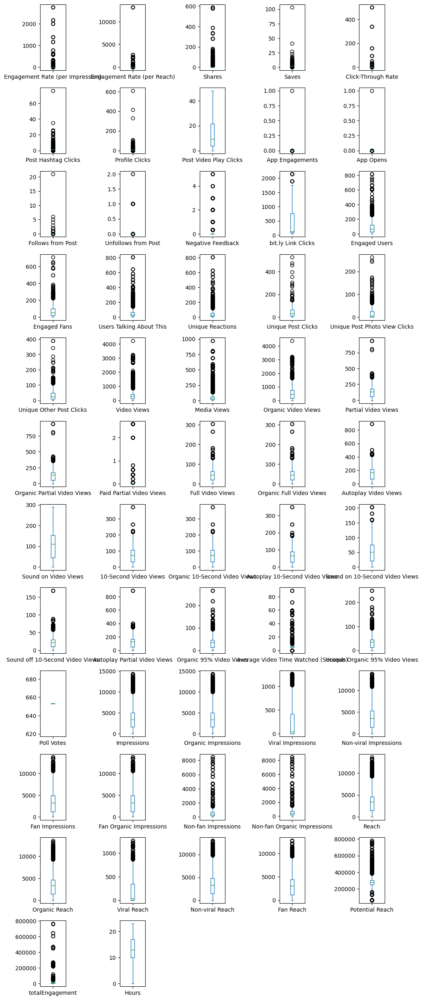

In [273]:
from matplotlib.pyplot import figure

figure(figsize=(20, 25), dpi = 80)
dfn.plot(kind='box', subplots=True, layout=(12,5), sharex=False, sharey=False)
plt.tight_layout()
plt.rcParams["figure.figsize"] = (10,25)
plt.show();

In [274]:
num_col = dfn.select_dtypes('number').columns
dfn[num_col].skew().to_dict()

{'Engagement Rate (per Impression)': 29.59733881117309,
 'Engagement Rate (per Reach)': 20.7751231518281,
 'Shares': 18.150377193426273,
 'Saves': 33.18510542292331,
 'Click-Through Rate': 44.61017733993964,
 'Post Hashtag Clicks': 26.02909228519397,
 'Profile Clicks': 57.42887778652256,
 'Post Video Play Clicks': 0.7595394500664668,
 'App Engagements': 135.8159433447415,
 'App Opens': 135.8159433447415,
 'Follows from Post': 87.3336735940031,
 'Unfollows from Post': 15.78342515245292,
 'Negative Feedback': 3.301018481363526,
 'bit.ly Link Clicks': 0.7743299856307614,
 'Engaged Users': 1.964832026156445,
 'Engaged Fans': 1.509852406350992,
 'Users Talking About This': 4.484817794345305,
 'Unique Reactions': 5.2751585357185995,
 'Unique Post Clicks': 1.1210790851244803,
 'Unique Post Photo View Clicks': 2.3223310932226364,
 'Unique Other Post Clicks': 1.42653358827609,
 'Video Views': 2.8977120397336864,
 'Media Views': 5.074601520383421,
 'Organic Video Views': 1.5721158942426232,
 'Pa

In [275]:
dfn[num_col]  = np.log1p(dfn[num_col])

In [276]:
dfn[num_col].skew().to_dict()

{'Engagement Rate (per Impression)': 2.3677760895038293,
 'Engagement Rate (per Reach)': 2.1456206011711663,
 'Shares': 0.5143852777424518,
 'Saves': -1.531401150684256,
 'Click-Through Rate': 10.688633882801243,
 'Post Hashtag Clicks': -0.9371123466351708,
 'Profile Clicks': -1.617864409698416,
 'Post Video Play Clicks': -0.6577973033313272,
 'App Engagements': 135.64510724733782,
 'App Opens': 135.64510724733782,
 'Follows from Post': 22.9814806813845,
 'Unfollows from Post': 14.61679313900425,
 'Negative Feedback': 2.188685565511089,
 'bit.ly Link Clicks': 0.14652277686251863,
 'Engaged Users': -1.232689480499844,
 'Engaged Fans': -1.1845863982471168,
 'Users Talking About This': -1.0922768213769412,
 'Unique Reactions': -1.0514964680443892,
 'Unique Post Clicks': -1.0095797309019625,
 'Unique Post Photo View Clicks': 0.011733986313890122,
 'Unique Other Post Clicks': -0.9214212067075216,
 'Video Views': -1.9621479197916716,
 'Media Views': -0.18619489048605342,
 'Organic Video View

In [277]:
dfn.isna().sum().to_dict()

{'Date': 0,
 'Network': 0,
 'Content Type': 0,
 'Sent by': 0,
 'Post': 0,
 'Engagement Rate (per Impression)': 0,
 'Engagement Rate (per Reach)': 0,
 'Shares': 0,
 'Saves': 0,
 'Click-Through Rate': 0,
 'Post Hashtag Clicks': 0,
 'Profile Clicks': 0,
 'Post Video Play Clicks': 0,
 'App Engagements': 0,
 'App Opens': 0,
 'Follows from Post': 0,
 'Unfollows from Post': 0,
 'Negative Feedback': 0,
 'bit.ly Link Clicks': 0,
 'Engaged Users': 0,
 'Engaged Fans': 0,
 'Users Talking About This': 0,
 'Unique Reactions': 0,
 'Unique Post Clicks': 0,
 'Unique Post Photo View Clicks': 0,
 'Unique Other Post Clicks': 0,
 'Video Views': 0,
 'Media Views': 0,
 'Organic Video Views': 0,
 'Partial Video Views': 4,
 'Organic Partial Video Views': 4,
 'Paid Partial Video Views': 0,
 'Full Video Views': 0,
 'Organic Full Video Views': 0,
 'Autoplay Video Views': 0,
 'Sound on Video Views': 0,
 '10-Second Video Views': 0,
 'Organic 10-Second Video Views': 0,
 'Autoplay 10-Second Video Views': 0,
 'Sound o

In [278]:
dfn['Non-fan Organic Impressions'].corr(dfn['Non-fan Impressions'])

0.9975220285388384

In [279]:
dfn.drop(columns = ['Post', 'Tags', 'Month_Year', 'Date', 'Non-fan Organic Impressions'], inplace = True)
dfn

,Network,Content Type,Sent by,Engagement Rate (per Impression),Engagement Rate (per Reach),Shares,Saves,Click-Through Rate,Post Hashtag Clicks,Profile Clicks,...,Non-fan Impressions,Reach,Organic Reach,Viral Reach,Non-viral Reach,Fan Reach,Potential Reach,totalEngagement,dayWeek,Hours
587,Facebook,Photo,Aramide Salami,1.184790,1.184790,1.791759,1.114957,0.0,0.929799,1.811061,...,6.502790,9.494240,9.494240,5.676754,9.479527,9.455402,12.521052,10.722625,Monday,2.397895
604,Facebook,Photo,unknown,1.184790,1.205971,1.945910,1.114957,0.0,0.929799,1.811061,...,6.787845,9.479833,9.479833,6.396930,9.421087,9.400961,12.925289,10.726620,Wednesday,3.135494
652,Facebook,Photo,unknown,0.570980,0.576613,0.000000,1.114957,0.0,0.929799,1.811061,...,8.711608,9.446519,9.446519,3.258097,9.446282,8.841304,12.675143,11.475095,Wednesday,2.833213
664,Facebook,Photo,unknown,0.837248,0.837248,2.079442,1.114957,0.0,0.929799,1.811061,...,8.331586,9.438830,9.438830,6.849066,9.377210,9.055790,12.697824,11.416998,Sunday,2.944439
675,Facebook,Photo,Blessing Ubah,0.494696,0.500775,0.000000,1.114957,0.0,0.929799,1.811061,...,8.933796,9.427627,9.427627,2.833213,9.427144,8.553718,12.770976,12.500114,Sunday,3.044522
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8524,Twitter,Text,unknown,1.234890,0.000000,1.098612,1.114957,0.0,0.929799,1.811061,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,12.295421,4.848414,Monday,2.995732
8525,Twitter,Text,unknown,1.641711,0.000000,1.945910,1.114957,0.0,0.929799,1.811061,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,12.373917,4.739159,Monday,2.995732
8526,Twitter,Text,unknown,1.641711,0.000000,1.945910,1.114957,0.0,0.929799,1.811061,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,12.309663,4.929382,Monday,2.484907
8527,Twitter,Photo,unknown,1.234890,0.000000,1.098612,1.114957,0.0,0.929799,1.811061,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,12.547063,5.190387,Monday,2.302585


In [280]:
dfn.dropna(inplace = True)

In [281]:
cate = dfn.select_dtypes('object')
cate

,Network,Sent by,dayWeek
587,Facebook,Aramide Salami,Monday
604,Facebook,unknown,Wednesday
652,Facebook,unknown,Wednesday
664,Facebook,unknown,Sunday
675,Facebook,Blessing Ubah,Sunday
...,...,...,...
8524,Twitter,unknown,Monday
8525,Twitter,unknown,Monday
8526,Twitter,unknown,Monday
8527,Twitter,unknown,Monday


In [282]:
dfn = pd.get_dummies(dfn, columns=['Network', 'Sent by', 'dayWeek', 'Content Type'])
dfn


,Engagement Rate (per Impression),Engagement Rate (per Reach),Shares,Saves,Click-Through Rate,Post Hashtag Clicks,Profile Clicks,Post Video Play Clicks,App Engagements,App Opens,...,dayWeek_Thursday,dayWeek_Tuesday,dayWeek_Wednesday,Content Type_Carousel,Content Type_Document,Content Type_Link,Content Type_Photo,Content Type_Poll,Content Type_Text,Content Type_Video
587,1.184790,1.184790,1.791759,1.114957,0.0,0.929799,1.811061,3.484312,0.00051,0.00051,...,False,False,False,False,False,False,True,False,False,False
604,1.184790,1.205971,1.945910,1.114957,0.0,0.929799,1.811061,3.887730,0.00051,0.00051,...,False,False,True,False,False,False,True,False,False,False
652,0.570980,0.576613,0.000000,1.114957,0.0,0.929799,1.811061,2.028148,0.00051,0.00051,...,False,False,True,False,False,False,True,False,False,False
664,0.837248,0.837248,2.079442,1.114957,0.0,0.929799,1.811061,3.210844,0.00051,0.00051,...,False,False,False,False,False,False,True,False,False,False
675,0.494696,0.500775,0.000000,1.114957,0.0,0.929799,1.811061,2.240710,0.00051,0.00051,...,False,False,False,False,False,False,True,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8524,1.234890,0.000000,1.098612,1.114957,0.0,0.929799,1.811061,0.000000,0.00051,0.00051,...,False,False,False,False,False,False,False,False,True,False
8525,1.641711,0.000000,1.945910,1.114957,0.0,0.929799,1.811061,0.000000,0.00051,0.00051,...,False,False,False,False,False,False,False,False,True,False
8526,1.641711,0.000000,1.945910,1.114957,0.0,0.929799,1.811061,0.000000,0.00051,0.00051,...,False,False,False,False,False,False,False,False,True,False
8527,1.234890,0.000000,1.098612,1.114957,0.0,0.929799,1.811061,0.000000,0.00051,0.00051,...,False,False,False,False,False,False,True,False,False,False


In [283]:
boolDf = dfn.select_dtypes('bool')
boolCol = boolDf.columns
dfn[boolCol] = dfn[boolCol].astype(int)

In [284]:
dfn[boolCol]

,Network_Facebook,Network_Instagram,Network_LinkedIn,Network_Twitter,Sent by_Aramide Salami,Sent by_Blessing Ubah,Sent by_Damilare Oyekanmi,Sent by_Dunni Ogunsanya,Sent by_Kanayo Obiano,Sent by_Kemi Amoo,...,dayWeek_Thursday,dayWeek_Tuesday,dayWeek_Wednesday,Content Type_Carousel,Content Type_Document,Content Type_Link,Content Type_Photo,Content Type_Poll,Content Type_Text,Content Type_Video
587,1,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
604,1,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,1,0,0,0
652,1,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,1,0,0,0
664,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
675,1,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8524,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
8525,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
8526,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
8527,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0


In [285]:
dfn

,Engagement Rate (per Impression),Engagement Rate (per Reach),Shares,Saves,Click-Through Rate,Post Hashtag Clicks,Profile Clicks,Post Video Play Clicks,App Engagements,App Opens,...,dayWeek_Thursday,dayWeek_Tuesday,dayWeek_Wednesday,Content Type_Carousel,Content Type_Document,Content Type_Link,Content Type_Photo,Content Type_Poll,Content Type_Text,Content Type_Video
587,1.184790,1.184790,1.791759,1.114957,0.0,0.929799,1.811061,3.484312,0.00051,0.00051,...,0,0,0,0,0,0,1,0,0,0
604,1.184790,1.205971,1.945910,1.114957,0.0,0.929799,1.811061,3.887730,0.00051,0.00051,...,0,0,1,0,0,0,1,0,0,0
652,0.570980,0.576613,0.000000,1.114957,0.0,0.929799,1.811061,2.028148,0.00051,0.00051,...,0,0,1,0,0,0,1,0,0,0
664,0.837248,0.837248,2.079442,1.114957,0.0,0.929799,1.811061,3.210844,0.00051,0.00051,...,0,0,0,0,0,0,1,0,0,0
675,0.494696,0.500775,0.000000,1.114957,0.0,0.929799,1.811061,2.240710,0.00051,0.00051,...,0,0,0,0,0,0,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8524,1.234890,0.000000,1.098612,1.114957,0.0,0.929799,1.811061,0.000000,0.00051,0.00051,...,0,0,0,0,0,0,0,0,1,0
8525,1.641711,0.000000,1.945910,1.114957,0.0,0.929799,1.811061,0.000000,0.00051,0.00051,...,0,0,0,0,0,0,0,0,1,0
8526,1.641711,0.000000,1.945910,1.114957,0.0,0.929799,1.811061,0.000000,0.00051,0.00051,...,0,0,0,0,0,0,0,0,1,0
8527,1.234890,0.000000,1.098612,1.114957,0.0,0.929799,1.811061,0.000000,0.00051,0.00051,...,0,0,0,0,0,0,1,0,0,0


In [286]:
dfn.describe().T

,count,mean,std,min,25%,50%,75%,max
Engagement Rate (per Impression),18485.0,1.418229,0.671520,0.0,1.012328,1.252763,1.609438,7.922261
Engagement Rate (per Reach),18485.0,1.674577,1.735988,0.0,0.947789,1.241269,1.599388,9.482487
Shares,18485.0,1.224883,1.079542,0.0,0.000000,1.098612,2.007573,6.378426
Saves,18485.0,1.017440,0.353186,0.0,1.114957,1.114957,1.114957,4.644391
Click-Through Rate,18485.0,0.089038,0.261211,0.0,0.000000,0.000000,0.029559,6.216606
...,...,...,...,...,...,...,...,...
Content Type_Link,18485.0,0.027049,0.162231,0.0,0.000000,0.000000,0.000000,1.000000
Content Type_Photo,18485.0,0.816716,0.386909,0.0,1.000000,1.000000,1.000000,1.000000
Content Type_Poll,18485.0,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000
Content Type_Text,18485.0,0.047606,0.212937,0.0,0.000000,0.000000,0.000000,1.000000


In [287]:
features = [col for col in dfn.columns if col != 'Impressions'] 
X = dfn[features].values 

target = [col for col in dfn.columns if col == 'Impressions']
y = dfn[target].values

In [288]:
X_train, X_test, y_train, y_test =  train_test_split(X, y, test_size=.2, random_state= 7)

In [289]:
scaler = MinMaxScaler().fit(X_train)
RX_train = scaler.transform(X_train)
RX_test = scaler.transform(X_test)

In [290]:
RX_train_df = pd.DataFrame(RX_train, columns = features)
RX_train_df.describe().T

,count,mean,std,min,25%,50%,75%,max
Engagement Rate (per Impression),14788.0,0.178748,0.083637,0.0,0.127783,0.157771,0.203406,1.0
Engagement Rate (per Reach),14788.0,0.176728,0.183207,0.0,0.100360,0.130596,0.168668,1.0
Shares,14788.0,0.191813,0.168644,0.0,0.000000,0.172239,0.314744,1.0
Saves,14788.0,0.219332,0.075826,0.0,0.240065,0.240065,0.240065,1.0
Click-Through Rate,14788.0,0.014212,0.040325,0.0,0.000000,0.000000,0.004755,1.0
...,...,...,...,...,...,...,...,...
Content Type_Link,14788.0,0.027387,0.163214,0.0,0.000000,0.000000,0.000000,1.0
Content Type_Photo,14788.0,0.816811,0.386835,0.0,1.000000,1.000000,1.000000,1.0
Content Type_Poll,14788.0,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.0
Content Type_Text,14788.0,0.048147,0.214084,0.0,0.000000,0.000000,0.000000,1.0


In [291]:
scaler = Normalizer().fit(RX_train)
NRX_train = scaler.transform(RX_train)
NRX_test = scaler.transform(RX_test)

In [292]:
NRX_train_df = pd.DataFrame(NRX_train, columns = features)
NRX_train_df.describe().T

,count,mean,std,min,25%,50%,75%,max
Engagement Rate (per Impression),14788.0,0.040918,0.022463,0.0,0.027439,0.033273,0.051713,0.319242
Engagement Rate (per Reach),14788.0,0.036264,0.035633,0.0,0.021195,0.026404,0.035047,0.313287
Shares,14788.0,0.046104,0.049505,0.0,0.000000,0.036151,0.064332,0.254066
Saves,14788.0,0.050680,0.022996,0.0,0.044454,0.048256,0.054804,0.189420
Click-Through Rate,14788.0,0.002881,0.010474,0.0,0.000000,0.000000,0.001009,0.326063
...,...,...,...,...,...,...,...,...
Content Type_Link,14788.0,0.007592,0.047521,0.0,0.000000,0.000000,0.000000,0.445607
Content Type_Photo,14788.0,0.190329,0.109698,0.0,0.184309,0.198077,0.217260,0.441168
Content Type_Poll,14788.0,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000
Content Type_Text,14788.0,0.012595,0.058490,0.0,0.000000,0.000000,0.000000,0.445091


## Features Selection
### Multicolinearity

In [293]:
NRX_train_df['Impressions'] = y_train

<Axes: >

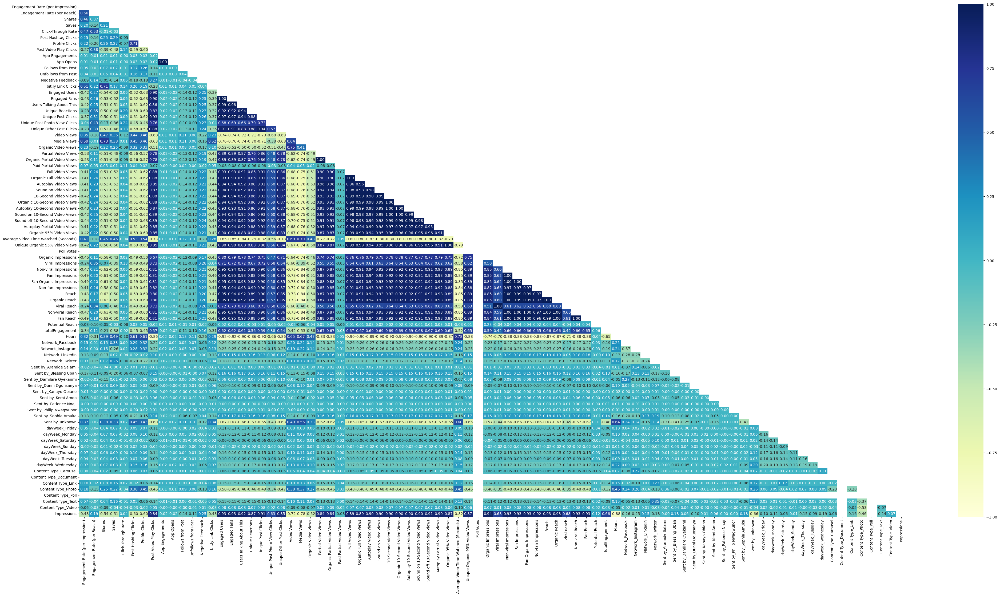

In [294]:
corr = NRX_train_df.corr()
plt.figure(figsize=(50, 25))
sb.heatmap(corr, annot=True, cmap="YlGnBu", vmin=-1, vmax=1, fmt=".2f", mask=np.triu(np.ones_like(corr, dtype=bool)))

In [295]:
col = NRX_train_df.columns
corr_list = []

for i in range(len(col) - 1):
    correlation = NRX_train_df[col[i]].corr(NRX_train_df[col[i + 1]])
    corr_list.append(correlation)

    print(i, [correlation], col[i], '/', col[i + 1])


0 [0.5582373851868426] Engagement Rate (per Impression) / Engagement Rate (per Reach)
1 [0.06696130298269633] Engagement Rate (per Reach) / Shares
2 [0.20862021876951806] Shares / Saves
3 [-0.03202200501722219] Saves / Click-Through Rate
4 [-0.05029976020900197] Click-Through Rate / Post Hashtag Clicks
5 [0.7086314439259475] Post Hashtag Clicks / Profile Clicks
6 [-0.6020396064828208] Profile Clicks / Post Video Play Clicks
7 [-0.02153784908176087] Post Video Play Clicks / App Engagements
8 [1.0] App Engagements / App Opens
9 [0.002024008635177982] App Opens / Follows from Post
10 [0.03892453964550316] Follows from Post / Unfollows from Post
11 [-0.040398462644110796] Unfollows from Post / Negative Feedback
12 [-0.040404608762308225] Negative Feedback / bit.ly Link Clicks
13 [-0.39413380384904007] bit.ly Link Clicks / Engaged Users
14 [0.9956302582844284] Engaged Users / Engaged Fans
15 [0.982265562487794] Engaged Fans / Users Talking About This
16 [0.936848825753857] Users Talking Abo

In [296]:
"""col = NRX_train_df.columns
corr_list = []

for i in range(len(col) - 1):
    correlation = NRX_train_df[col[i]].corr(NRX_train_df[col[i + 2]])
    corr_list.append(correlation)

    print(i, [correlation], col[i], '/', col[i + 2])"""

"col = NRX_train_df.columns\ncorr_list = []\n\nfor i in range(len(col) - 1):\n    correlation = NRX_train_df[col[i]].corr(NRX_train_df[col[i + 2]])\n    corr_list.append(correlation)\n\n    print(i, [correlation], col[i], '/', col[i + 2])"

In [297]:
drop_col = ['App Opens', 'Engaged Fans', 'Users Talking About This', 'Organic Partial Video Views', 'Organic Full Video Views', 
'Sound on Video Views', 'Organic 10-Second Video Views', 'Sound on 10-Second Video Views', 'Sound off 10-Second Video Views',
'Organic Impressions', 'Fan Impressions', 'Organic Reach', 'Fan Reach', 
'Unique Other Post Clicks', 'Autoplay Video Views', 'Autoplay 10-Second Video Views', 'Autoplay Partial Video Views',
'Unique Organic 95% Video Views', 'Non-viral Impressions', 'Full Video Views', 'Engaged Users', 'Unique Post Clicks',
'10-Second Video Views','Fan Organic Impressions', 'Reach','Non-viral Reach','Viral Reach', 'Organic 95% Video Views',
 'Post Video Play Clicks','Partial Video Views','Organic 95% Video Views', 'Non-fan Impressions', 'Unique Reactions']

In [298]:
NRX_train_df1 = NRX_train_df.drop(columns = drop_col)

<Axes: >

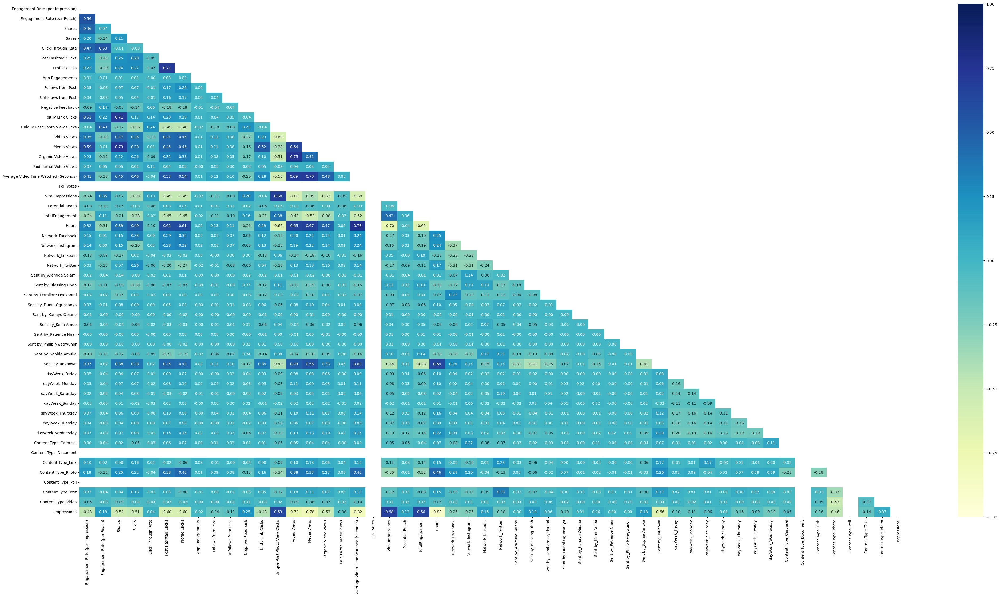

In [299]:
corr = NRX_train_df1.corr()
plt.figure(figsize=(50, 25))
sb.heatmap(corr, annot=True, cmap="YlGnBu", vmin=-1, vmax=1, fmt=".2f", mask=np.triu(np.ones_like(corr, dtype=bool)))

In [300]:
NRX_train_df1.drop(columns = ['Impressions'], inplace= True)

In [301]:
NRX_train_df1
NRX_train_df1.columns

Index(['Engagement Rate (per Impression)', 'Engagement Rate (per Reach)',
       'Shares', 'Saves', 'Click-Through Rate', 'Post Hashtag Clicks',
       'Profile Clicks', 'App Engagements', 'Follows from Post',
       'Unfollows from Post', 'Negative Feedback', 'bit.ly Link Clicks',
       'Unique Post Photo View Clicks', 'Video Views', 'Media Views',
       'Organic Video Views', 'Paid Partial Video Views',
       'Average Video Time Watched (Seconds)', 'Poll Votes',
       'Viral Impressions', 'Potential Reach', 'totalEngagement', 'Hours',
       'Network_Facebook', 'Network_Instagram', 'Network_LinkedIn',
       'Network_Twitter', 'Sent by_Aramide Salami', 'Sent by_Blessing Ubah',
       'Sent by_Damilare Oyekanmi', 'Sent by_Dunni Ogunsanya',
       'Sent by_Kanayo Obiano', 'Sent by_Kemi Amoo', 'Sent by_Patience Nnaji',
       'Sent by_Philip Nwagwunor', 'Sent by_Sophia Amuka', 'Sent by_unknown',
       'dayWeek_Friday', 'dayWeek_Monday', 'dayWeek_Saturday',
       'dayWeek_Sunday', 

In [302]:
len(NRX_train_df1.columns)

51

In [303]:
from sklearn.feature_selection import RFE
from sklearn.linear_model import LinearRegression
X = NRX_train_df1.values
Y = y_train
model = LinearRegression() 
rfe = RFE(model, n_features_to_select= 10)
fit = rfe.fit(X,Y) 
print(fit.support_)
print(fit.ranking_)

[False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False  True  True  True  True False  True False  True False  True  True
 False  True  True]
[19 29 20 37 28 38 34 23 22 39 40 36 32 35 27 30 31 25 18 26 24 21 33 17
 16 14 15 10  6  9 13  5  8  4 12  7 11  1  1  1  1  2  1  3  1 42  1  1
 41  1  1]


In [304]:
RFE_ = [name for name, value in zip(NRX_train_df1.columns, fit.ranking_) if value == 1]
len(RFE_)

10

In [305]:
X_train = NRX_train_df1[RFE_].values
X_testdf = pd.DataFrame(NRX_test, columns = features)
X_test = X_testdf[RFE_].values

In [194]:
# Spot-Check Algorithms
models = []
models.append(('LR', LinearRegression()))
models.append(('Ridge', Ridge()))
models.append(('Lasso', Lasso()))
models.append(('KNN', KNeighborsRegressor()))
models.append(('CART', DecisionTreeRegressor()))
models.append(('RF', RandomForestRegressor()))
models.append(('SVM', SVR()))

# Evaluate each model in turn
results = []
names = []
for name, model in models:
    kfold = KFold(n_splits=10, random_state= None)
    cv_results = cross_val_score(model, X_train, y_train, cv=kfold, scoring='neg_mean_absolute_error')
    results.append(cv_results)
    names.append(name)
    msg = "%s: %f (%f)" % (name, cv_results.mean(), cv_results.std())
    print(msg)

LR: -0.623600 (0.016790)
Ridge: -0.671299 (0.016011)
Lasso: -2.175651 (0.058418)
KNN: -0.462785 (0.023610)
CART: -0.516826 (0.037287)
RF: -0.460626 (0.030552)
SVM: -0.519265 (0.027617)


In [195]:
# Display results
for i in range(len(names)):
    print(f"{names[i]}: Mean MAE: {abs(results[i]).mean()}, Standard Deviation: {results[i].std()}")

LR: Mean MAE: 0.623600288979707, Standard Deviation: 0.016789943098580774
Ridge: Mean MAE: 0.6712994639244758, Standard Deviation: 0.016011046259843887
Lasso: Mean MAE: 2.17565108095226, Standard Deviation: 0.05841820022058159
KNN: Mean MAE: 0.46278539763330356, Standard Deviation: 0.023609679551670038
CART: Mean MAE: 0.5168255155507208, Standard Deviation: 0.03728749266632407
RF: Mean MAE: 0.46062602642517464, Standard Deviation: 0.030552317691007986
SVM: Mean MAE: 0.5192653645689043, Standard Deviation: 0.027617201135584954


In [196]:
model = LinearRegression()
model.fit(X_train,y_train)
y_predict = model.predict(X_test)
mae = mean_absolute_error(y_test, y_predict)
mae

0.6273205542059461

In [197]:
model = Ridge()
model.fit(X_train,y_train)
y_predict = model.predict(X_test)
mae = mean_absolute_error(y_test, y_predict)
mae

0.6710815176429374

In [198]:
0.6146178741993293

0.6146178741993293

In [199]:
model = Ridge()
model.fit(X_train,y_train)
y_predict = model.predict(X_test)
mae = mean_absolute_error(y_test, y_predict)
mae

0.6710815176429374

In [200]:
y_predict = model.predict(X_test)

In [201]:
mae = mean_absolute_error(y_test, y_predict)
mae

0.6710815176429374

In [202]:
model.score(X_train,y_train)

0.8748764306746228

In [203]:
y_test_predict_df = pd.DataFrame(y_test, columns = ['y_test'])
y_test_predict_df['y_predict'] = y_predict

In [204]:
y_test_predict_df.sample(10)

,y_test,y_predict
2264,8.633909,8.260166
2004,8.735847,8.606565
2155,8.333991,8.475409
630,7.314553,7.176502
2425,8.340456,8.039788
3523,7.920810,8.837923
1245,8.738094,8.535645
3645,8.066835,8.505294
3190,8.392083,8.084062
1273,8.291797,7.878067


In [205]:
"""# Tune scaled Ridge
ridge = Ridge()
param_grid = {'alpha': [0.001, 0.002, 0 , 0.0001, 0.1, 1, 10, 100]}
grid_search = GridSearchCV(ridge, param_grid, scoring='neg_mean_absolute_error', cv=5)
grid_search.fit(X_train, y_train)
best_params = grid_search.best_params_
print("Best Hyperparameters:", best_params)
"""

'# Tune scaled Ridge\nridge = Ridge()\nparam_grid = {\'alpha\': [0.001, 0.002, 0 , 0.0001, 0.1, 1, 10, 100]}\ngrid_search = GridSearchCV(ridge, param_grid, scoring=\'neg_mean_absolute_error\', cv=5)\ngrid_search.fit(X_train, y_train)\nbest_params = grid_search.best_params_\nprint("Best Hyperparameters:", best_params)\n'